In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('txr_1.csv')

In [3]:
examsttns = df['EXAMSTTN'].value_counts()
for i,j in examsttns.items():
    print(f'{i} : {j}')

DDU : 9553
BLEY : 7087
NKJ : 6594
GD : 5472
BSL : 4854
GIMY : 4095
STA : 3772
RYD : 3711
ICDD : 3680
TICD : 3574
SMP : 3100
KRCA : 3041
BNDM : 2804
FL : 2593
NJPT : 2492
KJGY : 2446
HAPA : 2372
BKEY : 2343
ADTP : 2312
KTTY : 2287
NGCT : 2150
RDM : 2021
BKDC : 1971
BZA : 1875
GY : 1834
BPA : 1815
BRWD : 1813
PTRU : 1811
PRDP : 1677
BJE : 1651
PEH : 1573
DBEC : 1536
OBR : 1480
PKR : 1399
TNPM : 1376
EMTY : 1330
COA : 1272
MLDT : 1271
OEC : 1242
BIA : 1196
SSB : 1180
JSWT : 1169
NHYD : 1148
GMC : 1145
UDLU : 1138
DICD : 1136
NBQY : 1135
HPT : 1075
JTJ : 1070
SGWF : 1063
SMYD : 1062
GHZ : 1062
JUC : 1052
FPY : 1044
PLPC : 1036
UMB : 994
BTI : 991
MRJ : 959
JSWD : 952
BAD : 944
NPRY : 941
DPS : 911
NLPD : 876
NATD : 868
DKJ : 803
ED : 793
WDD : 782
DD : 727
MXA : 721
SNF : 702
ETYD : 654
KLMG : 640
CTKR : 612
TKD : 607
AJNI : 586
LDH : 577
MKPP : 566
REJN : 554
BTTR : 544
CCJS : 530
PGFS : 530
GDGH : 521
CT : 518
MVN : 515
ET : 499
ADRA : 494
IPN : 493
MLPM : 493
CP : 488
JMP : 483
UTCM : 4

## NKJ Exam Station - EDA

In [4]:
nkj = df[df['EXAMSTTN'] == 'NKJ'].copy()
nkj.count()

RDATE            6594
RAKETYPE         6594
EXAMSTTN         6594
ZONE             6594
ARVLTIME         6594
PLCTTIME         6594
RELSTIME         6594
DPRTTIME         6594
AR_TO_PL         6594
PL_TO_RL         6594
RL_TO_DP         6594
TOTAL_TIME       6594
R_DATEOFMONTH    6594
R_MONTH          6594
R_DAYOFWEEK      6594
R_WEEK           6594
ARVL_H           6594
PLCT_H           6594
RELS_H           6594
DPRT_H           6594
dtype: int64

In [5]:
nkj.nunique()

RDATE             365
RAKETYPE           10
EXAMSTTN            1
ZONE                1
ARVLTIME         6346
PLCTTIME         6275
RELSTIME         6221
DPRTTIME         6398
AR_TO_PL          334
PL_TO_RL          173
RL_TO_DP         1275
TOTAL_TIME       1621
R_DATEOFMONTH     365
R_MONTH            12
R_DAYOFWEEK         7
R_WEEK             53
ARVL_H             24
PLCT_H             24
RELS_H             24
DPRT_H             24
dtype: int64

In [6]:
nkj.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
276,2024-04-01,BOXN,NKJ,WC,2024-04-01 12:55:00,2024-04-01 12:55:00,2024-04-01 12:55:00,2024-04-01 13:35:00,0,0,40,40,2024-04-01,2024-04,0,W-14-2024,12,12,12,13
277,2024-04-01,BOXNHL,NKJ,WC,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,0,0,0,0,2024-04-01,2024-04,0,W-14-2024,10,10,10,10
278,2024-04-01,BOXN,NKJ,WC,2024-04-01 10:45:00,2024-04-01 11:00:00,2024-04-01 13:35:00,2024-04-01 18:10:00,15,155,275,445,2024-04-01,2024-04,0,W-14-2024,10,11,13,18
279,2024-04-01,BOXN,NKJ,WC,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,2024-04-01 14:20:00,230,0,90,320,2024-04-01,2024-04,0,W-14-2024,9,12,12,14
280,2024-04-01,BOXN,NKJ,WC,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,0,0,120,120,2024-04-01,2024-04,0,W-14-2024,4,4,4,6


In [7]:
print(nkj['RAKETYPE'].nunique())
nkj['RAKETYPE'].value_counts()

10


RAKETYPE
BOXN         3413
BOXNHL       2837
BCN           216
BOXNHL25T      64
BTAP           35
BCNAHSM1       17
BOXNEL          8
BV              2
BOBSNM1         1
BOBYN           1
Name: count, dtype: int64

In [8]:
print(nkj['ZONE'].nunique())
nkj['ZONE'].value_counts()

1


ZONE
WC    6594
Name: count, dtype: int64

#### New Features

In [9]:
df1 = nkj.copy()

In [10]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [11]:
df1['ARVLTIME'] = pd.to_datetime(df1['ARVLTIME'], format='%Y-%m-%d %H:%M:%S')
df1['PLCTTIME'] = pd.to_datetime(df1['PLCTTIME'], format='%Y-%m-%d %H:%M:%S')
df1['RELSTIME'] = pd.to_datetime(df1['RELSTIME'], format='%Y-%m-%d %H:%M:%S')
df1['DPRTTIME'] = pd.to_datetime(df1['DPRTTIME'], format='%Y-%m-%d %H:%M:%S')

In [12]:
df1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
0,2024-04-01,BOXN,NKJ,WC,2024-04-01 02:20:00,2024-04-01 02:40:00,2024-04-01 05:40:00,2024-04-01 13:24:00,20,180,464,664,2024-04-01,2024-04,0,W-14-2024,2,2,5,13
1,2024-04-01,BOXN,NKJ,WC,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 05:00:00,2024-04-01 07:10:00,125,0,130,255,2024-04-01,2024-04,0,W-14-2024,2,5,5,7
2,2024-04-01,BOXN,NKJ,WC,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,0,0,120,120,2024-04-01,2024-04,0,W-14-2024,4,4,4,6
3,2024-04-01,BOXN,NKJ,WC,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,2024-04-01 14:20:00,230,0,90,320,2024-04-01,2024-04,0,W-14-2024,9,12,12,14
4,2024-04-01,BOXNHL,NKJ,WC,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,0,0,0,0,2024-04-01,2024-04,0,W-14-2024,10,10,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,2025-03-31,BOXNHL,NKJ,WC,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 12:12:00,0,0,77,77,2025-03-31,2025-03,0,W-14-2025,10,10,10,12
6590,2025-03-31,BOXN,NKJ,WC,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:54:00,0,0,54,54,2025-03-31,2025-03,0,W-14-2025,16,16,16,16
6591,2025-03-31,BOXN,NKJ,WC,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:10:00,0,0,10,10,2025-03-31,2025-03,0,W-14-2025,18,18,18,18
6592,2025-03-31,BOXNHL,NKJ,WC,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 21:35:00,0,0,155,155,2025-03-31,2025-03,0,W-14-2025,19,19,19,21


In [13]:
# Count of rakes in shunting time (AR_TO_PL) when the current rake arrives
# Shunting time for a rake is from its ARVLTIME to its PLCTTIME

num_rakes_shunting = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have arrived BEFORE or AT current_arrival_time
    # AND whose placement time is AFTER current_arrival_time
    # (meaning they are still in shunting phase)
    # Exclude the current rake itself from the count if its ARVLTIME == current_arrival_time
        
    # Filter for rakes whose shunting period overlaps with the current_arrival_time
    # A rake is in shunting if current_arrival_time is between its ARVLTIME and PLCTTIME
        
    # Filter rakes that started shunting before or at the current rake's arrival time
    potential_rakes = df1[(df1['ARVLTIME'] <= current_arrival_time) & (df1.index != i)]
        
    # From those, count how many are still in shunting phase (their PLCTTIME is in the future relative to current_arrival_time)
    count = potential_rakes[potential_rakes['PLCTTIME'] > current_arrival_time].shape[0]
    num_rakes_shunting.append(count)
df1['Num_Rakes_Shunting_At_ARVL'] = num_rakes_shunting

In [14]:
df1[['ARVLTIME', 'PLCTTIME', 'Num_Rakes_Shunting_At_ARVL']]

,ARVLTIME,PLCTTIME,Num_Rakes_Shunting_At_ARVL
0,2024-04-01 02:20:00,2024-04-01 02:40:00,0
1,2024-04-01 02:55:00,2024-04-01 05:00:00,0
2,2024-04-01 04:30:00,2024-04-01 04:30:00,1
3,2024-04-01 09:00:00,2024-04-01 12:50:00,0
4,2024-04-01 10:30:00,2024-04-01 10:30:00,1
...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,0
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,0
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,0
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,0


In [15]:
# Count of rakes in examination time (PL_TO_RL) when the current rake arrives
# Examination time for a rake is from its PLCTTIME to its RELSTIME

num_rakes_exam = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been placed BEFORE or AT current_arrival_time
    # AND whose release time is AFTER current_arrival_time
    # (meaning they are still in examination phase)
            
    potential_rakes = df1[(df1['PLCTTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_arrival_time].shape[0]
    num_rakes_exam.append(count)
df1['Num_Rakes_Exam_At_ARVL'] = num_rakes_exam

In [16]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'Num_Rakes_Exam_At_ARVL']]

,ARVLTIME,PLCTTIME,RELSTIME,Num_Rakes_Exam_At_ARVL
0,2024-04-01 02:20:00,2024-04-01 02:40:00,2024-04-01 05:40:00,0
1,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 05:00:00,1
2,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,1
3,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,0
4,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,0
...,...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 10:55:00,2
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:00:00,0
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,0
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 19:00:00,0


In [17]:
# Count of rakes in departure time (RL_TO_DP) when the current rake arrives
# Departure time for a rake is from its RELSTIME to its DPRTTIME

num_rakes_departure = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been released BEFORE or AT current_arrival_time
    # AND whose departure time is AFTER current_arrival_time
    # (meaning they are still in departure phase)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_arrival_time].shape[0]
    num_rakes_departure.append(count)
df1['Num_Rakes_Departure_At_ARVL'] = num_rakes_departure

In [18]:
df1[['ARVLTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_ARVL']]

,ARVLTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_ARVL
0,2024-04-01 02:20:00,2024-04-01 05:40:00,2024-04-01 13:24:00,0
1,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 07:10:00,0
2,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,0
3,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 14:20:00,1
4,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,1
...,...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 12:12:00,6
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:54:00,5
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:10:00,4
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 21:35:00,3


In [19]:
num_rakes_exam_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Identifying other rakes that are in their examination phase at this 'current_placement_time'.
    # A rake 'other_rake' is in examination if:
    # 1. Its placement time (start of exam) is less than or equal to 'current_placement_time'.
    # 2. Its release time (end of exam) is greater than 'current_placement_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['PLCTTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_placement_time].shape[0]
    num_rakes_exam_at_placement.append(count)
        
df1['Num_Rakes_Exam_At_PLCT'] = num_rakes_exam_at_placement

In [20]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Exam_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Exam_At_PLCT
0,2024-04-01 02:20:00,2024-04-01 02:40:00,2024-04-01 05:40:00,2024-04-01 13:24:00,0
1,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 05:00:00,2024-04-01 07:10:00,1
2,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,1
3,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,2024-04-01 14:20:00,1
4,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,0
...,...,...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 12:12:00,2
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:54:00,0
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:10:00,0
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 21:35:00,0


In [21]:
# Count of rakes in departure time (RL_TO_DP) when the current rake is in its examination time
# This means, for a current rake (i), count others that are in RL_TO_DP phase
# at the current rake's PLCTTIME (start of examination) or RELSTIME (end of examination, start of departure phase)
# The request states "at the point of time when the current rakes is in their examination time".
# Let's interpret this as the *start* of the current rake's examination, which is PLCTTIME, as it's a fixed point.

num_rakes_departure_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Count rakes that have been released BEFORE or AT current_placement_time
    # AND whose departure time is AFTER current_placement_time
    # (meaning they are still in departure phase)
    # Exclude the current rake itself if its RELSTIME or DPRTTIME overlap (though unlikely here)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_placement_time].shape[0]
    num_rakes_departure_at_placement.append(count)
df1['Num_Rakes_Departure_At_PLCT'] = num_rakes_departure_at_placement

In [22]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_PLCT
0,2024-04-01 02:20:00,2024-04-01 02:40:00,2024-04-01 05:40:00,2024-04-01 13:24:00,0
1,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 05:00:00,2024-04-01 07:10:00,1
2,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,0
3,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,2024-04-01 14:20:00,2
4,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,1
...,...,...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 12:12:00,6
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:54:00,5
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:10:00,4
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 21:35:00,3


In [23]:
num_rakes_departure_at_release = []
for i, current_rake in df1.iterrows():
    current_release_time = current_rake['RELSTIME']
        
    # Identifying other rakes that are in their departure phase at this 'current_release_time'.
    # A rake 'other_rake' is in departure if:
    # 1. Its release time (start of departure) is less than or equal to 'current_release_time'.
    # 2. Its departure time (end of departure) is greater than 'current_release_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_release_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_release_time].shape[0]
    num_rakes_departure_at_release.append(count)
        
df1['Num_Rakes_Departure_At_RELS'] = num_rakes_departure_at_release

In [24]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_RELS']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_RELS
0,2024-04-01 02:20:00,2024-04-01 02:40:00,2024-04-01 05:40:00,2024-04-01 13:24:00,2
1,2024-04-01 02:55:00,2024-04-01 05:00:00,2024-04-01 05:00:00,2024-04-01 07:10:00,1
2,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 04:30:00,2024-04-01 06:30:00,0
3,2024-04-01 09:00:00,2024-04-01 12:50:00,2024-04-01 12:50:00,2024-04-01 14:20:00,2
4,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,2024-04-01 10:30:00,1
...,...,...,...,...,...
6589,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 10:55:00,2025-03-31 12:12:00,6
6590,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:00:00,2025-03-31 16:54:00,5
6591,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:00:00,2025-03-31 18:10:00,4
6592,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 19:00:00,2025-03-31 21:35:00,3


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6594 entries, 0 to 6593
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        6594 non-null   object        
 1   RAKETYPE                     6594 non-null   object        
 2   EXAMSTTN                     6594 non-null   object        
 3   ZONE                         6594 non-null   object        
 4   ARVLTIME                     6594 non-null   datetime64[ns]
 5   PLCTTIME                     6594 non-null   datetime64[ns]
 6   RELSTIME                     6594 non-null   datetime64[ns]
 7   DPRTTIME                     6594 non-null   datetime64[ns]
 8   AR_TO_PL                     6594 non-null   int64         
 9   PL_TO_RL                     6594 non-null   int64         
 10  RL_TO_DP                     6594 non-null   int64         
 11  TOTAL_TIME                   6594 non-null 

In [26]:
# Time since last Arrival
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)
df1['Time_Since_Last_ARVL'] = df1.groupby('EXAMSTTN')['ARVLTIME'].diff().dt.total_seconds()//60

In [27]:
# Time since last Placement
df1 = df1.sort_values(by='PLCTTIME').reset_index(drop=True)
df1['Time_Since_Last_PLCT'] = df1.groupby('EXAMSTTN')['PLCTTIME'].diff().dt.total_seconds()//60

In [28]:
df1 = df1.sort_values(by='RELSTIME').reset_index(drop=True)
df1['Time_Since_Last_RELS'] = df1.groupby('EXAMSTTN')['RELSTIME'].diff().dt.total_seconds()//60

In [29]:
df1 = df1.sort_values(by='DPRTTIME').reset_index(drop=True)
df1['Time_Since_Last_DPRT'] = df1.groupby('EXAMSTTN')['DPRTTIME'].diff().dt.total_seconds()//60

In [30]:
df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']] = \
    df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']].fillna(0)

In [31]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [32]:
df1[['ARVLTIME', 'Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']]

,ARVLTIME,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01 02:20:00,0.0,0.0,40.0,174.0
1,2024-04-01 02:55:00,35.0,30.0,30.0,40.0
2,2024-04-01 04:30:00,95.0,110.0,0.0,0.0
3,2024-04-01 09:00:00,270.0,45.0,45.0,45.0
4,2024-04-01 10:30:00,90.0,330.0,290.0,200.0
...,...,...,...,...,...
6589,2025-03-31 10:55:00,35.0,35.0,35.0,7.0
6590,2025-03-31 16:00:00,305.0,305.0,250.0,90.0
6591,2025-03-31 18:00:00,120.0,120.0,120.0,10.0
6592,2025-03-31 19:00:00,0.0,0.0,0.0,15.0


In [33]:
df1.drop(columns=['ARVLTIME','PLCTTIME','RELSTIME','DPRTTIME'], axis=1, inplace=True)

In [34]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6594 entries, 0 to 6593
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   RDATE                        6594 non-null   object 
 1   RAKETYPE                     6594 non-null   object 
 2   EXAMSTTN                     6594 non-null   object 
 3   ZONE                         6594 non-null   object 
 4   AR_TO_PL                     6594 non-null   int64  
 5   PL_TO_RL                     6594 non-null   int64  
 6   RL_TO_DP                     6594 non-null   int64  
 7   TOTAL_TIME                   6594 non-null   int64  
 8   R_DATEOFMONTH                6594 non-null   object 
 9   R_MONTH                      6594 non-null   object 
 10  R_DAYOFWEEK                  6594 non-null   int64  
 11  R_WEEK                       6594 non-null   object 
 12  ARVL_H                       6594 non-null   int64  
 13  PLCT_H            

#### Monthly Analysis

In [35]:
nkj_monthly = df1['R_MONTH'].value_counts(sort=False).reset_index()
nkj_monthly.columns =['R_MONTH','RAKE_COUNT']
nkj_monthly = pd.DataFrame(nkj_monthly)

monthly_shunting_time_sum = df1.groupby('R_MONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby('R_MONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby('R_MONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

nkj_monthly['AVG_SHUNTING_TIME'] = monthly_shunting_time_sum['Shunting_Time'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_EXAMINATION_TIME'] = monthly_examination_time_sum['Examination_Time'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_DEPARTURE_TIME'] = monthly_departure_lag_time_sum['Departure_Lag'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_numrakes1['numrakes1'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_numrakes2['numrakes2'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_numrakes3['numrakes3'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_numrakes4['numrakes4'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_numrakes5['numrakes5'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Num_Rakes_Departure_At_RELS'] = monthly_numrakes6['numrakes6'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Time_Since_Last_ARVL'] = monthly_timesince1['timesince1'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Time_Since_Last_PLCT'] = monthly_timesince2['timesince2'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Time_Since_Last_RELS'] = monthly_timesince3['timesince3'] / nkj_monthly['RAKE_COUNT']
nkj_monthly['AVG_Time_Since_Last_DPRT'] = monthly_timesince4['timesince4'] / nkj_monthly['RAKE_COUNT']

nkj_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,579,41.725389,137.188256,295.037997,0.573402,1.794473,4.013817,1.747841,4.063903,3.853195,73.725389,73.670121,73.652850,73.911917
1,2024-05,617,45.145867,142.418152,353.418152,0.628849,1.977310,4.790924,1.987034,4.792545,4.739060,71.761750,71.628849,71.701783,72.076175
2,2024-06,592,39.635135,140.194257,311.685811,0.508446,1.864865,4.219595,1.790541,4.283784,4.216216,73.021959,73.420608,73.724662,73.131757
3,2024-07,573,48.858639,136.561955,366.881326,0.563700,1.781850,4.729494,1.734729,4.671902,4.565445,77.764398,77.574171,77.155323,77.643979
4,2024-08,532,120.734962,155.701128,444.389098,1.432331,1.768797,5.315789,1.759398,5.283835,5.152256,83.359023,83.133459,83.819549,84.139098
5,2024-09,577,46.211438,152.922010,500.436742,0.585789,2.032929,6.828423,1.953206,6.880416,6.743501,75.256499,75.637782,75.022530,74.961872
6,2024-10,574,60.080139,165.858885,549.226481,0.700348,2.057491,6.980836,1.982578,7.052265,6.763066,77.376307,77.787456,77.996516,77.778746
7,2024-11,373,67.380697,152.512064,539.989276,0.538874,1.230563,4.627346,1.211796,4.613941,4.501340,117.557641,116.635389,116.206434,115.723861
8,2024-12,478,68.027197,157.548117,547.470711,0.690377,1.644351,5.874477,1.587866,5.830544,5.633891,92.771967,92.813808,92.458159,93.562762
9,2025-01,554,49.384477,157.657040,484.092058,0.610108,1.812274,6.106498,1.796029,6.122744,5.947653,80.512635,80.523466,81.281588,80.501805


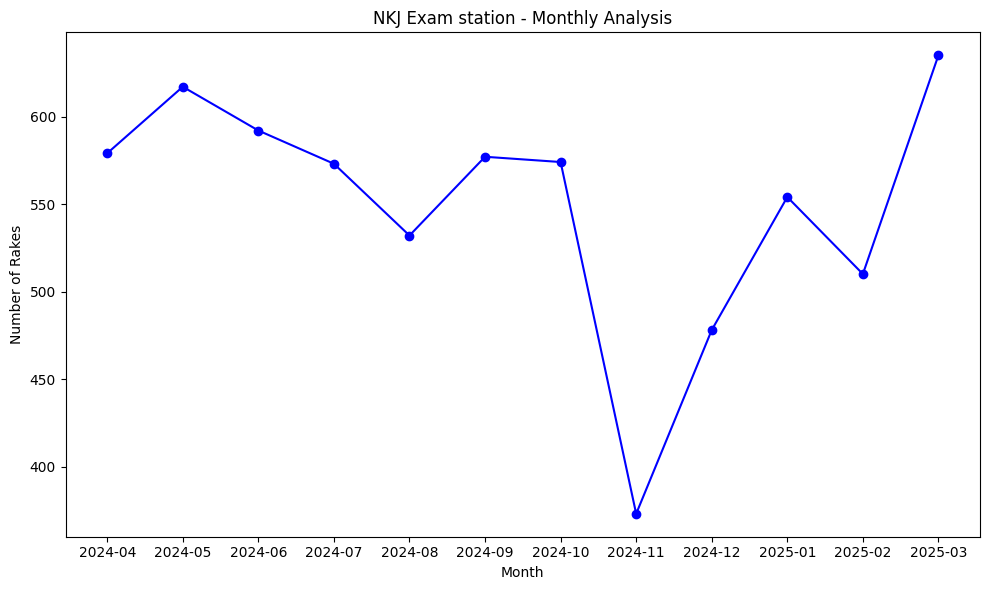

In [36]:
plt.figure(figsize=(10,6))
plt.plot(nkj_monthly['R_MONTH'], nkj_monthly['RAKE_COUNT'], marker='o', linestyle='-', color='blue')
plt.title('NKJ Exam station - Monthly Analysis')
plt.xlabel('Month')
plt.ylabel('Number of Rakes')
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2727714502.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2727714502.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2727714502.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_mont

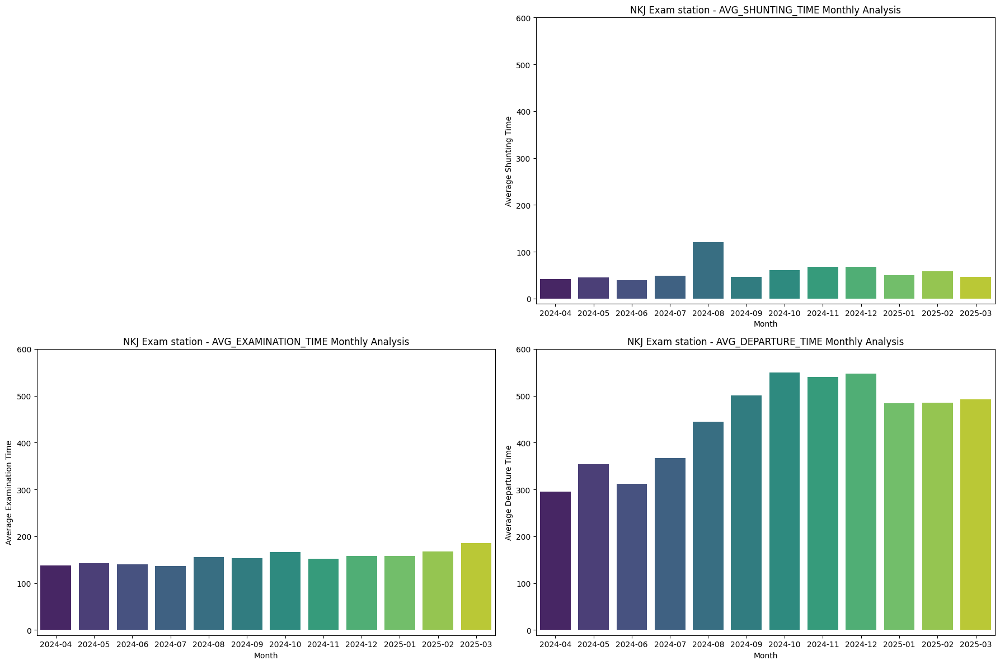

In [37]:
min_y = min(nkj_monthly['AVG_SHUNTING_TIME'].min(),
            nkj_monthly['AVG_EXAMINATION_TIME'].min(),
            nkj_monthly['AVG_DEPARTURE_TIME'].min())

max_y = max(nkj_monthly['AVG_SHUNTING_TIME'].max(),
            nkj_monthly['AVG_EXAMINATION_TIME'].max(),
            nkj_monthly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].axis('off')

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_SHUNTING_TIME Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_EXAMINATION_TIME Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('NKJ Exam station - AVG_DEPARTURE_TIME Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\1031051911.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\1031051911.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\1031051911.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns

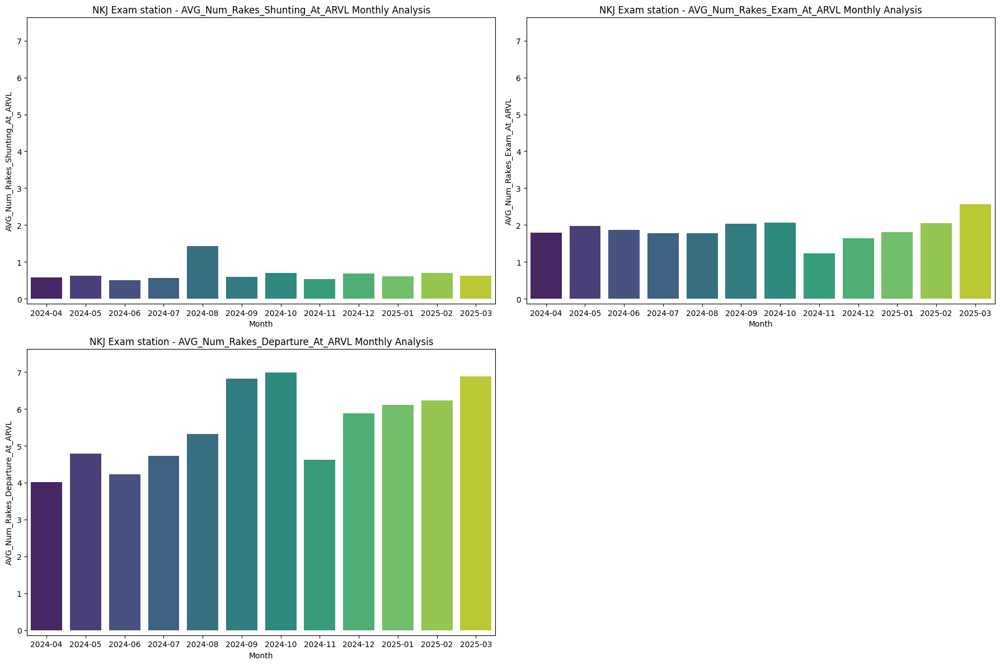

In [38]:
min_y = min(nkj_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            nkj_monthly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(nkj_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            nkj_monthly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2755251568.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2755251568.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2755251568.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sn

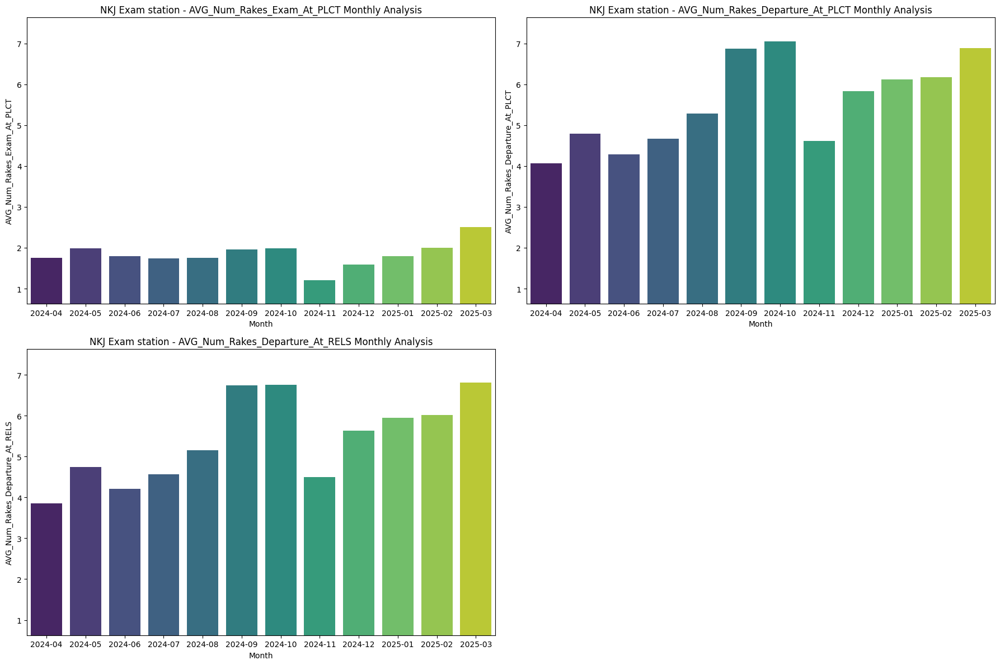

In [39]:
min_y = min(nkj_monthly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(nkj_monthly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            nkj_monthly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [40]:
nkj_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,579,41.725389,137.188256,295.037997,0.573402,1.794473,4.013817,1.747841,4.063903,3.853195,73.725389,73.670121,73.652850,73.911917
1,2024-05,617,45.145867,142.418152,353.418152,0.628849,1.977310,4.790924,1.987034,4.792545,4.739060,71.761750,71.628849,71.701783,72.076175
2,2024-06,592,39.635135,140.194257,311.685811,0.508446,1.864865,4.219595,1.790541,4.283784,4.216216,73.021959,73.420608,73.724662,73.131757
3,2024-07,573,48.858639,136.561955,366.881326,0.563700,1.781850,4.729494,1.734729,4.671902,4.565445,77.764398,77.574171,77.155323,77.643979
4,2024-08,532,120.734962,155.701128,444.389098,1.432331,1.768797,5.315789,1.759398,5.283835,5.152256,83.359023,83.133459,83.819549,84.139098
5,2024-09,577,46.211438,152.922010,500.436742,0.585789,2.032929,6.828423,1.953206,6.880416,6.743501,75.256499,75.637782,75.022530,74.961872
6,2024-10,574,60.080139,165.858885,549.226481,0.700348,2.057491,6.980836,1.982578,7.052265,6.763066,77.376307,77.787456,77.996516,77.778746
7,2024-11,373,67.380697,152.512064,539.989276,0.538874,1.230563,4.627346,1.211796,4.613941,4.501340,117.557641,116.635389,116.206434,115.723861
8,2024-12,478,68.027197,157.548117,547.470711,0.690377,1.644351,5.874477,1.587866,5.830544,5.633891,92.771967,92.813808,92.458159,93.562762
9,2025-01,554,49.384477,157.657040,484.092058,0.610108,1.812274,6.106498,1.796029,6.122744,5.947653,80.512635,80.523466,81.281588,80.501805


C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2853709128.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2853709128.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2853709128.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot

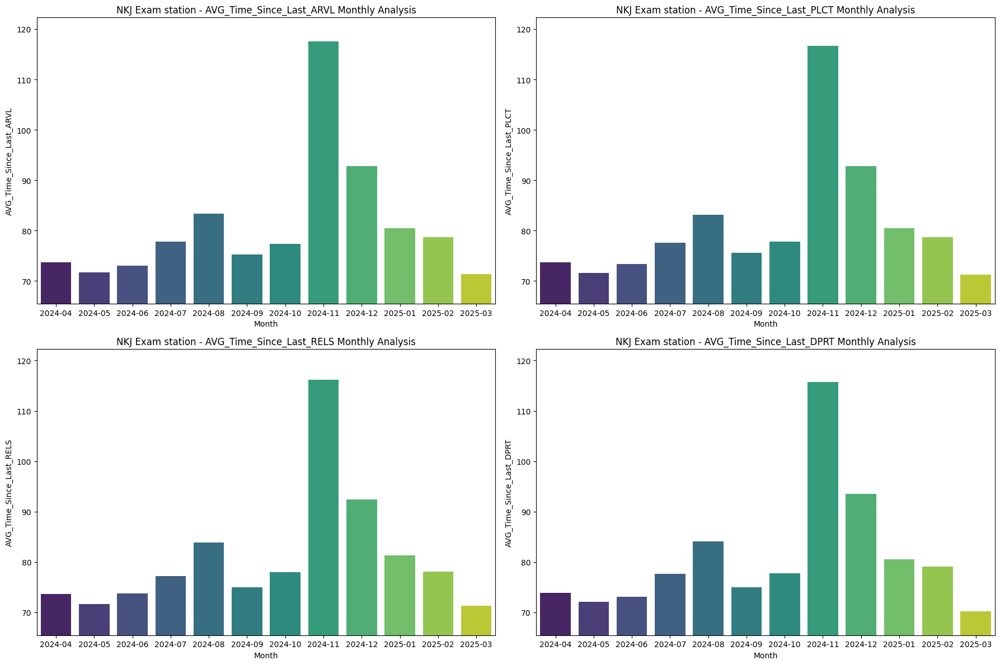

In [41]:
min_y = min(nkj_monthly['AVG_Time_Since_Last_ARVL'].min(),
            nkj_monthly['AVG_Time_Since_Last_PLCT'].min(),
            nkj_monthly['AVG_Time_Since_Last_RELS'].min(),
            nkj_monthly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(nkj_monthly['AVG_Time_Since_Last_ARVL'].max(),
            nkj_monthly['AVG_Time_Since_Last_PLCT'].max(),
            nkj_monthly['AVG_Time_Since_Last_RELS'].max(),
            nkj_monthly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Time_Since_Last_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Time_Since_Last_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Time_Since_Last_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_monthly['R_MONTH'], y=nkj_monthly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('NKJ Exam station - AVG_Time_Since_Last_DPRT Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [42]:
monthly_rake_type_count = df1.groupby(['R_MONTH', 'RAKETYPE'])['RDATE'].count().reset_index(name='RAKE_COUNT')
monthly_rake_type_count = pd.DataFrame(monthly_rake_type_count)

monthly_shunting_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_shunting_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_SHUNTING_TIME'] = monthly_rake_type_count['Shunting_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_examination_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_EXAMINATION_TIME'] = monthly_rake_type_count['Examination_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_departure_lag_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_DEPARTURE_TIME'] = monthly_rake_type_count['Departure_Lag'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_rake_type_count['numrakes1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_rake_type_count['numrakes2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_rake_type_count['numrakes3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_rake_type_count['numrakes4'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes5, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_rake_type_count['numrakes5'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes6, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'] = monthly_rake_type_count['numrakes6'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_ARVL'] = monthly_rake_type_count['timesince1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_PLCT'] = monthly_rake_type_count['timesince2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_RELS'] = monthly_rake_type_count['timesince3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_DPRT'] = monthly_rake_type_count['timesince4'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag','numrakes1','numrakes2','numrakes3','numrakes4','numrakes5','numrakes6','timesince1','timesince2','timesince3','timesince4'], axis=1, inplace=True)

monthly_rake_type_count

,R_MONTH,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,BCN,4,253.500000,102.500000,243.000000,0.500000,2.250000,5.000000,2.500000,4.500000,4.000000,45.250000,72.500000,71.250000,107.750000
1,2024-04,BOXN,361,39.662050,138.451524,296.498615,0.567867,1.814404,4.027701,1.761773,4.108033,3.889197,73.728532,72.108033,71.958449,74.138504
2,2024-04,BOXNEL,3,15.333333,155.000000,225.000000,1.333333,1.333333,3.666667,2.000000,3.000000,3.666667,41.666667,51.333333,69.666667,39.000000
3,2024-04,BOXNHL,208,41.947115,136.014423,297.173077,0.567308,1.774038,3.975962,1.721154,3.990385,3.788462,75.557692,76.538462,76.221154,73.673077
4,2024-04,BOXNHL25T,3,18.666667,95.000000,110.666667,1.000000,0.666667,4.000000,0.666667,4.333333,4.000000,16.333333,86.666667,106.666667,53.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,2025-03,BCNAHSM1,2,28.500000,175.000000,197.500000,0.000000,3.500000,8.500000,3.000000,9.000000,7.500000,106.000000,87.500000,70.000000,41.500000
69,2025-03,BOXN,320,45.250000,184.250000,476.156250,0.637500,2.546875,6.940625,2.512500,6.912500,6.781250,71.959375,68.946875,71.109375,70.934375
70,2025-03,BOXNHL,295,50.145763,189.491525,487.884746,0.596610,2.555932,6.796610,2.474576,6.830508,6.820339,71.149153,74.179661,71.766102,69.101695
71,2025-03,BOXNHL25T,2,12.500000,220.000000,258.500000,0.500000,2.000000,8.500000,2.000000,8.000000,8.000000,36.000000,27.000000,9.500000,131.000000


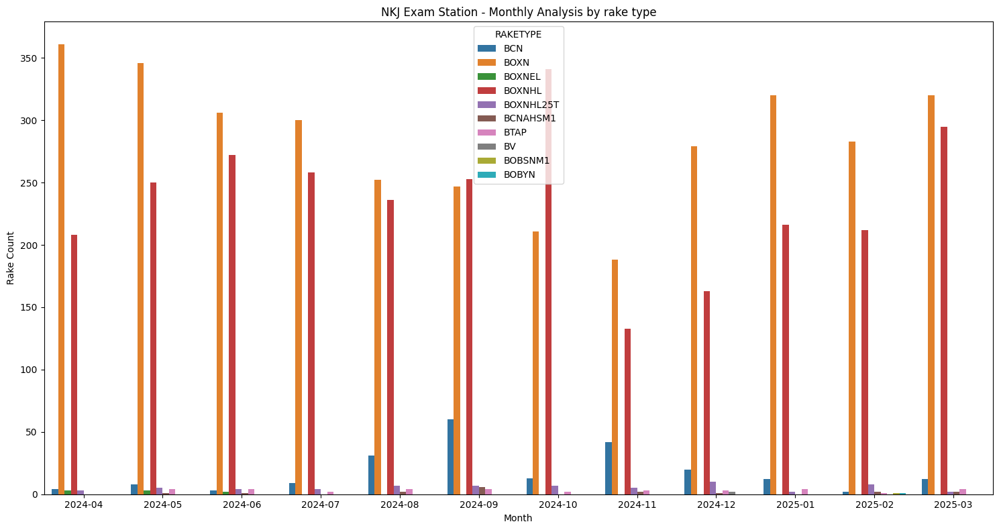

In [43]:
plt.figure(figsize=(15,8))
sns.barplot(monthly_rake_type_count, x='R_MONTH', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('NKJ Exam Station - Monthly Analysis by rake type')
plt.xlabel('Month')
plt.ylabel('Rake Count')
plt.tight_layout()
plt.show()

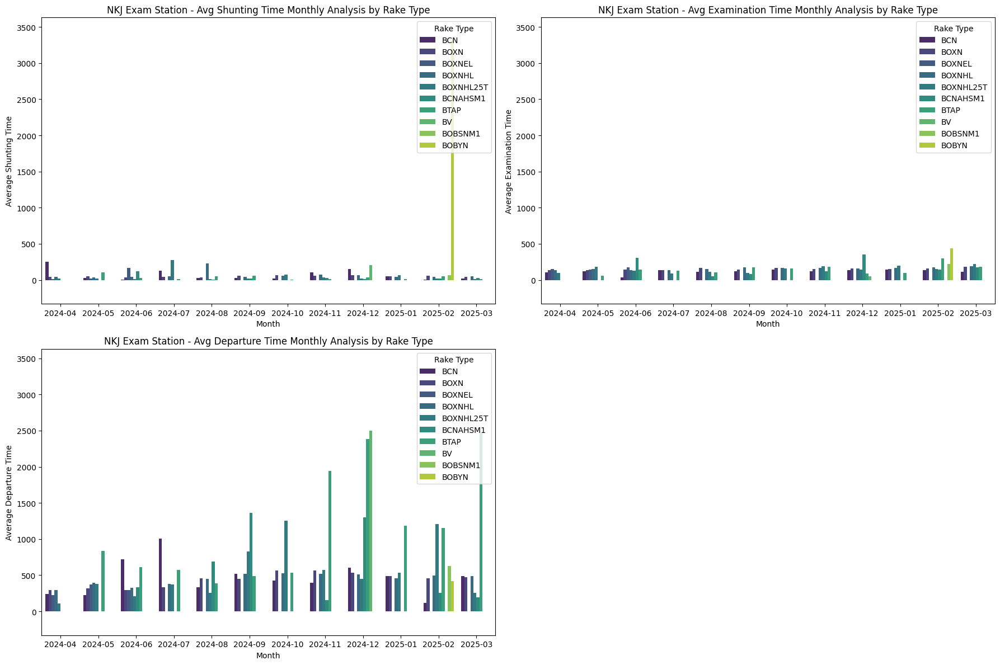

In [44]:
min_y = min(monthly_rake_type_count['AVG_SHUNTING_TIME'].min(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].min(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].min())

max_y = max(monthly_rake_type_count['AVG_SHUNTING_TIME'].max(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].max(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_SHUNTING_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam Station - Avg Shunting Time Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Average Shunting Time')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_EXAMINATION_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam Station - Avg Examination Time Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Examination Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_DEPARTURE_TIME', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam Station - Avg Departure Time Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Departure Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

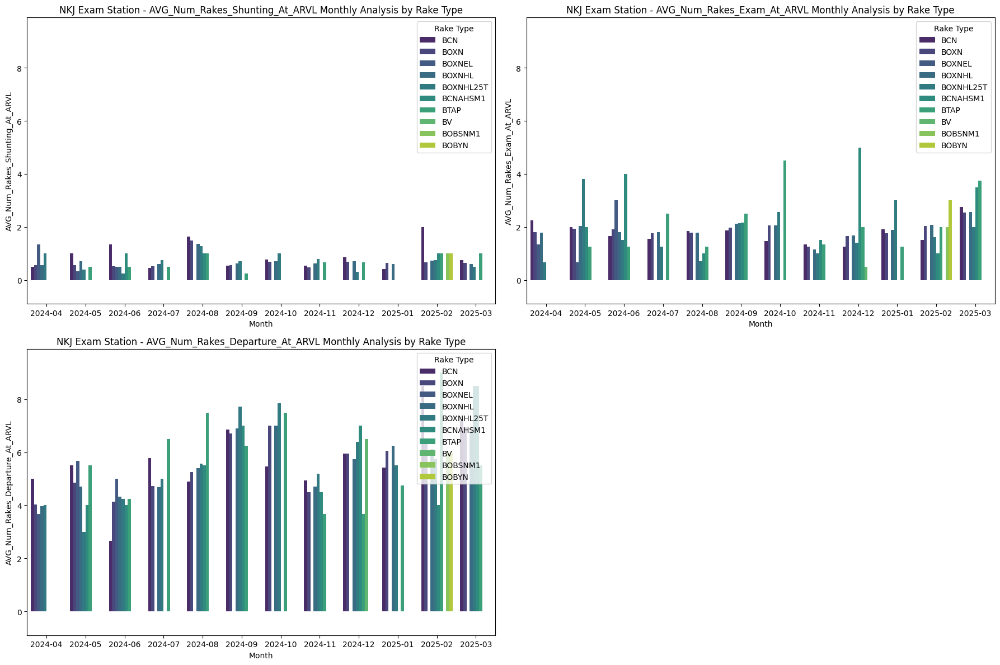

In [45]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Shunting_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

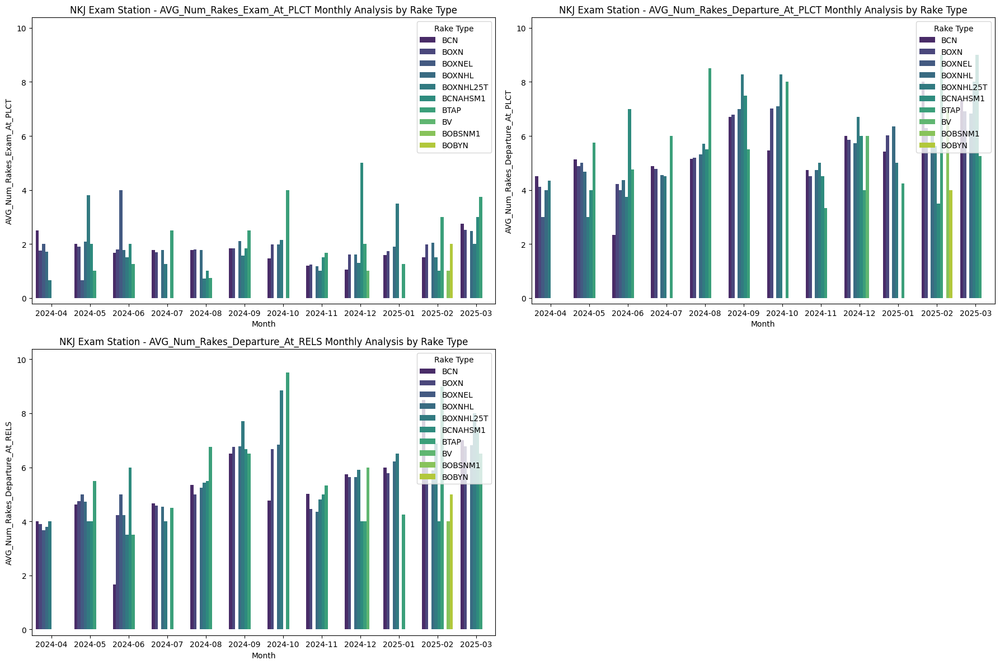

In [46]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

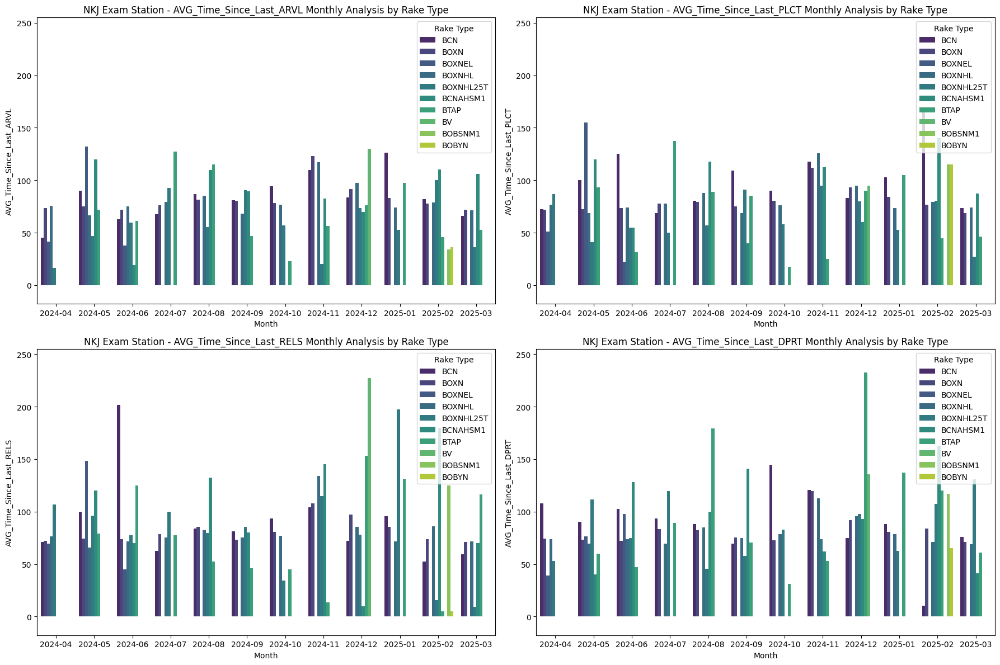

In [47]:
min_y = min(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].min())

max_y = max(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam Station - AVG_Time_Since_Last_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam Station - AVG_Time_Since_Last_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam Station - AVG_Time_Since_Last_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_DPRT', hue='RAKETYPE', palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('NKJ Exam Station - AVG_Time_Since_Last_DPRT Monthly Analysis by Rake Type')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 1].legend(title='Rake Type', loc='upper right')

plt.tight_layout()
plt.show()

#### Weekly Analysis

In [48]:
nkj_weekly = df1['R_WEEK'].value_counts(sort=False).reset_index()
nkj_weekly.columns =['R_WEEK','RAKE_COUNT']
nkj_weekly = pd.DataFrame(nkj_weekly)

weekly_shunting_time_sum = df1.groupby('R_WEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = df1.groupby('R_WEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = df1.groupby('R_WEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekly_numrakes1 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekly_numrakes2 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekly_numrakes3 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekly_numrakes4 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekly_numrakes5 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekly_numrakes6 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekly_timesince1 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekly_timesince2 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekly_timesince3 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekly_timesince4 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

nkj_weekly['AVG_SHUNTING_TIME'] = weekly_shunting_time_sum['Shunting_Time'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_EXAMINATION_TIME'] = weekly_examination_time_sum['Examination_Time'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_DEPARTURE_TIME'] = weekly_departure_lag_time_sum['Departure_Lag'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Shunting_At_ARVL'] = weekly_numrakes1['numrakes1'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Exam_At_ARVL'] = weekly_numrakes2['numrakes2'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Departure_At_ARVL'] = weekly_numrakes3['numrakes3'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Exam_At_PLCT'] = weekly_numrakes4['numrakes4'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Departure_At_PLCT'] = weekly_numrakes5['numrakes5'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Num_Rakes_Departure_At_RELS'] = weekly_numrakes6['numrakes6'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Time_Since_Last_ARVL'] = weekly_timesince1['timesince1'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Time_Since_Last_PLCT'] = weekly_timesince2['timesince2'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Time_Since_Last_RELS'] = weekly_timesince3['timesince3'] / nkj_weekly['RAKE_COUNT']
nkj_weekly['AVG_Time_Since_Last_DPRT'] = weekly_timesince4['timesince4'] / nkj_weekly['RAKE_COUNT']

nkj_weekly.head()

,R_WEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,W-14-2024,128,42.085938,113.070312,284.953125,0.515625,1.500000,3.648438,1.421875,3.773438,3.554688,74.039062,74.296875,73.789062,75.585938
1,W-15-2024,140,46.485714,152.357143,280.092857,0.671429,2.028571,3.978571,2.000000,3.914286,3.721429,69.550000,70.357143,71.535714,71.321429
2,W-16-2024,126,41.642857,160.222222,342.555556,0.531746,1.777778,4.500000,1.801587,4.500000,4.126984,83.642857,82.023810,81.388889,79.563492
3,W-17-2024,141,38.312057,120.822695,278.432624,0.588652,1.687943,3.851064,1.638298,3.978723,3.858156,71.361702,72.304965,71.453901,72.517730
4,W-18-2024,135,38.362963,117.785185,296.200000,0.592593,1.644444,3.748148,1.607407,3.837037,3.888889,72.948148,74.481481,75.481481,74.703704


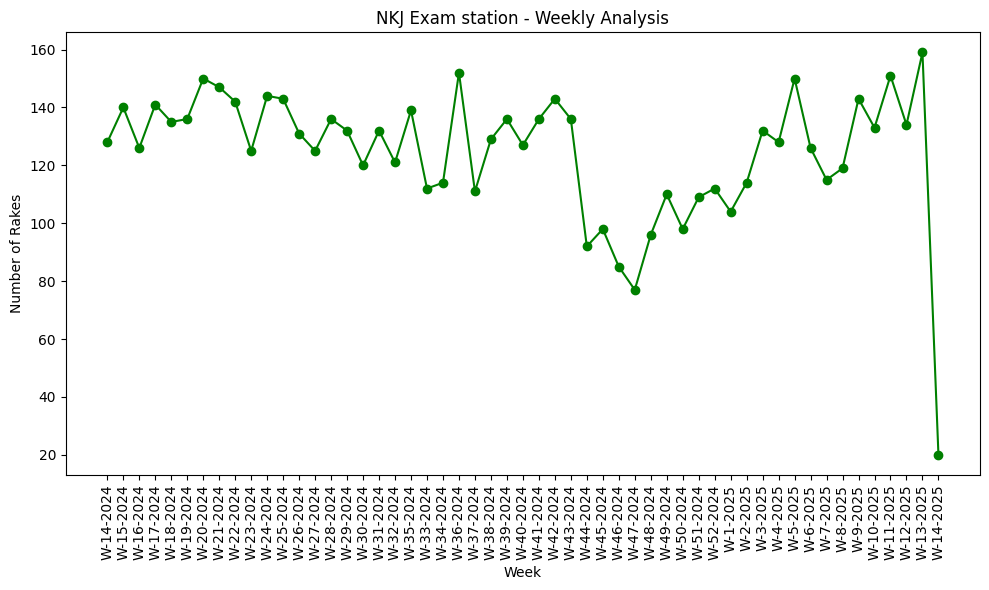

In [49]:
plt.figure(figsize=(10,6))
plt.plot(nkj_weekly['R_WEEK'], nkj_weekly['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam station - Weekly Analysis')
plt.xlabel('Week')
plt.ylabel('Number of Rakes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\3038136177.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\3038136177.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\3038136177.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anan

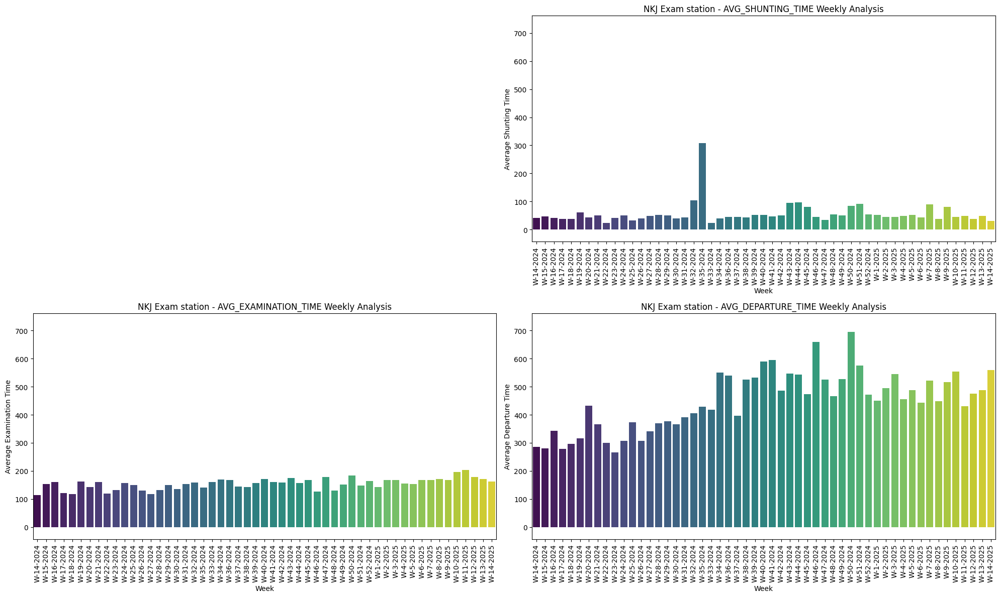

In [50]:
min_y = min(nkj_weekly['AVG_SHUNTING_TIME'].min(),
            nkj_weekly['AVG_EXAMINATION_TIME'].min(),
            nkj_weekly['AVG_DEPARTURE_TIME'].min())

max_y = max(nkj_weekly['AVG_SHUNTING_TIME'].max(),
            nkj_weekly['AVG_EXAMINATION_TIME'].max(),
            nkj_weekly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].axis('off')

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_SHUNTING_TIME Weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_EXAMINATION_TIME Weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('NKJ Exam station - AVG_DEPARTURE_TIME Weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\4015727282.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\4015727282.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\4015727282.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barpl

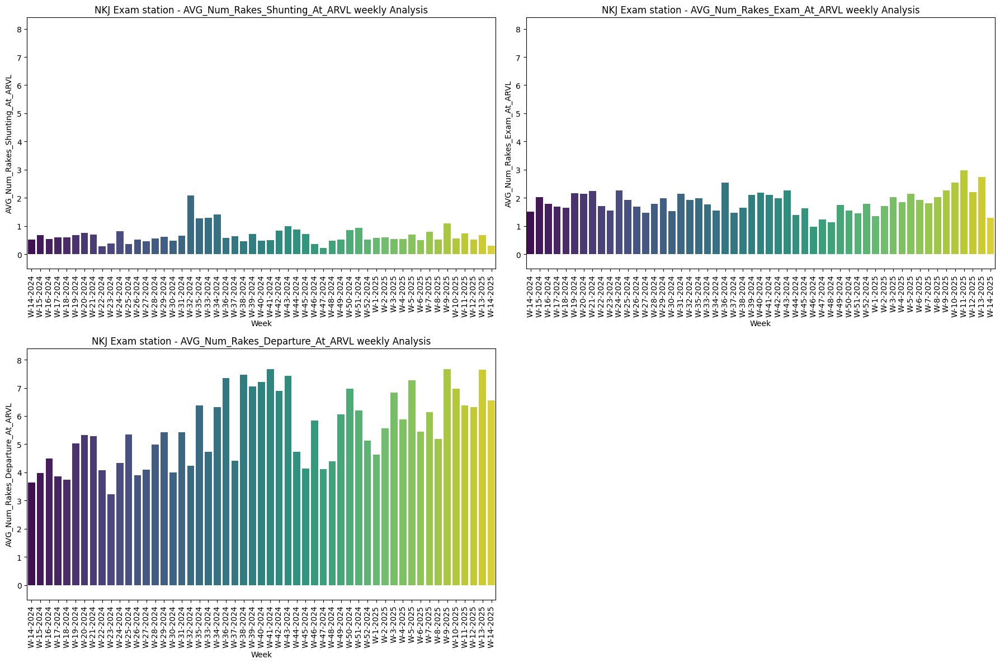

In [51]:
min_y = min(nkj_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            nkj_weekly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(nkj_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            nkj_weekly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Shunting_At_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Num_Rakes_Exam_At_ARVL weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_ARVL weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\591503888.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\591503888.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\591503888.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot

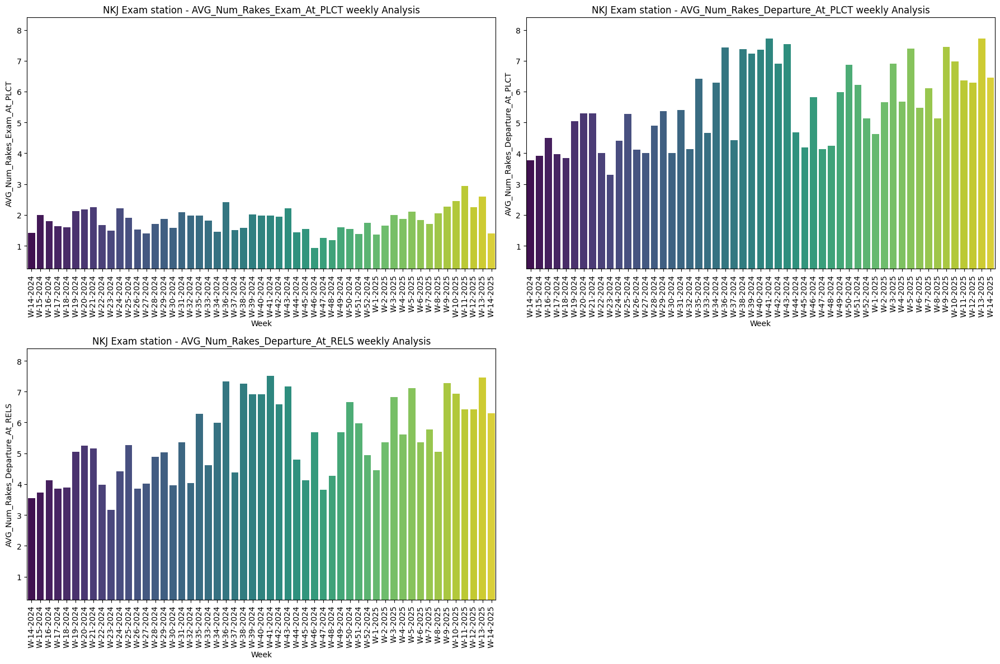

In [52]:
min_y = min(nkj_weekly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(nkj_weekly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            nkj_weekly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Exam_At_PLCT weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Num_Rakes_Departure_At_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2652168655.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2652168655.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_17168\2652168655.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=nkj

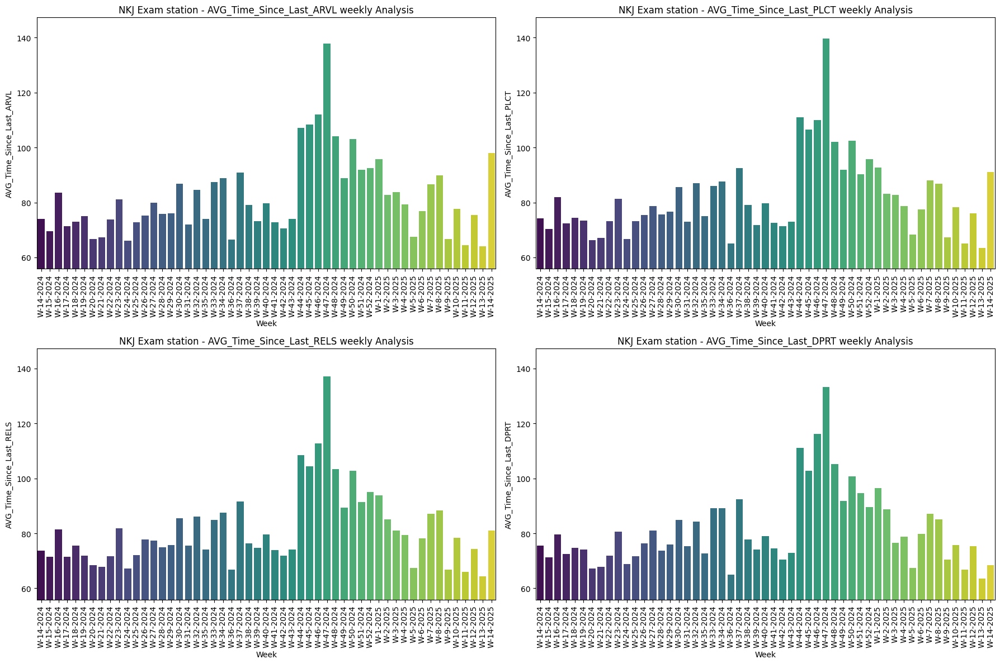

In [53]:
min_y = min(nkj_weekly['AVG_Time_Since_Last_ARVL'].min(),
            nkj_weekly['AVG_Time_Since_Last_PLCT'].min(),
            nkj_weekly['AVG_Time_Since_Last_RELS'].min(),
            nkj_weekly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(nkj_weekly['AVG_Time_Since_Last_ARVL'].max(),
            nkj_weekly['AVG_Time_Since_Last_PLCT'].max(),
            nkj_weekly['AVG_Time_Since_Last_RELS'].max(),
            nkj_weekly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('NKJ Exam station - AVG_Time_Since_Last_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('NKJ Exam station - AVG_Time_Since_Last_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('NKJ Exam station - AVG_Time_Since_Last_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=nkj_weekly['R_WEEK'], y=nkj_weekly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('NKJ Exam station - AVG_Time_Since_Last_DPRT weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].tick_params(axis='x', labelrotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [54]:
weekly_rake_type_count = nkj.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
weekly_rake_type_count = pd.DataFrame(weekly_rake_type_count)

weekly_shunting_time_sum = nkj.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = nkj.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = nkj.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')

weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_shunting_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_SHUNTING_TIME'] = weekly_rake_type_count['Shunting_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_examination_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_EXAMINATION_TIME'] = weekly_rake_type_count['Examination_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_departure_lag_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_DEPARTURE_TIME'] = weekly_rake_type_count['Departure_Lag'] / weekly_rake_type_count['RAKE_COUNT']

weekly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag'], axis=1, inplace=True)

weekly_rake_type_count

,R_WEEK,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
0,W-14-2024,BOXN,86,37.034884,112.674419,280.104651
1,W-14-2024,BOXNHL,42,52.428571,113.880952,294.880952
2,W-15-2024,BOXN,85,38.564706,163.352941,274.411765
3,W-15-2024,BOXNHL,53,50.943396,136.981132,288.641509
4,W-15-2024,BCN,2,265.000000,92.500000,295.000000
...,...,...,...,...,...,...
211,W-13-2025,BCNAHSM1,2,28.500000,175.000000,197.500000
212,W-13-2025,BTAP,1,0.000000,330.000000,7970.000000
213,W-14-2025,BOXN,11,37.727273,181.363636,507.090909
214,W-14-2025,BOXNHL,6,12.500000,119.166667,410.333333


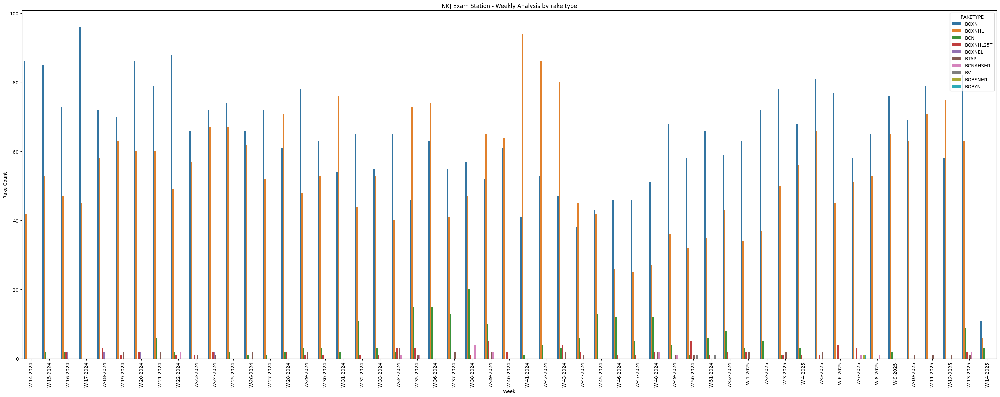

In [55]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('NKJ Exam Station - Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

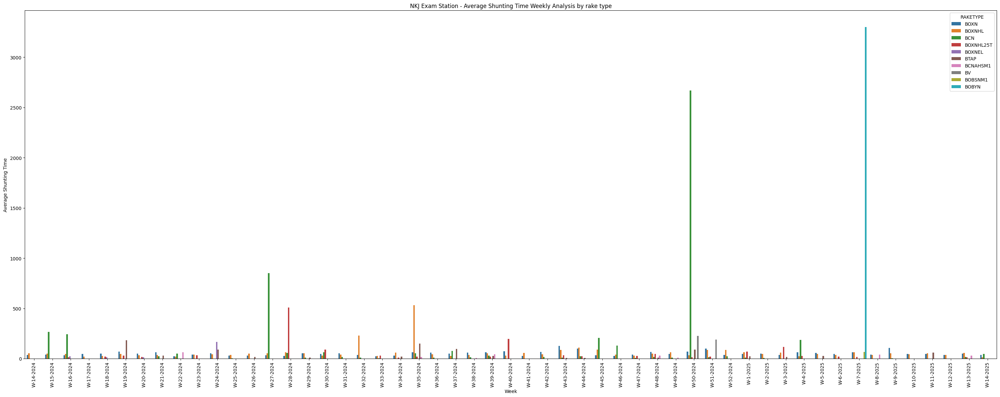

In [56]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_SHUNTING_TIME', hue='RAKETYPE')
plt.title('NKJ Exam Station - Average Shunting Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Shunting Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

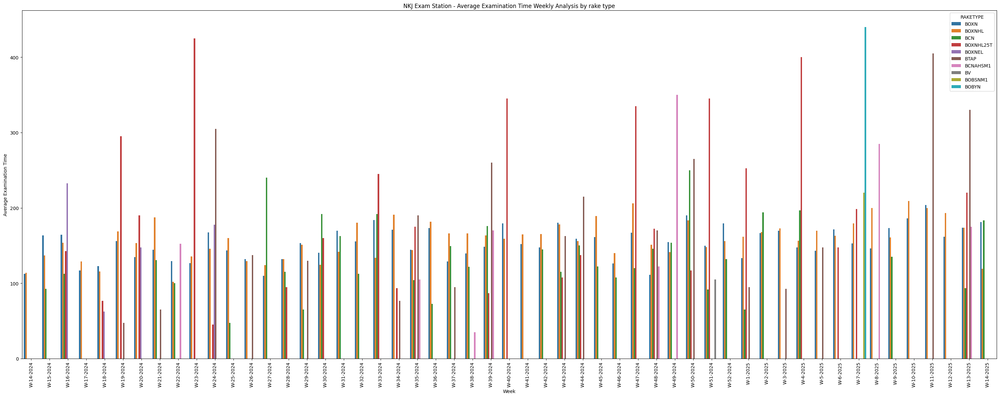

In [57]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_EXAMINATION_TIME', hue='RAKETYPE')
plt.title('NKJ Exam Station - Average Examination Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Examination Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

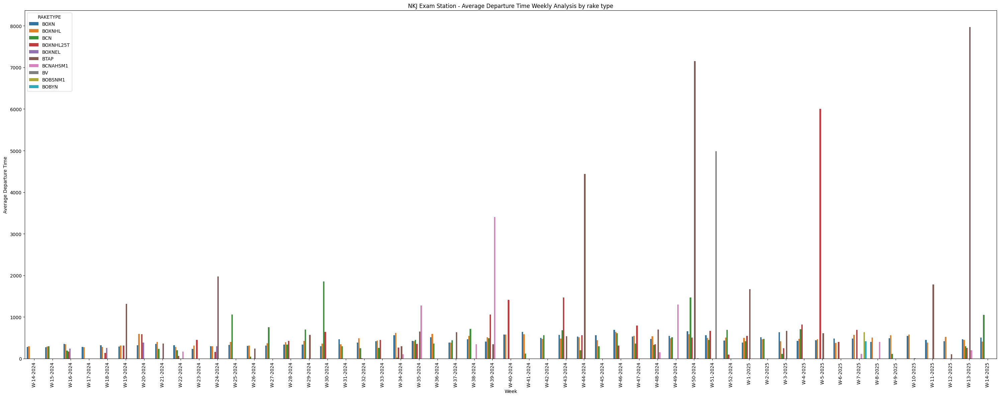

In [58]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_DEPARTURE_TIME', hue='RAKETYPE')
plt.title('NKJ Exam Station - Average Departure Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Departure Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Daily Analysis

In [59]:
nkj_daily = df1.groupby('R_DATEOFMONTH', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_daily = pd.DataFrame(nkj_daily)

daily_shunting_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
daily_examination_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
daily_departure_lag_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
daily_numrakes1 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
daily_numrakes2 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
daily_numrakes3 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
daily_numrakes4 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
daily_numrakes5 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
daily_numrakes6 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
daily_timesince1 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
daily_timesince2 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
daily_timesince3 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
daily_timesince4 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

nkj_daily['AVG_SHUNTING_TIME'] = daily_shunting_time_sum['Shunting_Time'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_EXAMINATION_TIME'] = daily_examination_time_sum['Examination_Time'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_DEPARTURE_TIME'] = daily_departure_lag_time_sum['Departure_Lag'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Shunting_At_ARVL'] = daily_numrakes1['numrakes1'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Exam_At_ARVL'] = daily_numrakes2['numrakes2'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Departure_At_ARVL'] = daily_numrakes3['numrakes3'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Exam_At_PLCT'] = daily_numrakes4['numrakes4'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Departure_At_PLCT'] = daily_numrakes5['numrakes5'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Num_Rakes_Departure_At_RELS'] = daily_numrakes6['numrakes6'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Time_Since_Last_ARVL'] = daily_timesince1['timesince1'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Time_Since_Last_PLCT'] = daily_timesince2['timesince2'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Time_Since_Last_RELS'] = daily_timesince3['timesince3'] / nkj_daily['RAKE_COUNT']
nkj_daily['AVG_Time_Since_Last_DPRT'] = daily_timesince4['timesince4'] / nkj_daily['RAKE_COUNT']

nkj_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,11,42.000000,43.181818,139.909091,0.545455,0.636364,1.090909,0.727273,1.454545,1.454545,76.818182,69.090909,74.545455,73.636364
1,2024-04-02,19,47.105263,74.631579,239.526316,0.631579,1.105263,2.684211,0.947368,2.842105,2.789474,73.473684,76.315789,79.473684,88.157895
2,2024-04-03,21,33.142857,140.714286,290.238095,0.380952,1.619048,4.000000,1.523810,4.142857,3.523810,73.380952,71.190476,70.000000,68.095238
3,2024-04-04,13,40.692308,166.538462,394.461538,0.230769,1.230769,4.461538,1.153846,4.461538,3.923077,82.692308,90.000000,90.384615,108.230769
4,2024-04-05,23,36.695652,94.347826,225.000000,0.521739,1.521739,3.434783,1.391304,3.391304,3.391304,75.913043,86.086957,79.565217,63.391304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-26,19,116.052632,219.473684,624.368421,1.368421,3.157895,7.947368,2.578947,8.263158,8.052632,66.947368,70.263158,71.052632,79.894737
361,2025-03-27,22,17.636364,98.181818,338.636364,0.545455,1.772727,6.409091,1.772727,6.181818,6.090909,82.772727,76.818182,65.681818,64.318182
362,2025-03-28,29,69.517241,133.793103,342.758621,0.655172,3.000000,7.896552,2.862069,7.896552,7.689655,48.620690,51.551724,58.793103,50.172414
363,2025-03-29,21,44.761905,207.142857,524.952381,0.619048,3.238095,8.238095,2.857143,8.523810,8.380952,66.952381,66.904762,55.952381,69.285714


In [60]:
import matplotlib.dates as mdates

In [61]:
nkj_daily['R_DATEOFMONTH'] = pd.to_datetime(nkj_daily['R_DATEOFMONTH'], format='%Y-%m-%d')

nkj_daily = nkj_daily.sort_values(by='R_DATEOFMONTH')

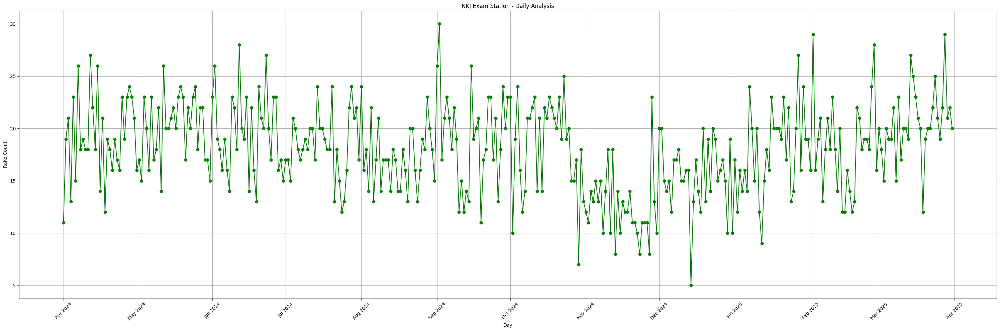

In [62]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['RAKE_COUNT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Rake Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

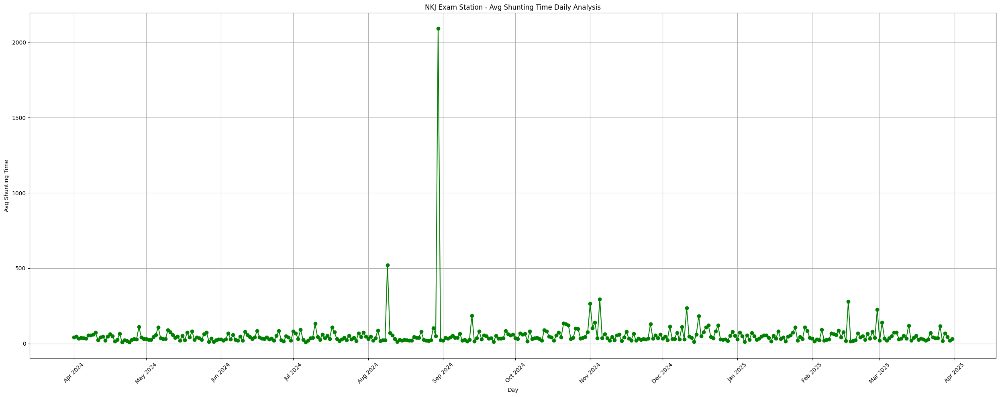

In [63]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - Avg Shunting Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Shunting Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [64]:
nkj_daily[nkj_daily['AVG_SHUNTING_TIME'] > 1000]

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
129,2024-08-30,18,2089.555556,99.722222,387.5,1.555556,1.388889,5.944444,1.388889,5.833333,6.222222,96.555556,82.222222,87.777778,81.055556


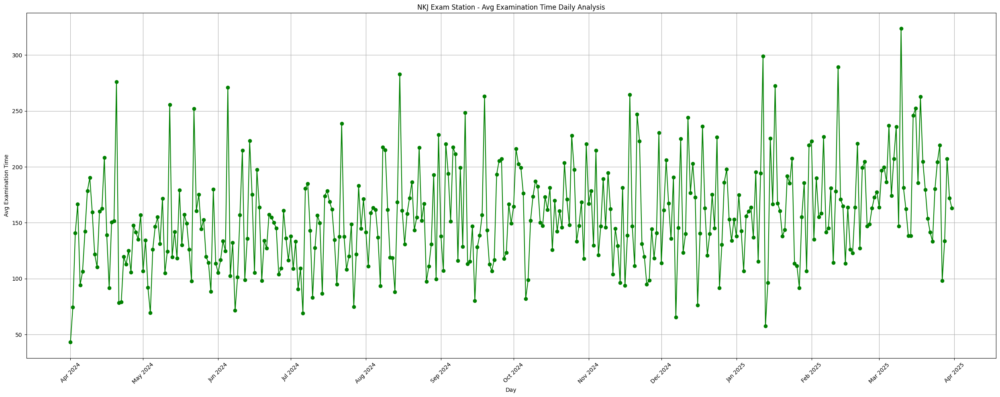

In [65]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - Avg Examination Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Examination Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

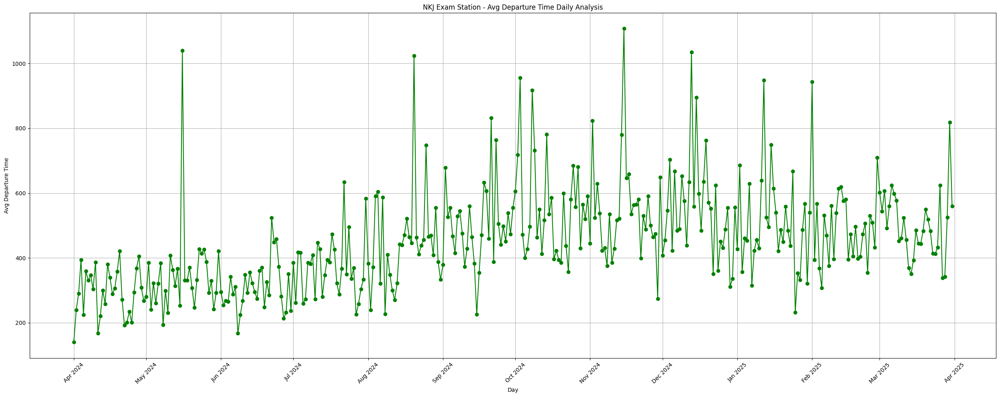

In [66]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - Avg Departure Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Departure Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

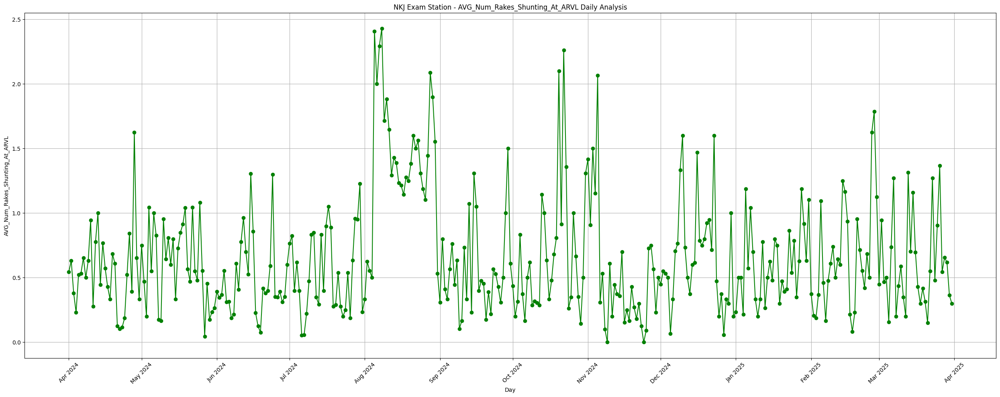

In [67]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

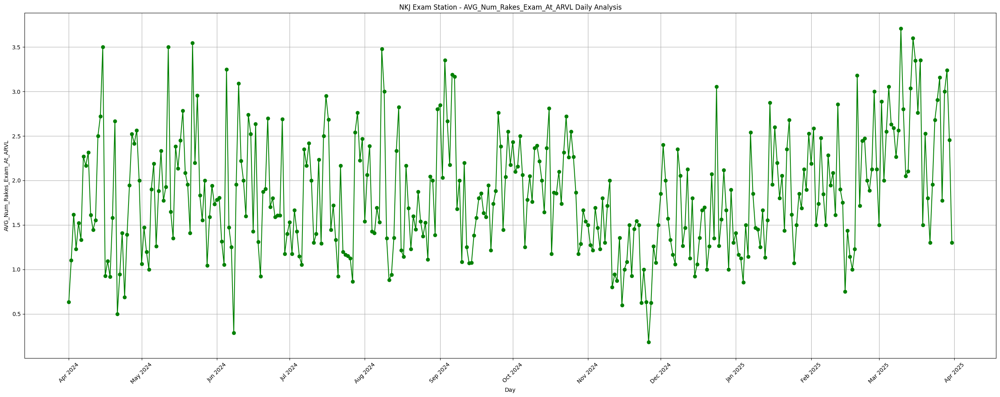

In [68]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

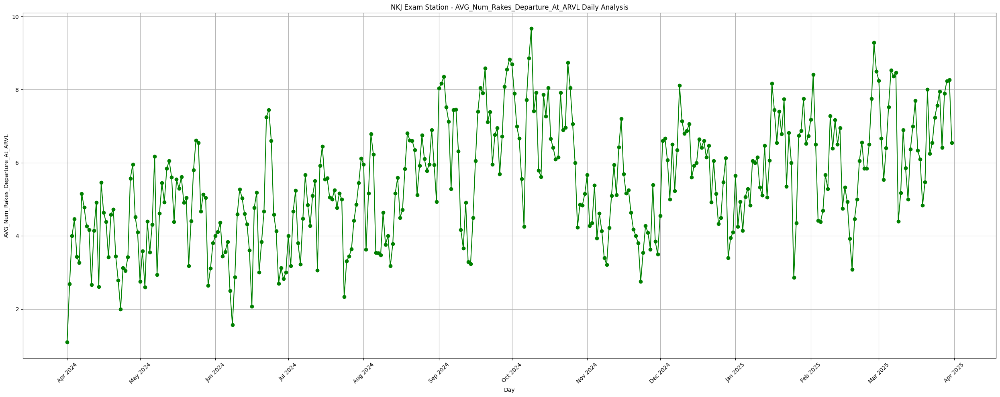

In [69]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

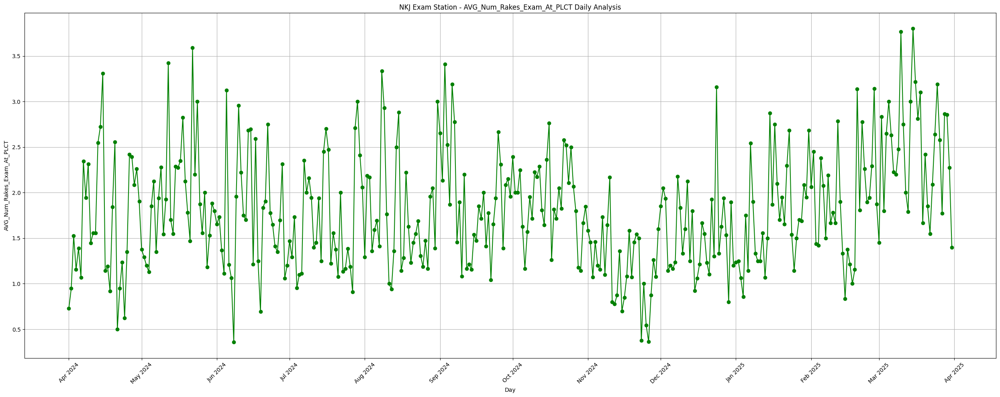

In [70]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

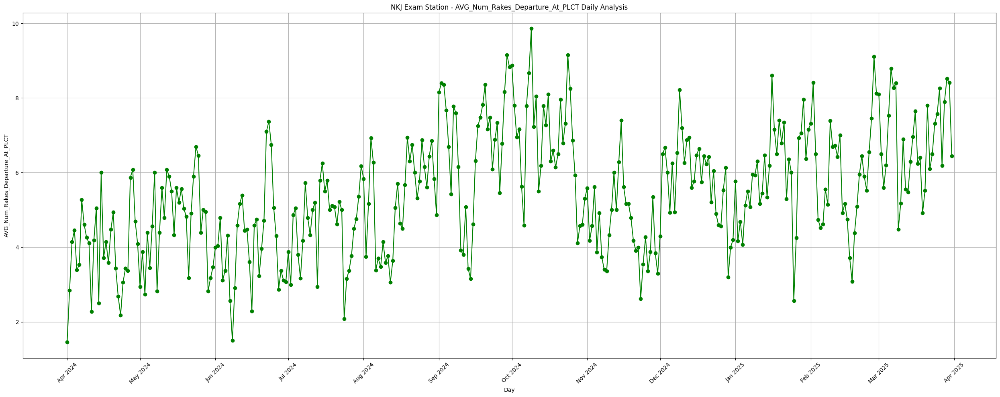

In [71]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

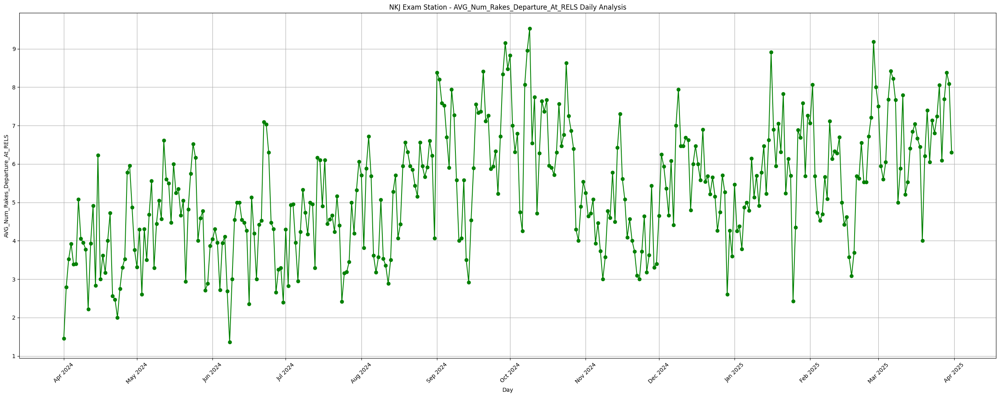

In [72]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

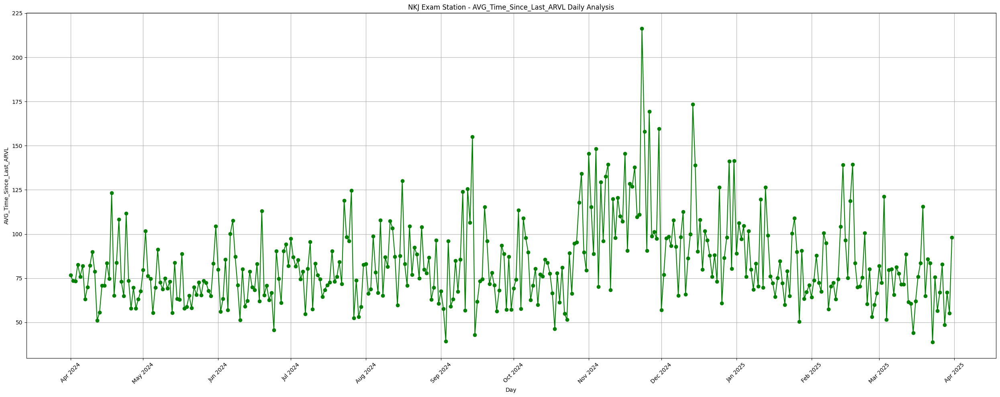

In [73]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Time_Since_Last_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

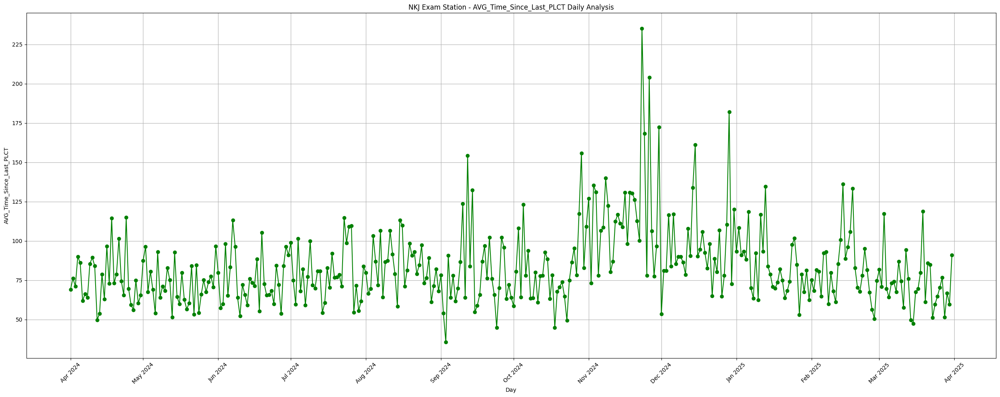

In [74]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Time_Since_Last_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

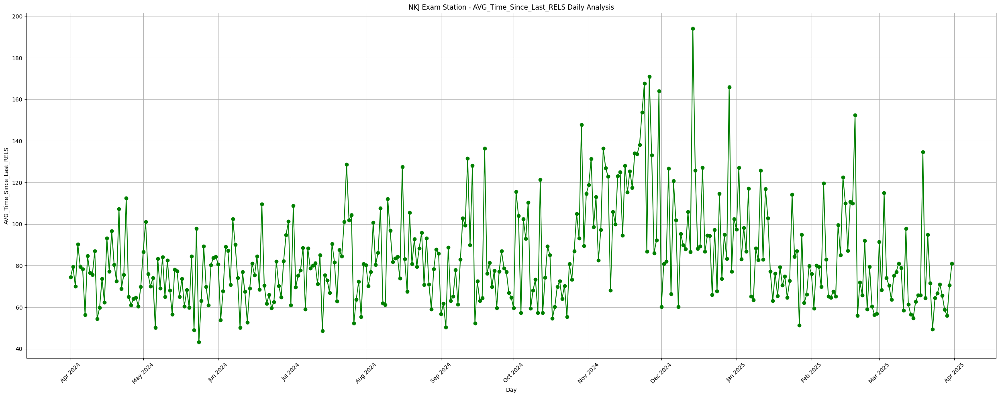

In [75]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Time_Since_Last_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

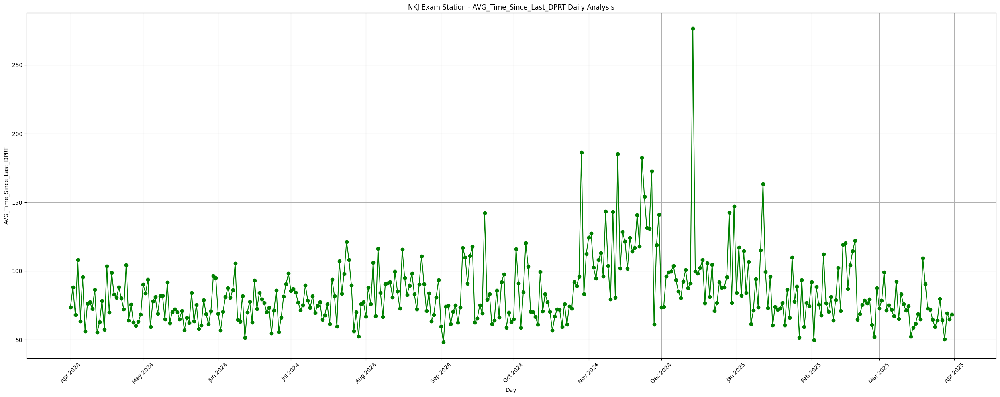

In [76]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(nkj_daily['R_DATEOFMONTH'], nkj_daily['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('NKJ Exam Station - AVG_Time_Since_Last_DPRT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Weekend Analysis

In [77]:
nkj_weekend = df1.groupby('R_DAYOFWEEK', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_weekend = pd.DataFrame(nkj_weekend)

weekend_shunting_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekend_examination_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekend_departure_lag_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekend_numrakes1 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekend_numrakes2 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekend_numrakes3 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekend_numrakes4 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekend_numrakes5 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekend_numrakes6 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekend_timesince1 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekend_timesince2 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekend_timesince3 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekend_timesince4 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

nkj_weekend['AVG_SHUNTING_TIME'] = weekend_shunting_time_sum['Shunting_Time'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_EXAMINATION_TIME'] = weekend_examination_time_sum['Examination_Time'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_DEPARTURE_TIME'] = weekend_departure_lag_time_sum['Departure_Lag'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Shunting_At_ARVL'] = weekend_numrakes1['numrakes1'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Exam_At_ARVL'] = weekend_numrakes2['numrakes2'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Departure_At_ARVL'] = weekend_numrakes3['numrakes3'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Exam_At_PLCT'] = weekend_numrakes4['numrakes4'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Departure_At_PLCT'] = weekend_numrakes5['numrakes5'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Num_Rakes_Departure_At_RELS'] = weekend_numrakes6['numrakes6'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Time_Since_Last_ARVL'] = weekend_timesince1['timesince1'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Time_Since_Last_PLCT'] = weekend_timesince2['timesince2'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Time_Since_Last_RELS'] = weekend_timesince3['timesince3'] / nkj_weekend['RAKE_COUNT']
nkj_weekend['AVG_Time_Since_Last_DPRT'] = weekend_timesince4['timesince4'] / nkj_weekend['RAKE_COUNT']

nkj_weekend

,R_DAYOFWEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,0,996,52.240964,151.316265,450.502008,0.679719,1.920683,5.784137,1.854418,5.823293,5.639558,79.015060,76.947791,77.361446,75.351406
1,1,910,50.251648,154.754945,439.531868,0.693407,1.813187,5.587912,1.813187,5.531868,5.353846,80.869231,81.204396,79.552747,82.790110
2,2,913,55.582694,158.578313,447.221249,0.687842,2.009858,5.476451,1.937568,5.529025,5.335159,78.543264,78.155531,83.861993,81.021906
3,3,958,45.021921,160.879958,462.000000,0.663883,1.892484,5.577244,1.855950,5.554280,5.483299,81.719207,82.433194,80.854906,78.986430
4,4,932,97.813305,156.111588,428.548283,0.636266,1.913090,5.591202,1.869099,5.600858,5.442060,80.580472,78.422747,78.488197,80.061159
5,5,896,46.063616,152.312500,442.025670,0.640625,1.871652,5.389509,1.848214,5.367188,5.193080,82.824777,82.228795,83.581473,82.818080
6,6,989,49.837209,146.645096,425.588473,0.734075,1.949444,5.556117,1.887765,5.602629,5.564206,74.379171,78.372093,74.337715,77.107179


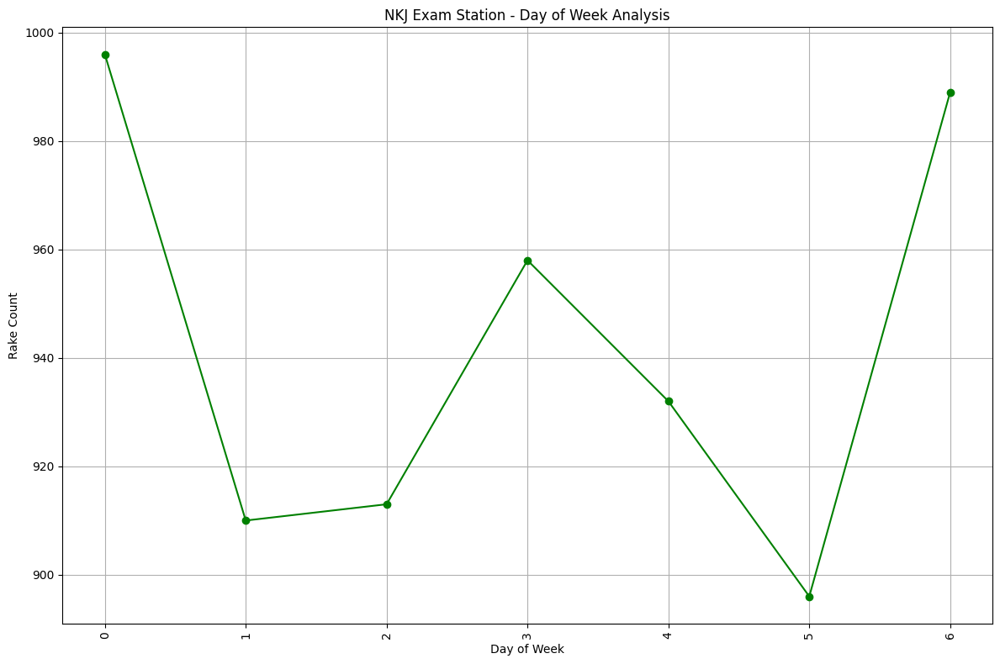

In [78]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

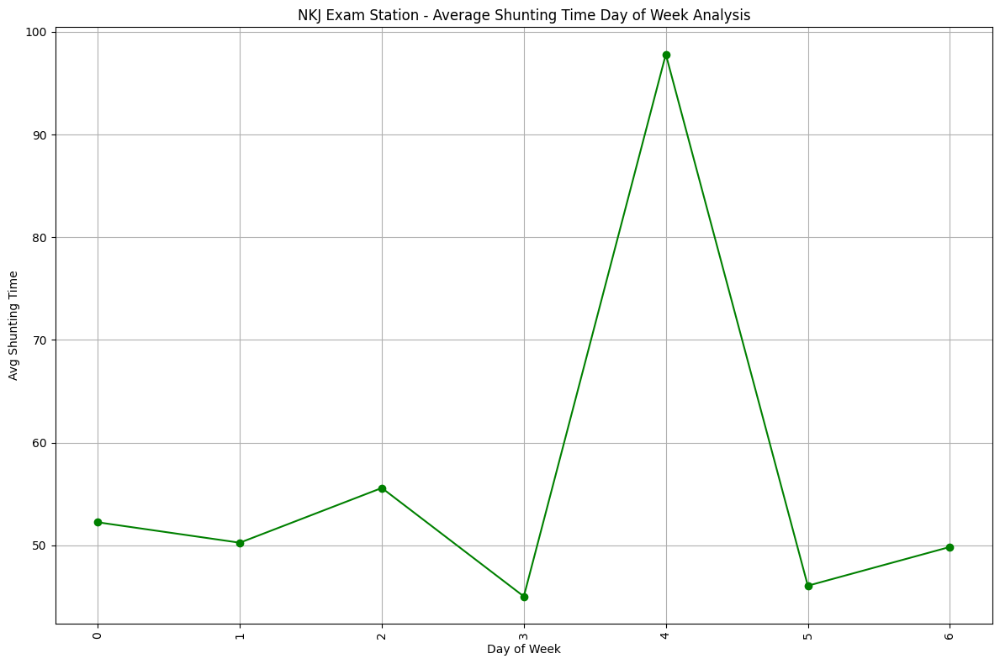

In [79]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Average Shunting Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Shunting Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

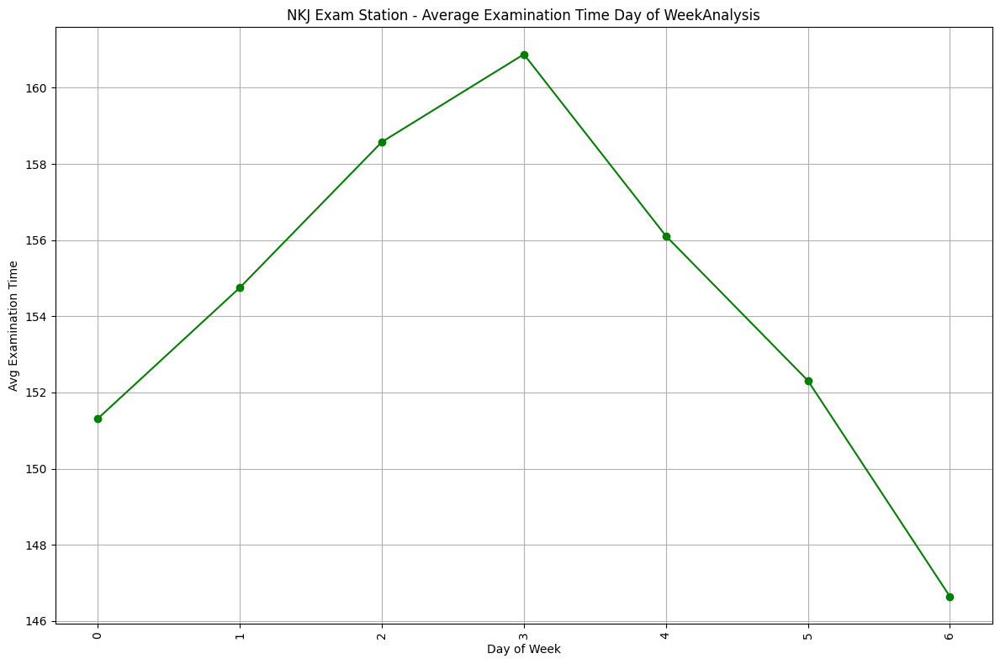

In [80]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Average Examination Time Day of WeekAnalysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Examination Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

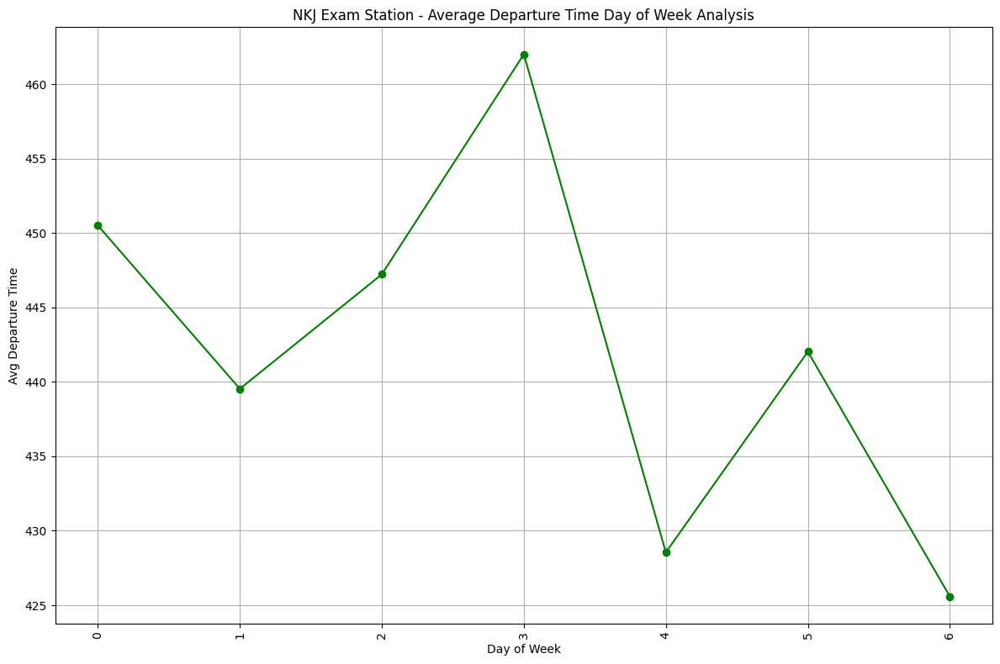

In [81]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Average Departure Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Departure Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

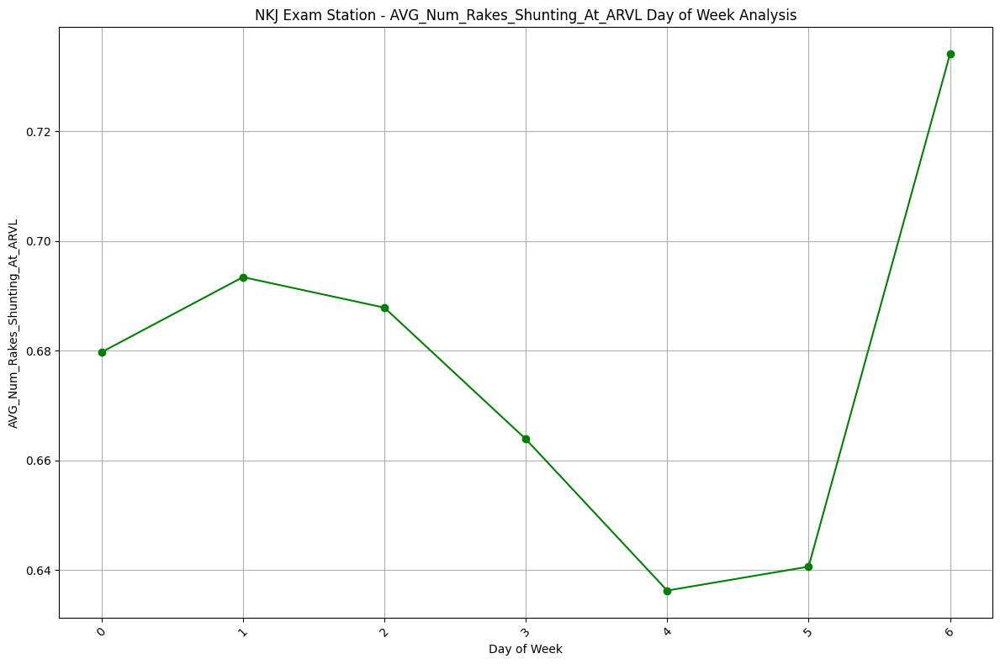

In [82]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

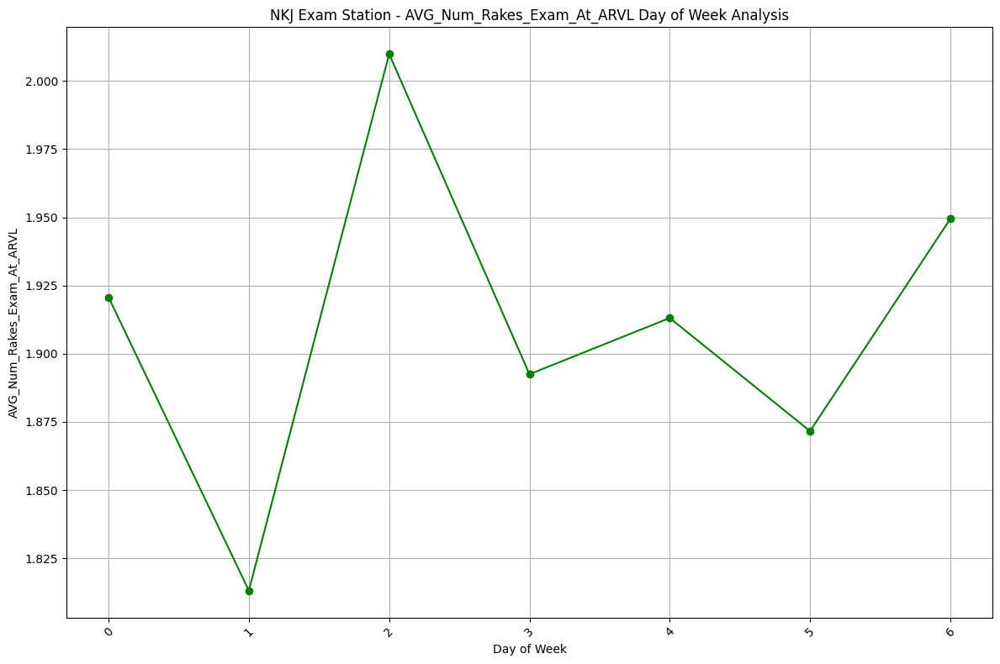

In [83]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

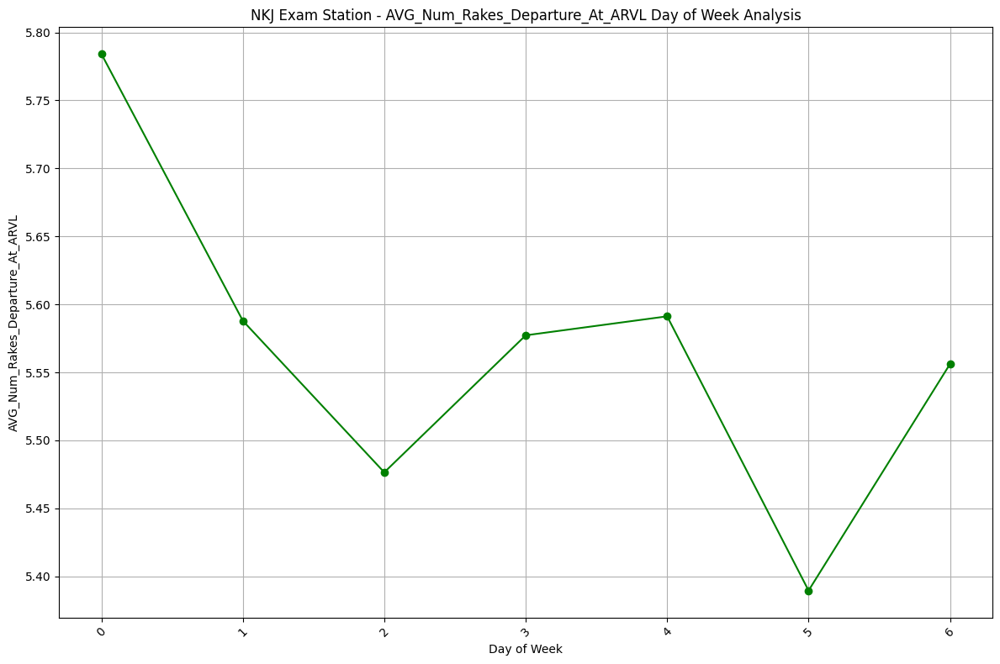

In [84]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

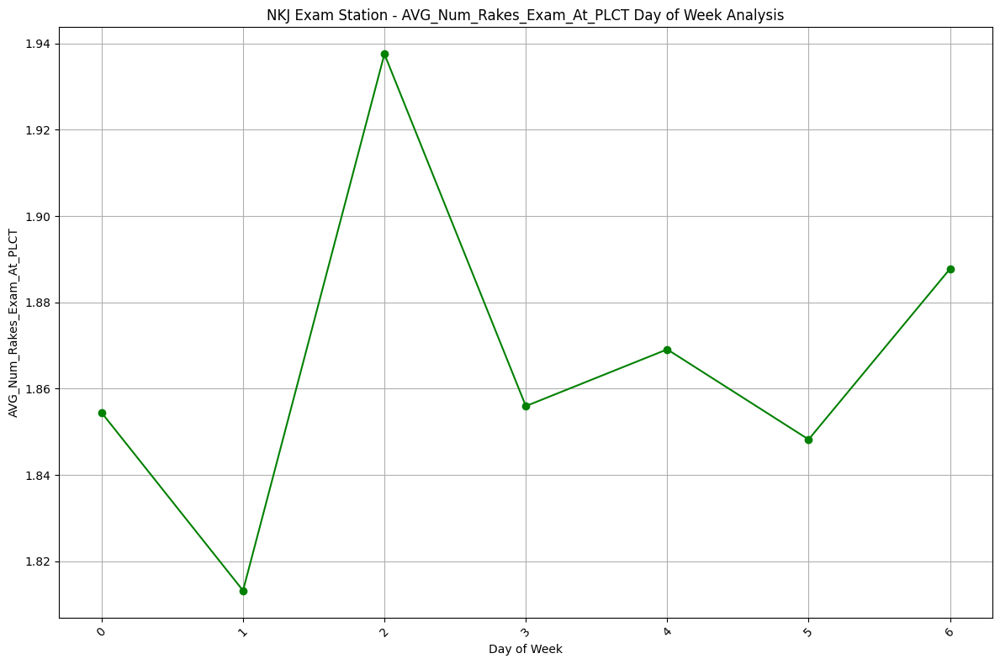

In [85]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Exam_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

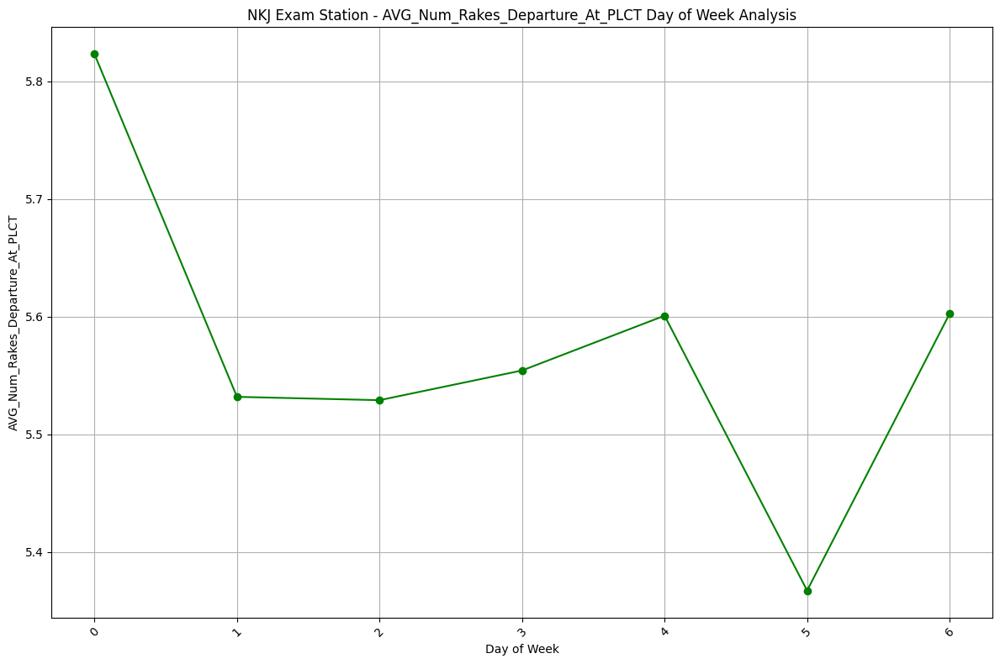

In [86]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

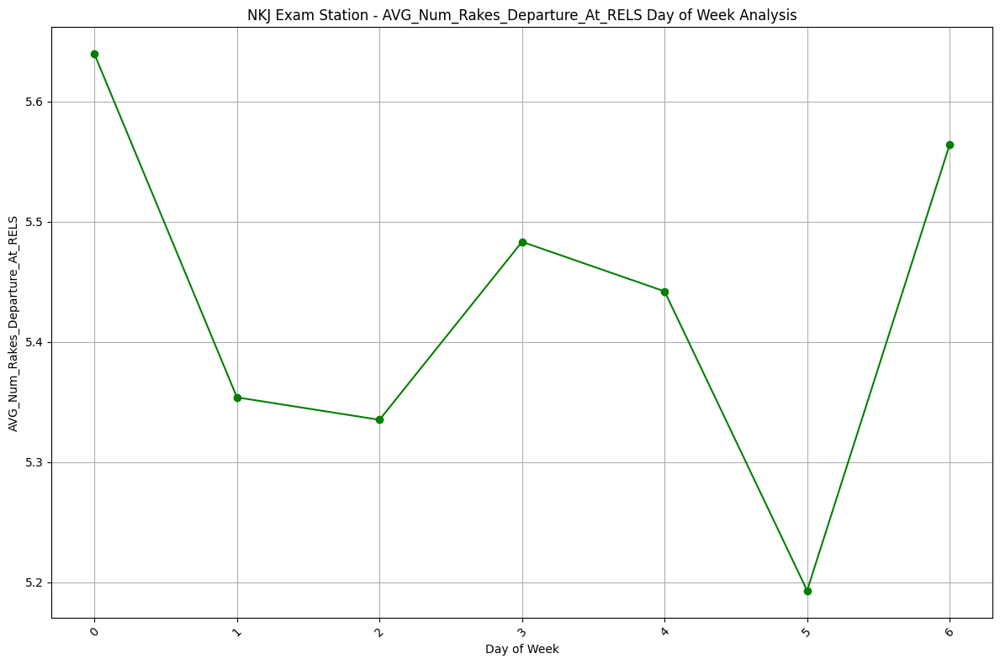

In [87]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Num_Rakes_Departure_At_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

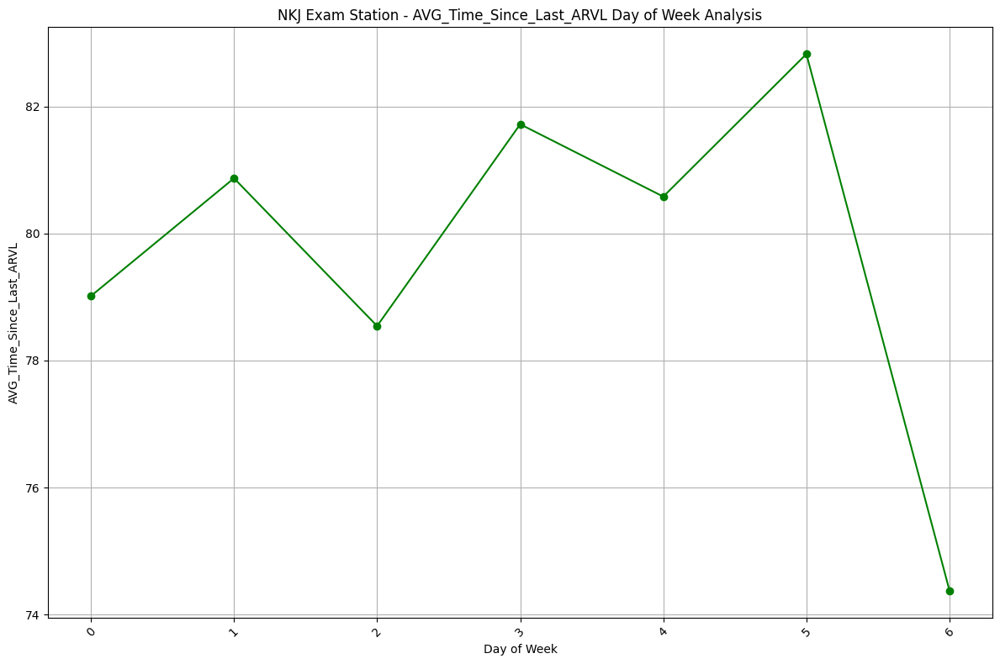

In [88]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Time_Since_Last_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

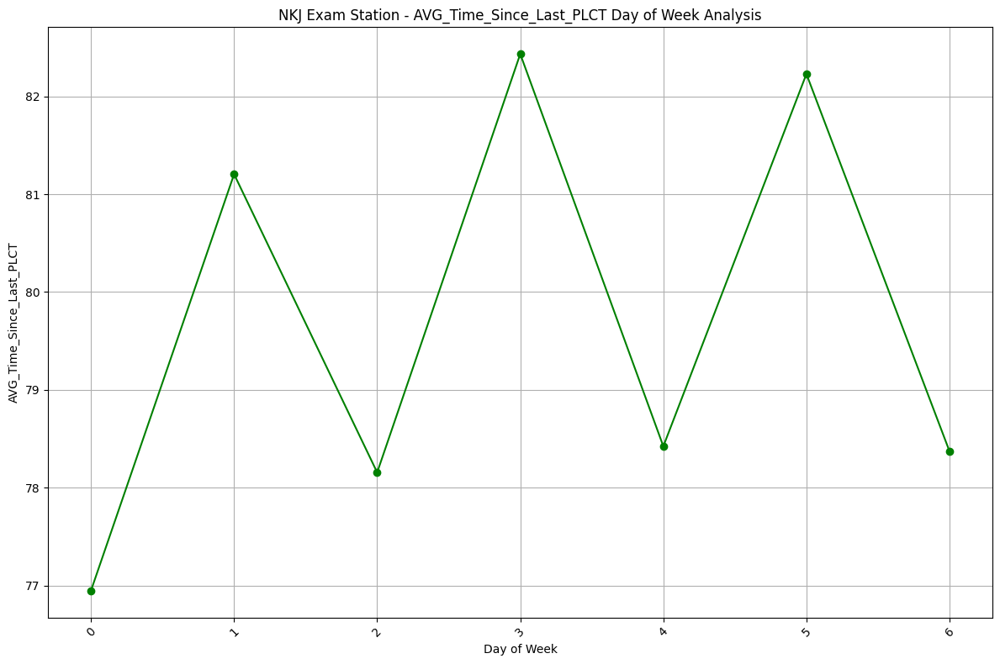

In [89]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Time_Since_Last_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

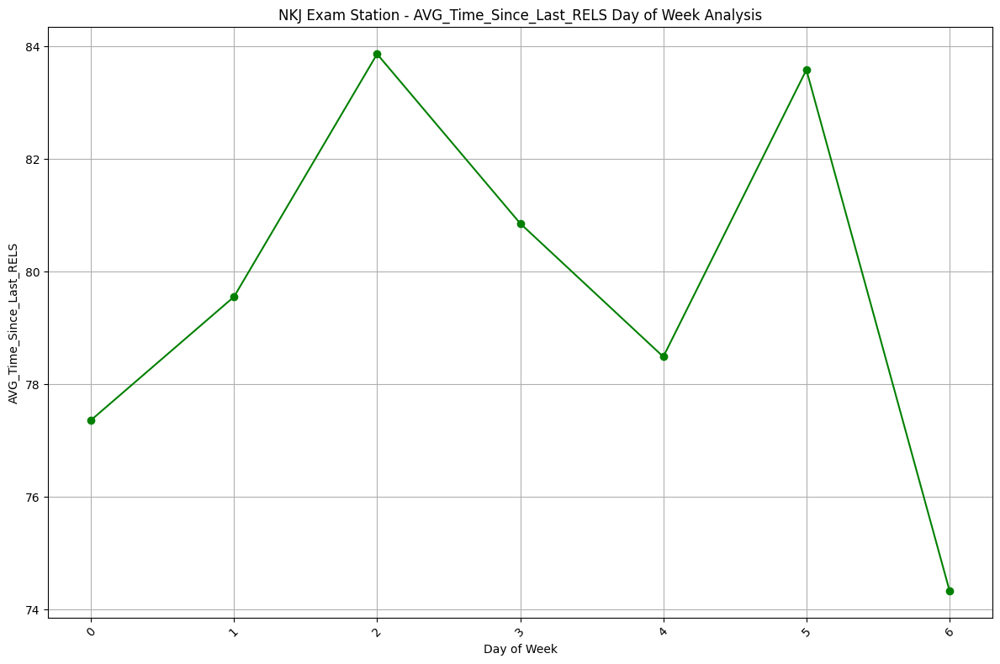

In [90]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Time_Since_Last_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

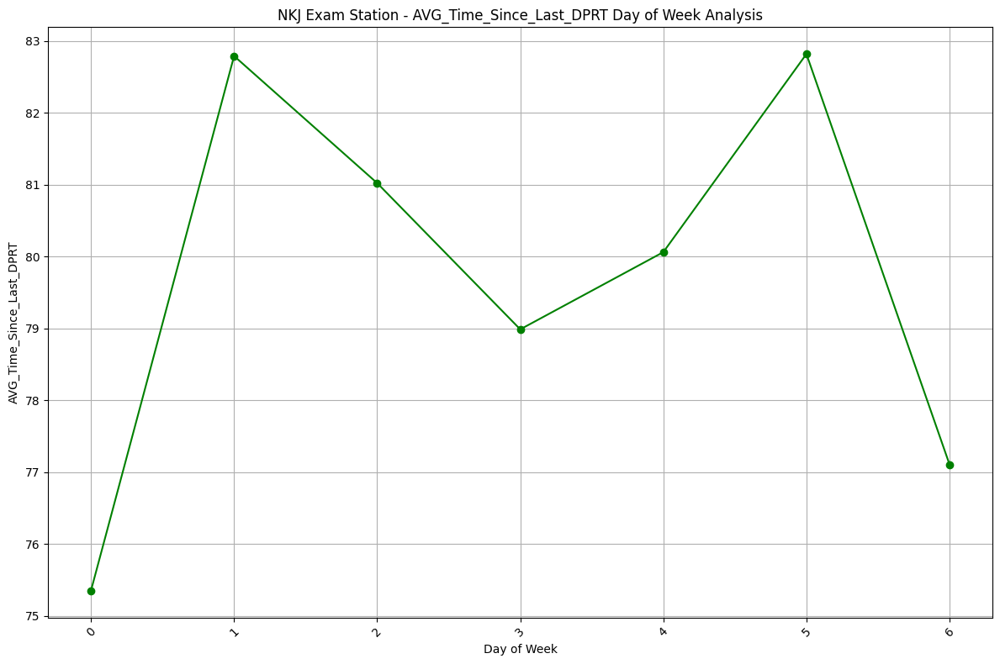

In [91]:
plt.figure(figsize=(12,8))
plt.plot(nkj_weekend['R_DAYOFWEEK'], nkj_weekend['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - AVG_Time_Since_Last_DPRT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Hourly Analysis

In [92]:
nkj_arvl_h = nkj.groupby('ARVL_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_arvl_h = pd.DataFrame(nkj_arvl_h)
nkj_plct_h = nkj.groupby('PLCT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_plct_h = pd.DataFrame(nkj_plct_h)
nkj_rels_h = nkj.groupby('RELS_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_rels_h = pd.DataFrame(nkj_rels_h)
nkj_dprt_h = nkj.groupby('DPRT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
nkj_dprt_h = pd.DataFrame(nkj_dprt_h)

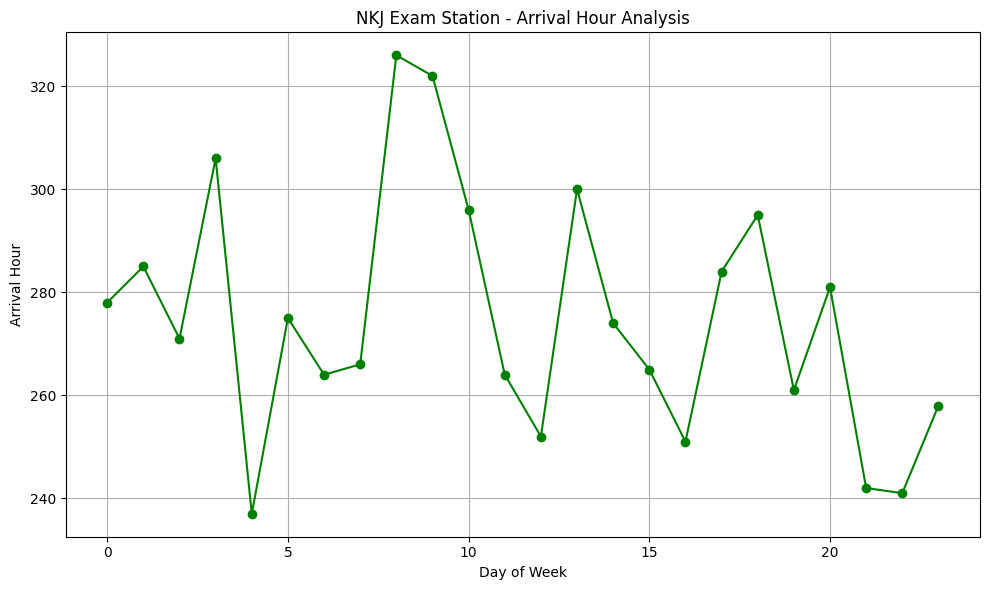

In [93]:
plt.figure(figsize=(10,6))
plt.plot(nkj_arvl_h['ARVL_H'], nkj_arvl_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Arrival Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Arrival Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

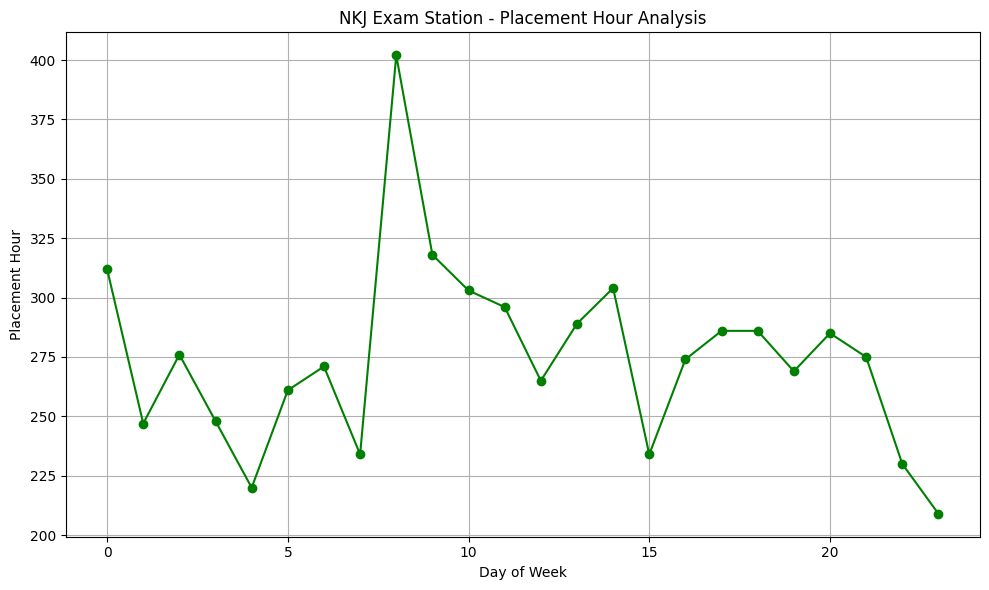

In [94]:
plt.figure(figsize=(10,6))
plt.plot(nkj_plct_h['PLCT_H'], nkj_plct_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Placement Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Placement Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

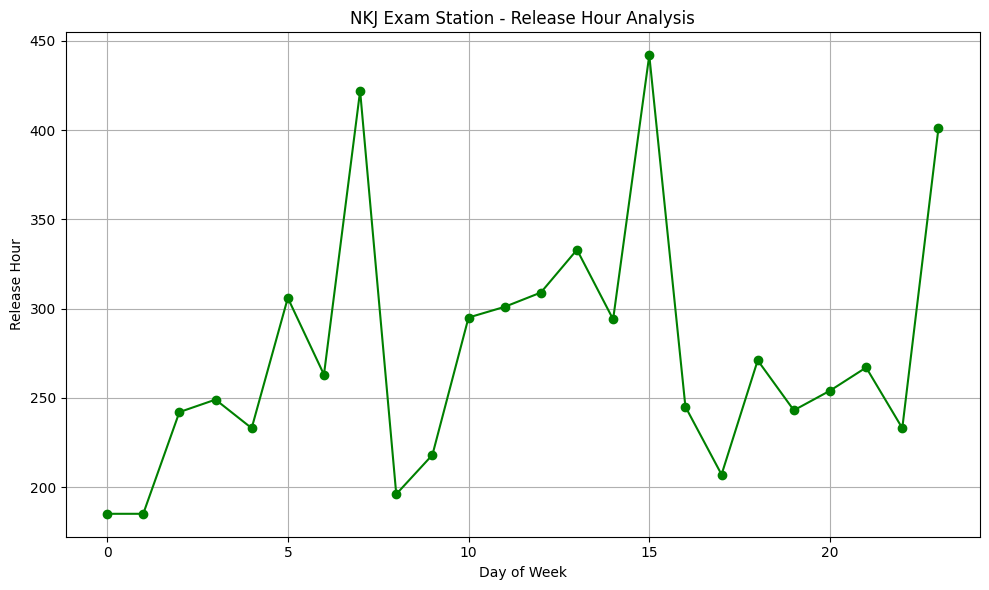

In [95]:
plt.figure(figsize=(10,6))
plt.plot(nkj_rels_h['RELS_H'], nkj_rels_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Release Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Release Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

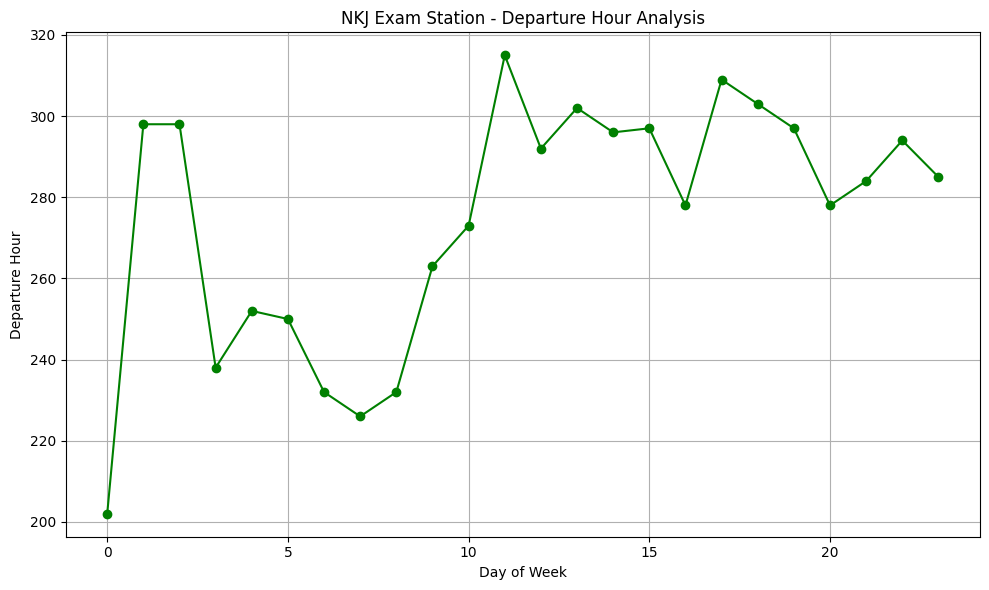

In [96]:
plt.figure(figsize=(10,6))
plt.plot(nkj_dprt_h['DPRT_H'], nkj_dprt_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('NKJ Exam Station - Departure Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Departure Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

In [97]:
corr_df = df1.copy()

In [98]:
corr_df['R_DATEOFMONTH'] = corr_df['R_DATEOFMONTH'].str.split('-').str[2].astype('int64')
corr_df['R_MONTH'] = corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
corr_df['R_WEEK'] = corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE'], axis=1, inplace=True)

In [99]:
corr = corr_df.corr()

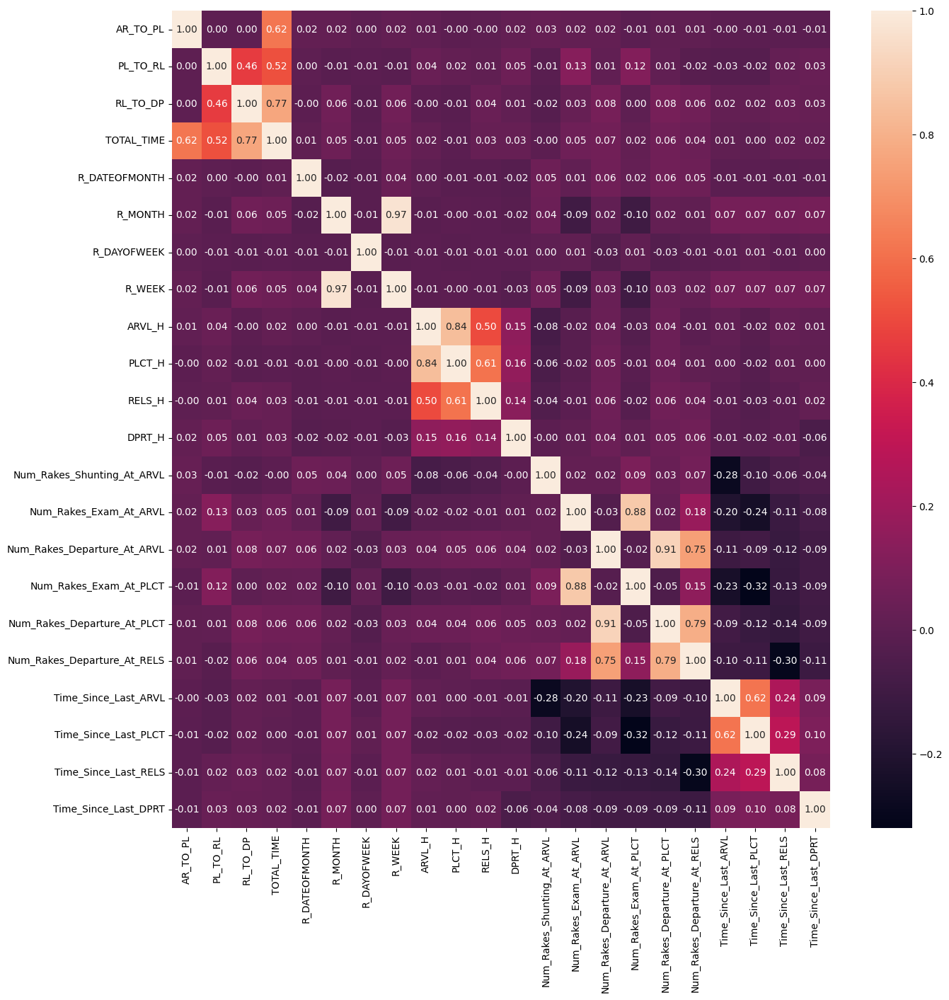

In [100]:
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

#### 10 new feature analysis

In [101]:
df1[['Num_Rakes_Shunting_At_ARVL','Num_Rakes_Exam_At_ARVL','Num_Rakes_Departure_At_ARVL','Num_Rakes_Exam_At_PLCT','Num_Rakes_Departure_At_PLCT','Num_Rakes_Departure_At_RELS','Time_Since_Last_ARVL','Time_Since_Last_PLCT','Time_Since_Last_RELS','Time_Since_Last_DPRT']].describe()

,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
count,6594.000000,6594.000000,6594.000000,6594.000000,6594.000000,6594.000000,6594.000000,6594.000000,6594.000000,6594.00000
mean,0.677131,1.910676,5.569305,1.866697,5.576736,5.435396,79.642099,79.639066,79.622384,79.63482
std,0.822445,1.383002,2.234162,1.368306,2.241984,2.202923,78.538817,78.085012,77.352004,79.04703
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,0.000000,1.000000,4.000000,1.000000,4.000000,4.000000,25.000000,25.000000,20.000000,23.00000
50%,0.000000,2.000000,6.000000,2.000000,5.000000,5.000000,57.500000,60.000000,60.000000,57.00000
75%,1.000000,3.000000,7.000000,3.000000,7.000000,7.000000,110.000000,110.000000,115.000000,111.00000
max,5.000000,9.000000,14.000000,9.000000,14.000000,14.000000,690.000000,885.000000,865.000000,638.00000


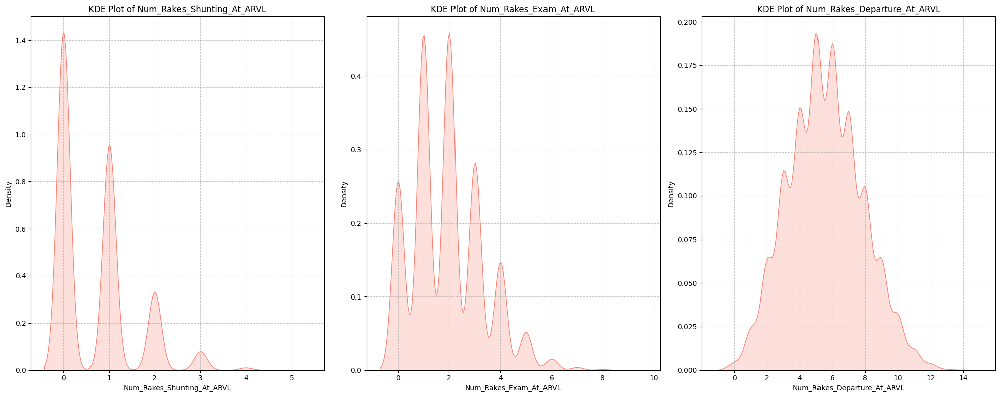

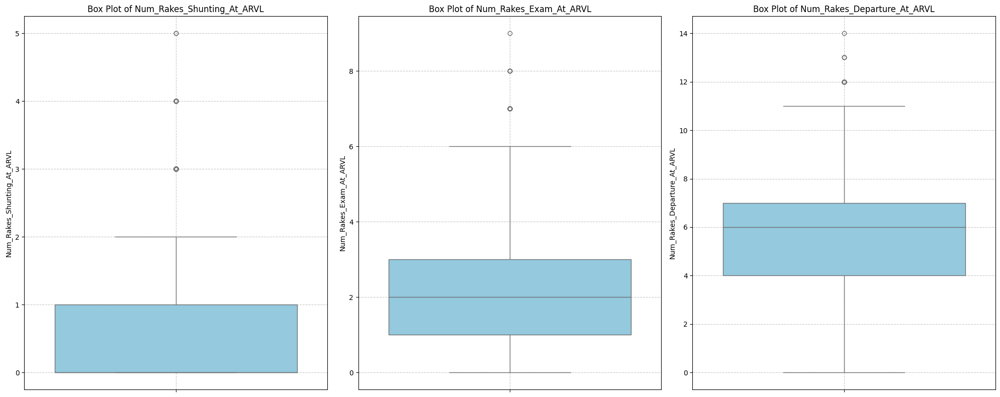

In [102]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Shunting_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Shunting_At_ARVL')
plt.xlabel('Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Exam_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_ARVL')
plt.xlabel('Num_Rakes_Exam_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_ARVL')
plt.xlabel('Num_Rakes_Departure_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Shunting_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Num_Rakes_Shunting_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Exam_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_ARVL')
plt.ylabel('Num_Rakes_Exam_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_ARVL')
plt.ylabel('Num_Rakes_Departure_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

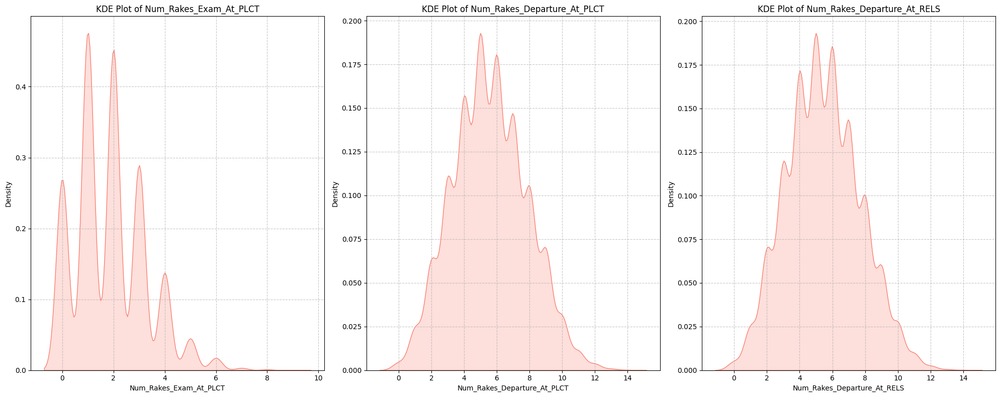

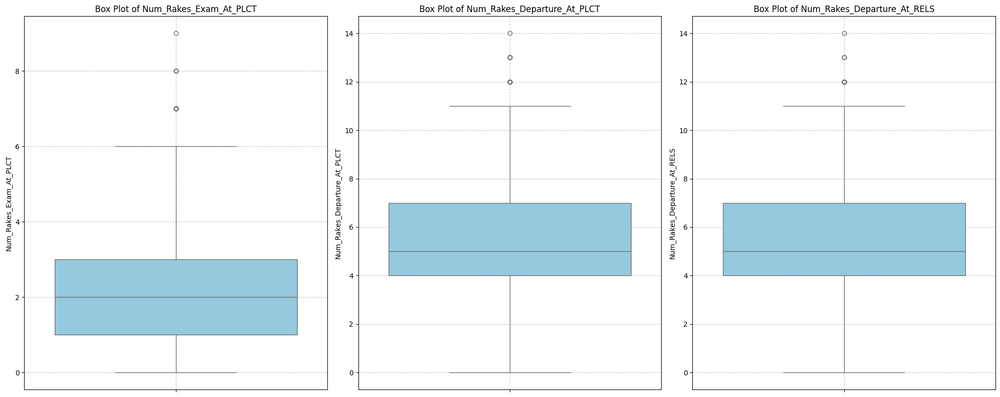

In [103]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Exam_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_PLCT')
plt.xlabel('Num_Rakes_Exam_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Departure_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_PLCT')
plt.xlabel('Num_Rakes_Departure_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_RELS')
plt.xlabel('Num_Rakes_Departure_At_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Exam_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_PLCT')
plt.ylabel('Num_Rakes_Exam_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Departure_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_PLCT')
plt.ylabel('Num_Rakes_Departure_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_RELS'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_RELS')
plt.ylabel('Num_Rakes_Departure_At_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

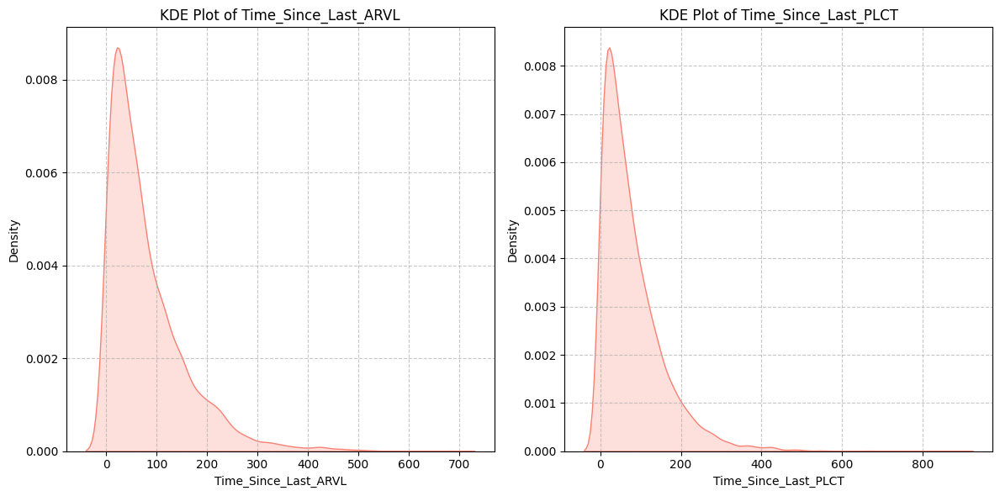

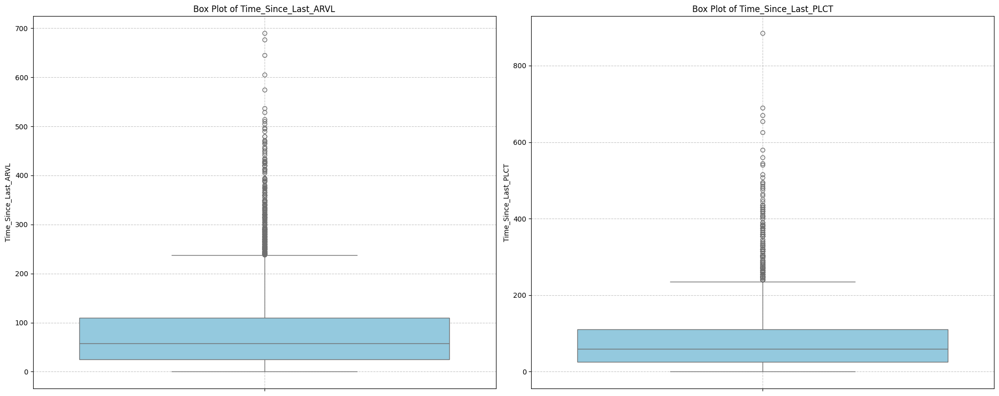

In [104]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_ARVL')
plt.xlabel('Time_Since_Last_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_PLCT')
plt.xlabel('Time_Since_Last_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_ARVL'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_ARVL')
plt.ylabel('Time_Since_Last_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_PLCT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_PLCT')
plt.ylabel('Time_Since_Last_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

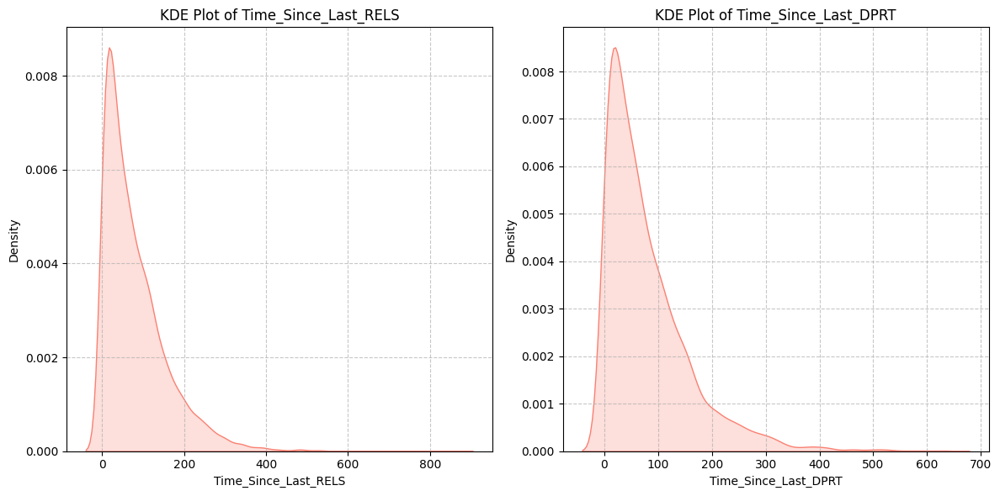

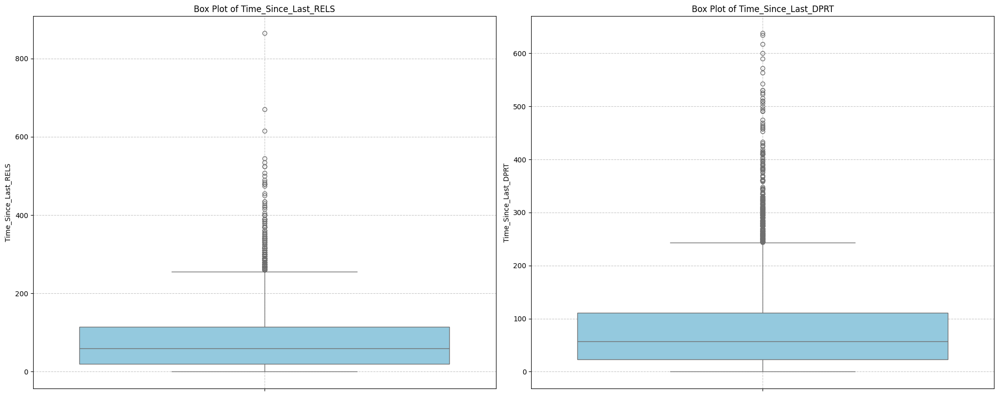

In [105]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_RELS')
plt.xlabel('Time_Since_Last_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_DPRT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_DPRT')
plt.xlabel('Time_Since_Last_DPRT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_RELS'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_RELS')
plt.ylabel('Time_Since_Last_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_DPRT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_DPRT')
plt.ylabel('Time_Since_Last_DPRT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Handling Outliers on the basis of EDA

#### outliers removal

In [106]:
nkj_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,11,42.000000,43.181818,139.909091,0.545455,0.636364,1.090909,0.727273,1.454545,1.454545,76.818182,69.090909,74.545455,73.636364
1,2024-04-02,19,47.105263,74.631579,239.526316,0.631579,1.105263,2.684211,0.947368,2.842105,2.789474,73.473684,76.315789,79.473684,88.157895
2,2024-04-03,21,33.142857,140.714286,290.238095,0.380952,1.619048,4.000000,1.523810,4.142857,3.523810,73.380952,71.190476,70.000000,68.095238
3,2024-04-04,13,40.692308,166.538462,394.461538,0.230769,1.230769,4.461538,1.153846,4.461538,3.923077,82.692308,90.000000,90.384615,108.230769
4,2024-04-05,23,36.695652,94.347826,225.000000,0.521739,1.521739,3.434783,1.391304,3.391304,3.391304,75.913043,86.086957,79.565217,63.391304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,2025-03-27,22,17.636364,98.181818,338.636364,0.545455,1.772727,6.409091,1.772727,6.181818,6.090909,82.772727,76.818182,65.681818,64.318182
362,2025-03-28,29,69.517241,133.793103,342.758621,0.655172,3.000000,7.896552,2.862069,7.896552,7.689655,48.620690,51.551724,58.793103,50.172414
363,2025-03-29,21,44.761905,207.142857,524.952381,0.619048,3.238095,8.238095,2.857143,8.523810,8.380952,66.952381,66.904762,55.952381,69.285714
359,2025-03-30,22,20.045455,172.045455,818.863636,0.363636,2.454545,8.272727,2.272727,8.409091,8.090909,55.136364,59.772727,70.681818,65.000000


In [107]:
nkj_daily.describe()

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2024-09-30 00:00:00,18.065753,57.224737,155.263959,451.540443,0.658467,1.834964,5.441203,1.793643,5.441056,5.290370,83.483826,83.451006,83.836603,84.752106
min,2024-04-01 00:00:00,5.000000,9.222222,43.181818,139.909091,0.000000,0.181818,1.090909,0.357143,1.454545,1.357143,38.727273,35.588235,43.130435,48.133333
25%,2024-07-01 00:00:00,15.000000,27.764706,123.333333,346.958333,0.333333,1.333333,4.277778,1.285714,4.272727,4.166667,67.105263,67.500000,66.105263,69.285714
50%,2024-09-30 00:00:00,18.000000,39.631579,149.705882,430.352941,0.538462,1.750000,5.333333,1.714286,5.363636,5.222222,78.086957,78.666667,79.500000,78.944444
75%,2024-12-30 00:00:00,21.000000,61.083333,180.400000,539.500000,0.857143,2.266667,6.600000,2.200000,6.500000,6.333333,96.000000,93.235294,94.500000,94.615385
max,2025-03-31 00:00:00,30.000000,2089.555556,323.529412,1107.500000,2.428571,3.705882,9.666667,3.800000,9.857143,9.523810,216.250000,235.000000,194.000000,276.400000
std,NaN,4.294906,115.784025,45.497272,156.873376,0.454946,0.660254,1.596832,0.646286,1.608540,1.580424,24.137413,24.550041,23.667455,24.739409


In [108]:
df1['R_DATEOFMONTH'] = pd.to_datetime(df1['R_DATEOFMONTH'], format='%Y-%m-%d')

In [109]:
merged_nkj_df = pd.merge(df1, nkj_daily[['R_DATEOFMONTH', 'AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME']], on='R_DATEOFMONTH', how='left')

In [110]:
shuntingavg_q1, shuntingavg_q3 = np.quantile(nkj_daily['AVG_SHUNTING_TIME'], q=(0.25,0.75))

shuntingavg_lf = shuntingavg_q1 - 1.5*(shuntingavg_q3-shuntingavg_q1)
shuntingavg_hf = shuntingavg_q3 + 1.5*(shuntingavg_q3-shuntingavg_q1)

print(shuntingavg_lf, shuntingavg_hf)

shunting_q1, shunting_q3 = np.quantile(merged_nkj_df['AR_TO_PL'], q=(0.25,0.75))

shunting_lf = shunting_q1 - 1.5*(shunting_q3-shunting_q1)
shunting_hf = shunting_q3 + 1.5*(shunting_q3-shunting_q1)

print(shunting_lf, shunting_hf)

-22.213235294117652 111.06127450980392
-67.5 112.5


In [111]:
shunting_outliers = merged_nkj_df[(merged_nkj_df['AVG_SHUNTING_TIME'] < shuntingavg_lf) & (merged_nkj_df['AR_TO_PL'] < shunting_lf) | (merged_nkj_df['AVG_SHUNTING_TIME'] > shuntingavg_hf) & (merged_nkj_df['AR_TO_PL'] > shunting_hf)]

print(shunting_outliers.count())
shunting_outliers.head()

RDATE                          77
RAKETYPE                       77
EXAMSTTN                       77
ZONE                           77
AR_TO_PL                       77
PL_TO_RL                       77
RL_TO_DP                       77
TOTAL_TIME                     77
R_DATEOFMONTH                  77
R_MONTH                        77
R_DAYOFWEEK                    77
R_WEEK                         77
ARVL_H                         77
PLCT_H                         77
RELS_H                         77
DPRT_H                         77
Num_Rakes_Shunting_At_ARVL     77
Num_Rakes_Exam_At_ARVL         77
Num_Rakes_Departure_At_ARVL    77
Num_Rakes_Exam_At_PLCT         77
Num_Rakes_Departure_At_PLCT    77
Num_Rakes_Departure_At_RELS    77
Time_Since_Last_ARVL           77
Time_Since_Last_PLCT           77
Time_Since_Last_RELS           77
Time_Since_Last_DPRT           77
AVG_SHUNTING_TIME              77
AVG_EXAMINATION_TIME           77
AVG_DEPARTURE_TIME             77
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
1959,2024-07-10,BOXNHL,NKJ,WC,900,0,25,925,2024-07-10,2024-07,...,1,3,3,0.0,100.0,70.0,45.0,131.500000,83.055556,272.444444
1960,2024-07-10,BOXNHL25T,NKJ,WC,980,0,45,1025,2024-07-10,2024-07,...,3,3,3,22.0,35.0,80.0,100.0,131.500000,83.055556,272.444444
1963,2024-07-10,BOXN,NKJ,WC,265,0,95,360,2024-07-10,2024-07,...,0,4,4,190.0,435.0,225.0,60.0,131.500000,83.055556,272.444444
2433,2024-08-09,BOXNHL,NKJ,WC,6760,0,127,6887,2024-08-09,2024-08,...,2,5,5,111.0,40.0,40.0,17.0,520.357143,215.000000,410.214286
2445,2024-08-30,BOXNHL,NKJ,WC,36992,0,20,37012,2024-08-30,2024-08,...,1,6,6,92.0,35.0,35.0,15.0,2089.555556,99.722222,387.500000


In [112]:
examinationavg_q1, examinationavg_q3 = np.quantile(nkj_daily['AVG_EXAMINATION_TIME'], q=(0.25,0.75))

examinationavg_lf = examinationavg_q1 - 1.5*(examinationavg_q3-examinationavg_q1)
examinationavg_hf = examinationavg_q3 + 1.5*(examinationavg_q3-examinationavg_q1)

print(examinationavg_lf, examinationavg_hf)

examination_q1, examination_q3 = np.quantile(merged_nkj_df['PL_TO_RL'], q=(0.25,0.75))

examination_lf = examination_q1 - 1.5*(examination_q3-examination_q1)
examination_hf = examination_q3 + 1.5*(examination_q3-examination_q1)

print(examination_lf, examination_hf)

37.733333333333306 266.0
-427.5 712.5


In [113]:
examination_outliers = merged_nkj_df[(merged_nkj_df['AVG_EXAMINATION_TIME'] < examinationavg_lf) & (merged_nkj_df['PL_TO_RL'] < examination_lf) | (merged_nkj_df['AVG_EXAMINATION_TIME'] > examinationavg_hf) & (merged_nkj_df['PL_TO_RL'] > examination_hf)]

print(examination_outliers.count())
examination_outliers.head()

RDATE                          1
RAKETYPE                       1
EXAMSTTN                       1
ZONE                           1
AR_TO_PL                       1
PL_TO_RL                       1
RL_TO_DP                       1
TOTAL_TIME                     1
R_DATEOFMONTH                  1
R_MONTH                        1
R_DAYOFWEEK                    1
R_WEEK                         1
ARVL_H                         1
PLCT_H                         1
RELS_H                         1
DPRT_H                         1
Num_Rakes_Shunting_At_ARVL     1
Num_Rakes_Exam_At_ARVL         1
Num_Rakes_Departure_At_ARVL    1
Num_Rakes_Exam_At_PLCT         1
Num_Rakes_Departure_At_PLCT    1
Num_Rakes_Departure_At_RELS    1
Time_Since_Last_ARVL           1
Time_Since_Last_PLCT           1
Time_Since_Last_RELS           1
Time_Since_Last_DPRT           1
AVG_SHUNTING_TIME              1
AVG_EXAMINATION_TIME           1
AVG_DEPARTURE_TIME             1
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
5167,2025-01-17,BOXNHL,NKJ,WC,37,820,96,953,2025-01-17,2025-01,...,3,8,9,38.0,20.0,5.0,59.0,33.5,272.5,539.55


In [114]:
departureavg_q1, departureavg_q3 = np.quantile(nkj_daily['AVG_DEPARTURE_TIME'], q=(0.25,0.75))

departureavg_lf = departureavg_q1 - 1.5*(departureavg_q3-departureavg_q1)
departureavg_hf = departureavg_q3 + 1.5*(departureavg_q3-departureavg_q1)

print(departureavg_lf, departureavg_hf)

departure_q1, departure_q3 = np.quantile(merged_nkj_df['RL_TO_DP'], q=(0.25,0.75))

departure_lf = departure_q1 - 1.5*(departure_q3-departure_q1)
departure_hf = departure_q3 + 1.5*(departure_q3-departure_q1)

print(departure_lf, departure_hf)

58.145833333333314 828.3125
-711.125 1451.875


In [115]:
departure_outliers = merged_nkj_df[(merged_nkj_df['AVG_DEPARTURE_TIME'] < departureavg_lf) & (merged_nkj_df['RL_TO_DP'] < departure_lf) | (merged_nkj_df['AVG_DEPARTURE_TIME'] > departureavg_hf) & (merged_nkj_df['RL_TO_DP'] > departure_hf)]

print(departure_outliers.count())
departure_outliers.head()

RDATE                          21
RAKETYPE                       21
EXAMSTTN                       21
ZONE                           21
AR_TO_PL                       21
PL_TO_RL                       21
RL_TO_DP                       21
TOTAL_TIME                     21
R_DATEOFMONTH                  21
R_MONTH                        21
R_DAYOFWEEK                    21
R_WEEK                         21
ARVL_H                         21
PLCT_H                         21
RELS_H                         21
DPRT_H                         21
Num_Rakes_Shunting_At_ARVL     21
Num_Rakes_Exam_At_ARVL         21
Num_Rakes_Departure_At_ARVL    21
Num_Rakes_Exam_At_PLCT         21
Num_Rakes_Departure_At_PLCT    21
Num_Rakes_Departure_At_RELS    21
Time_Since_Last_ARVL           21
Time_Since_Last_PLCT           21
Time_Since_Last_RELS           21
Time_Since_Last_DPRT           21
AVG_SHUNTING_TIME              21
AVG_EXAMINATION_TIME           21
AVG_DEPARTURE_TIME             21
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
677,2024-05-16,BOXNHL,NKJ,WC,20,325,14900,15245,2024-05-16,2024-05,...,2,3,3,75.0,95.0,235.0,38.0,53.227273,179.318182,1040.045455
2640,2024-08-20,BOXNHL,NKJ,WC,28,240,4895,5163,2024-08-20,2024-08,...,2,3,5,177.0,205.0,225.0,92.0,46.153846,186.538462,1023.846154
2665,2024-08-20,BOXNHL,NKJ,WC,51,440,2636,3127,2024-08-20,2024-08,...,3,6,7,39.0,5.0,60.0,56.0,46.153846,186.538462,1023.846154
3226,2024-09-21,BOXNHL,NKJ,WC,0,0,5740,5740,2024-09-21,2024-09,...,4,9,9,51.0,5.0,125.0,60.0,36.277778,113.055556,831.666667
3243,2024-09-21,BOXN,NKJ,WC,30,190,4270,4490,2024-09-21,2024-09,...,2,7,5,56.0,86.0,140.0,15.0,36.277778,113.055556,831.666667


In [116]:
combined_outlier_df = pd.concat([shunting_outliers, examination_outliers, departure_outliers], ignore_index=True)
combined_outlier_df = combined_outlier_df.drop_duplicates(keep='first')
combined_outlier_df.count()

RDATE                          99
RAKETYPE                       99
EXAMSTTN                       99
ZONE                           99
AR_TO_PL                       99
PL_TO_RL                       99
RL_TO_DP                       99
TOTAL_TIME                     99
R_DATEOFMONTH                  99
R_MONTH                        99
R_DAYOFWEEK                    99
R_WEEK                         99
ARVL_H                         99
PLCT_H                         99
RELS_H                         99
DPRT_H                         99
Num_Rakes_Shunting_At_ARVL     99
Num_Rakes_Exam_At_ARVL         99
Num_Rakes_Departure_At_ARVL    99
Num_Rakes_Exam_At_PLCT         99
Num_Rakes_Departure_At_PLCT    99
Num_Rakes_Departure_At_RELS    99
Time_Since_Last_ARVL           99
Time_Since_Last_PLCT           99
Time_Since_Last_RELS           99
Time_Since_Last_DPRT           99
AVG_SHUNTING_TIME              99
AVG_EXAMINATION_TIME           99
AVG_DEPARTURE_TIME             99
dtype: int64

In [117]:
combined_outlier_df.drop(columns=['AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME'], axis=1, inplace=True)
combined_outlier_df.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-07-10,BOXNHL,NKJ,WC,900,0,25,925,2024-07-10,2024-07,...,2,2,4,1,3,3,0.0,100.0,70.0,45.0
1,2024-07-10,BOXNHL25T,NKJ,WC,980,0,45,1025,2024-07-10,2024-07,...,2,2,4,3,3,3,22.0,35.0,80.0,100.0
2,2024-07-10,BOXN,NKJ,WC,265,0,95,360,2024-07-10,2024-07,...,2,1,4,0,4,4,190.0,435.0,225.0,60.0
3,2024-08-09,BOXNHL,NKJ,WC,6760,0,127,6887,2024-08-09,2024-08,...,1,0,7,2,5,5,111.0,40.0,40.0,17.0
4,2024-08-30,BOXNHL,NKJ,WC,36992,0,20,37012,2024-08-30,2024-08,...,2,3,7,1,6,6,92.0,35.0,35.0,15.0


In [118]:
nkj_updated1 = df1.copy()

In [119]:
merged_for_removal = pd.merge(nkj_updated1, combined_outlier_df, on=list(nkj_updated1.columns), how='left', indicator=True)

nkj_updated1 = merged_for_removal[merged_for_removal['_merge'] == 'left_only']
nkj_updated1 = nkj_updated1.drop(columns='_merge')

nkj_updated1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BOXN,NKJ,WC,20,180,464,664,2024-04-01,2024-04,...,0,0,0,0,0,2,0.0,0.0,40.0,174.0
1,2024-04-01,BOXN,NKJ,WC,125,0,130,255,2024-04-01,2024-04,...,0,1,0,1,1,1,35.0,30.0,30.0,40.0
2,2024-04-01,BOXN,NKJ,WC,0,0,120,120,2024-04-01,2024-04,...,1,1,0,1,0,0,95.0,110.0,0.0,0.0
3,2024-04-01,BOXN,NKJ,WC,230,0,90,320,2024-04-01,2024-04,...,0,0,1,1,2,2,270.0,45.0,45.0,45.0
4,2024-04-01,BOXNHL,NKJ,WC,0,0,0,0,2024-04-01,2024-04,...,1,0,1,0,1,1,90.0,330.0,290.0,200.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,2025-03-31,BOXNHL,NKJ,WC,0,0,77,77,2025-03-31,2025-03,...,0,2,6,2,6,6,35.0,35.0,35.0,7.0
6590,2025-03-31,BOXN,NKJ,WC,0,0,54,54,2025-03-31,2025-03,...,0,0,5,0,5,5,305.0,305.0,250.0,90.0
6591,2025-03-31,BOXN,NKJ,WC,0,0,10,10,2025-03-31,2025-03,...,0,0,4,0,4,4,120.0,120.0,120.0,10.0
6592,2025-03-31,BOXN,NKJ,WC,0,0,0,0,2025-03-31,2025-03,...,0,0,4,0,4,4,0.0,0.0,0.0,15.0


#### graphs and analysis

In [120]:
updated_corr_df = nkj_updated1.copy()

In [121]:
updated_corr_df['R_DATEOFMONTH'] = updated_corr_df['R_DATEOFMONTH'].dt.day
updated_corr_df['R_MONTH'] = updated_corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df['R_WEEK'] = updated_corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE','R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H'], axis=1, inplace=True)

In [122]:
updated_corr = updated_corr_df.corr()

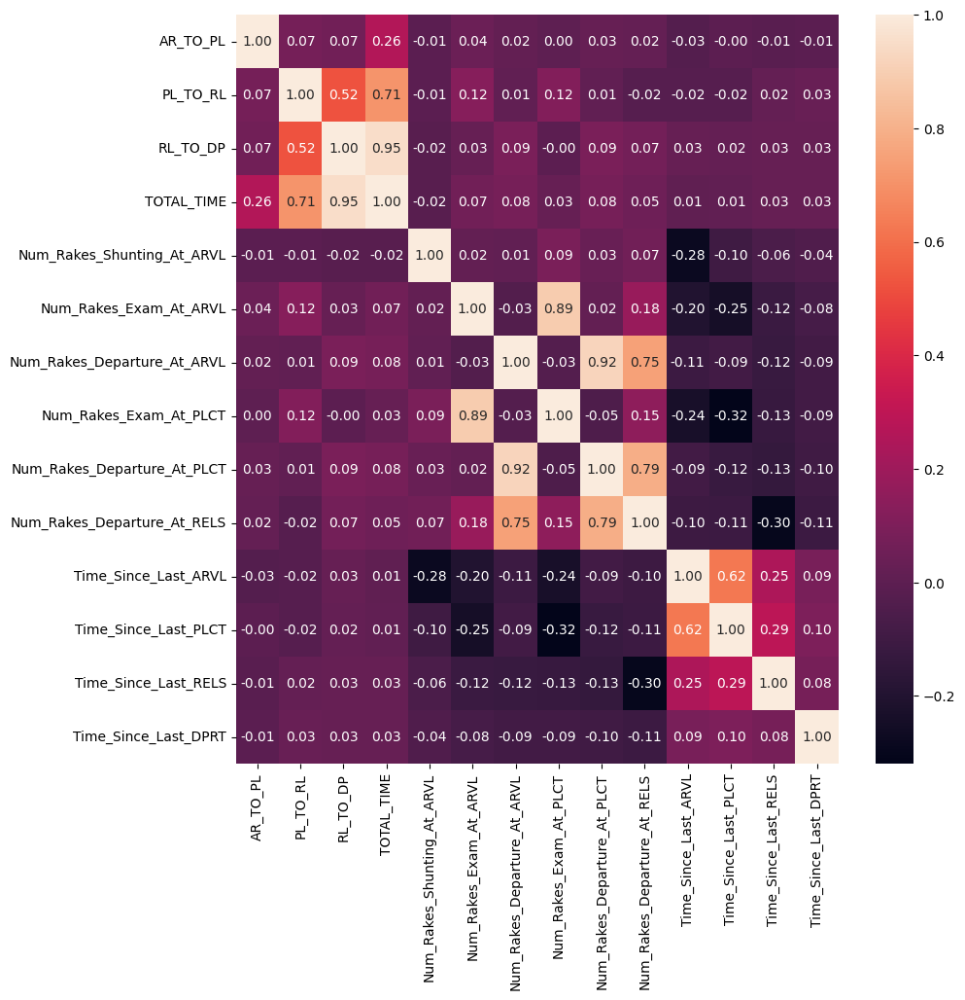

In [123]:
plt.figure(figsize=(10,10))
sns.heatmap(updated_corr, annot=True, fmt=".2f")
plt.show()

In [124]:
updated_corr_df1 = nkj_updated1.copy()

In [125]:
updated_corr_df1['R_DATEOFMONTH'] = updated_corr_df1['R_DATEOFMONTH'].dt.day
updated_corr_df1['R_MONTH'] = updated_corr_df1['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df1['R_WEEK'] = updated_corr_df1['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr1 = updated_corr_df1[['R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H']].corr()

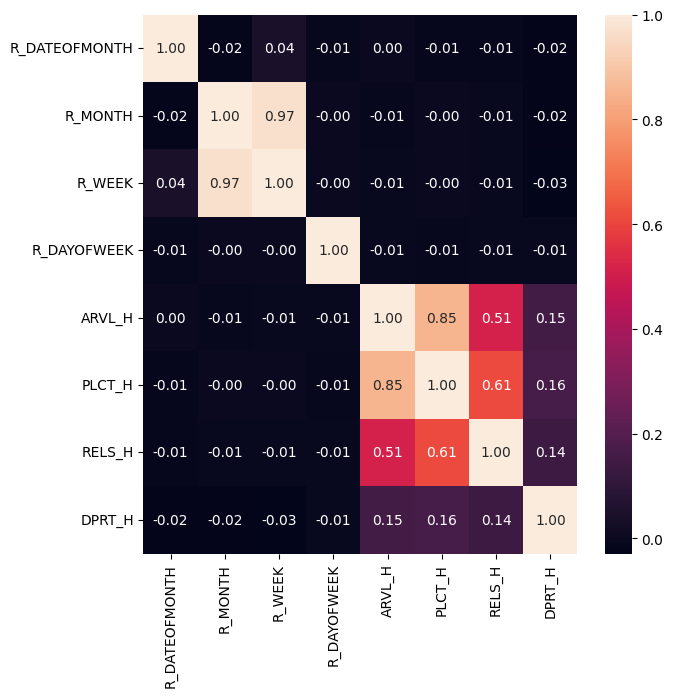

In [126]:
plt.figure(figsize=(7,7))
sns.heatmap(updated_corr1, annot=True, fmt=".2f")
plt.show()

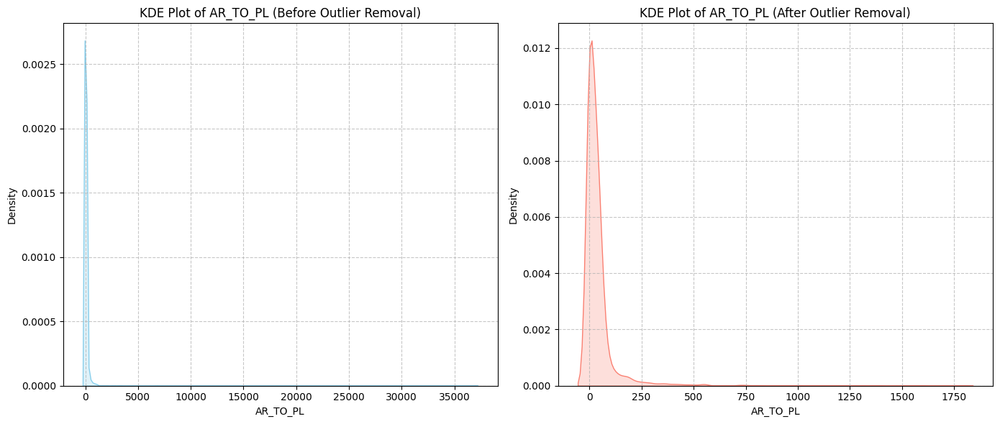

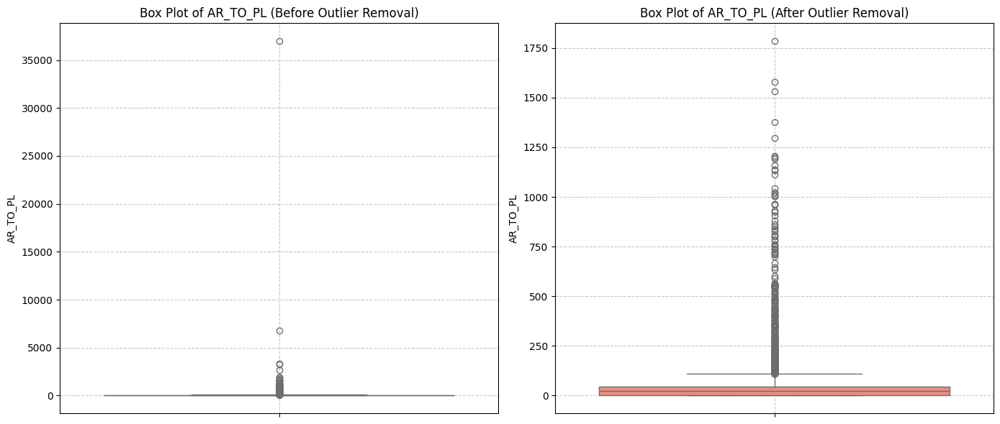

In [127]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(nkj['AR_TO_PL'], fill=True, color='skyblue')
plt.title('KDE Plot of AR_TO_PL (Before Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(nkj_updated1['AR_TO_PL'], fill=True, color='salmon')
plt.title('KDE Plot of AR_TO_PL (After Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=nkj['AR_TO_PL'], color='skyblue')
plt.title('Box Plot of AR_TO_PL (Before Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=nkj_updated1['AR_TO_PL'], color='salmon')
plt.title('Box Plot of AR_TO_PL (After Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

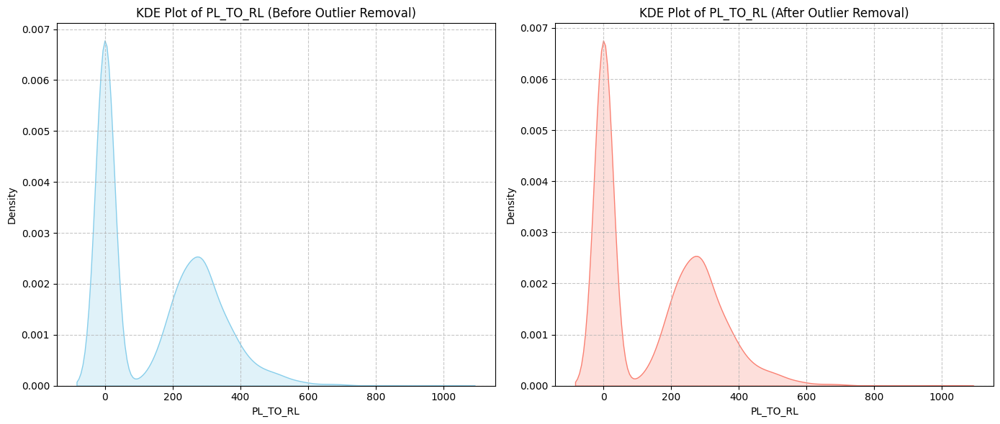

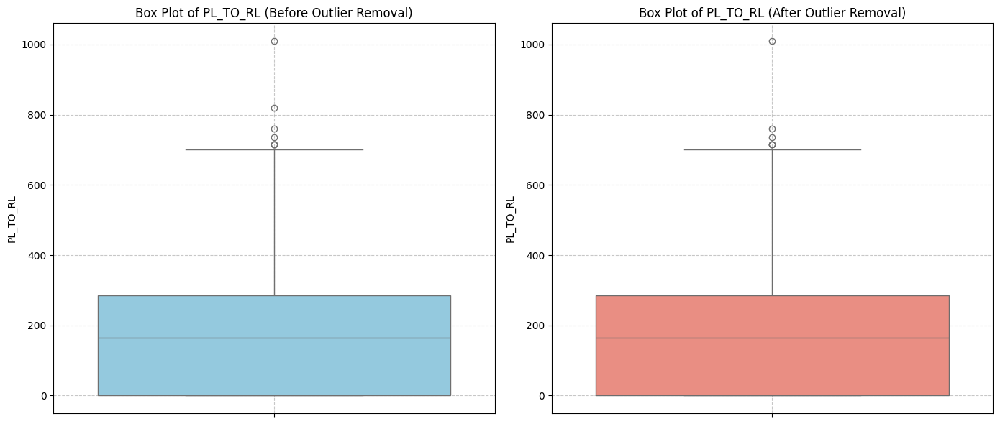

In [128]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(nkj['PL_TO_RL'], fill=True, color='skyblue')
plt.title('KDE Plot of PL_TO_RL (Before Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(nkj_updated1['PL_TO_RL'], fill=True, color='salmon')
plt.title('KDE Plot of PL_TO_RL (After Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=nkj['PL_TO_RL'], color='skyblue')
plt.title('Box Plot of PL_TO_RL (Before Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=nkj_updated1['PL_TO_RL'], color='salmon')
plt.title('Box Plot of PL_TO_RL (After Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

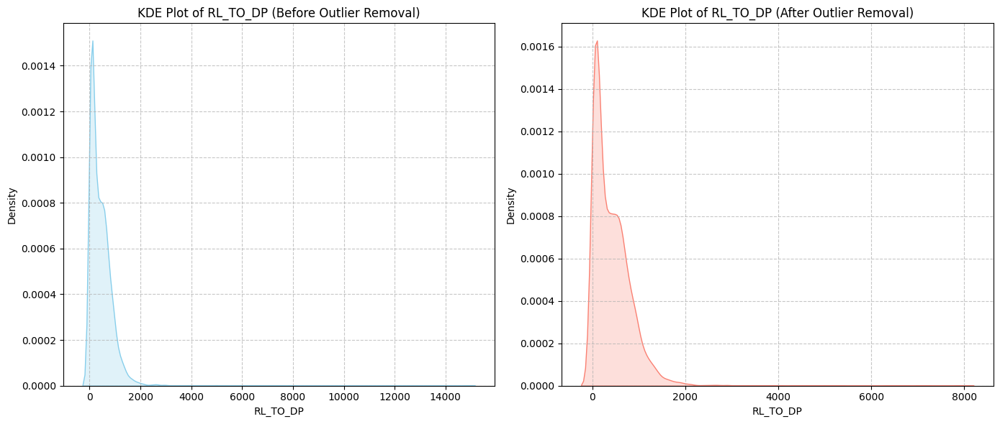

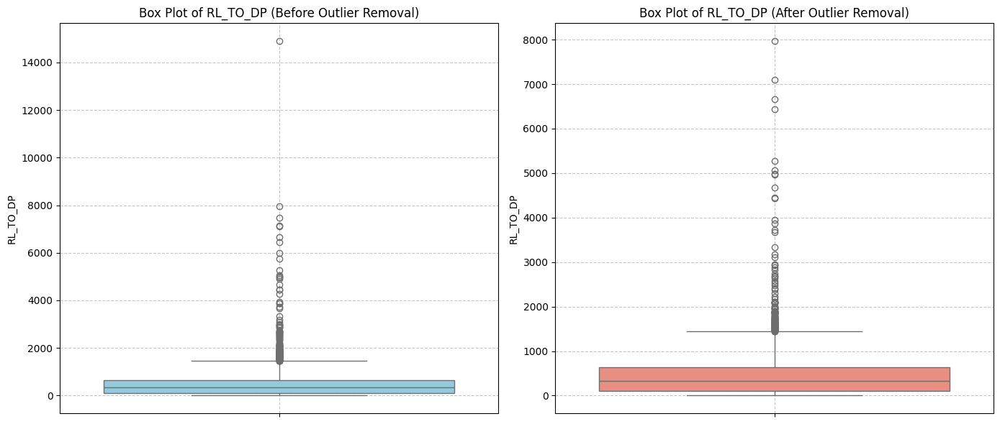

In [129]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(nkj['RL_TO_DP'], fill=True, color='skyblue')
plt.title('KDE Plot of RL_TO_DP (Before Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(nkj_updated1['RL_TO_DP'], fill=True, color='salmon')
plt.title('KDE Plot of RL_TO_DP (After Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=nkj['RL_TO_DP'], color='skyblue')
plt.title('Box Plot of RL_TO_DP (Before Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=nkj_updated1['RL_TO_DP'], color='salmon')
plt.title('Box Plot of RL_TO_DP (After Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Implementing Cyclic features

In [130]:
nkj_updated2 = nkj_updated1.copy()

In [131]:
nkj_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BOXN,NKJ,WC,20,180,464,664,2024-04-01,2024-04,...,0,0,0,0,0,2,0.0,0.0,40.0,174.0
1,2024-04-01,BOXN,NKJ,WC,125,0,130,255,2024-04-01,2024-04,...,0,1,0,1,1,1,35.0,30.0,30.0,40.0
2,2024-04-01,BOXN,NKJ,WC,0,0,120,120,2024-04-01,2024-04,...,1,1,0,1,0,0,95.0,110.0,0.0,0.0
3,2024-04-01,BOXN,NKJ,WC,230,0,90,320,2024-04-01,2024-04,...,0,0,1,1,2,2,270.0,45.0,45.0,45.0
4,2024-04-01,BOXNHL,NKJ,WC,0,0,0,0,2024-04-01,2024-04,...,1,0,1,0,1,1,90.0,330.0,290.0,200.0


In [132]:
nkj_updated2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6495 entries, 0 to 6593
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        6495 non-null   object        
 1   RAKETYPE                     6495 non-null   object        
 2   EXAMSTTN                     6495 non-null   object        
 3   ZONE                         6495 non-null   object        
 4   AR_TO_PL                     6495 non-null   int64         
 5   PL_TO_RL                     6495 non-null   int64         
 6   RL_TO_DP                     6495 non-null   int64         
 7   TOTAL_TIME                   6495 non-null   int64         
 8   R_DATEOFMONTH                6495 non-null   datetime64[ns]
 9   R_MONTH                      6495 non-null   object        
 10  R_DAYOFWEEK                  6495 non-null   int64         
 11  R_WEEK                       6495 non-null   obj

In [133]:
nkj_updated2['R_MONTH'] = nkj_updated2['R_MONTH'].str.split('-').str[1].astype('int64')
nkj_updated2['R_DATEOFMONTH'] = nkj_updated2['R_DATEOFMONTH'].dt.day
nkj_updated2['R_WEEK'] = nkj_updated2['R_WEEK'].str.split('-').str[1].astype('int64')


nkj_updated2['R_MONTH_sin'] = np.sin(2 * np.pi * nkj_updated2['R_MONTH'] / 12)
nkj_updated2['R_MONTH_cos'] = np.cos(2 * np.pi * nkj_updated2['R_MONTH'] / 12)

nkj_updated2['R_DAYOFWEEK_sin'] = np.sin(2 * np.pi * nkj_updated2['R_DAYOFWEEK'] / 7)
nkj_updated2['R_DAYOFWEEK_cos'] = np.cos(2 * np.pi * nkj_updated2['R_DAYOFWEEK'] / 7)

nkj_updated2['R_WEEK_sin'] = np.sin(2 * np.pi * nkj_updated2['R_WEEK'] / 52)
nkj_updated2['R_WEEK_cos'] = np.cos(2 * np.pi * nkj_updated2['R_WEEK'] / 52)

nkj_updated2['ARVL_H_sin'] = np.sin(2 * np.pi * nkj_updated2['ARVL_H'] / 24)
nkj_updated2['ARVL_H_cos'] = np.cos(2 * np.pi * nkj_updated2['ARVL_H'] / 24)


nkj_updated2.drop(columns=['R_MONTH', 'R_DAYOFWEEK', 'R_WEEK', 'ARVL_H', 'PLCT_H', 'RELS_H', 'DPRT_H'], axis=1, inplace=True)

nkj_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,...,Time_Since_Last_RELS,Time_Since_Last_DPRT,R_MONTH_sin,R_MONTH_cos,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos
0,2024-04-01,BOXN,NKJ,WC,20,180,464,664,1,0,...,40.0,174.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.500000,0.866025
1,2024-04-01,BOXN,NKJ,WC,125,0,130,255,1,0,...,30.0,40.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.500000,0.866025
2,2024-04-01,BOXN,NKJ,WC,0,0,120,120,1,1,...,0.0,0.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.866025,0.500000
3,2024-04-01,BOXN,NKJ,WC,230,0,90,320,1,0,...,45.0,45.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.707107,-0.707107
4,2024-04-01,BOXNHL,NKJ,WC,0,0,0,0,1,1,...,290.0,200.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,0.500000,-0.866025


### One Hot Encoding

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
categorical_cols = ['RAKETYPE']

In [136]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(nkj_updated2[categorical_cols])

In [137]:
encoded_col_names = encoder.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_features, columns=encoded_col_names, index=nkj_updated2.index)

In [138]:
nkj_updated3 = pd.concat([nkj_updated2, encoded_df], axis=1)
nkj_updated3 = nkj_updated3.drop(columns=categorical_cols)

In [139]:
nkj_updated3.drop(columns=['RDATE', 'EXAMSTTN','ZONE','TOTAL_TIME'], axis=1, inplace=True)

In [140]:
nkj_updated3

,AR_TO_PL,PL_TO_RL,RL_TO_DP,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,...,ARVL_H_cos,RAKETYPE_BCN,RAKETYPE_BCNAHSM1,RAKETYPE_BOBSNM1,RAKETYPE_BOXN,RAKETYPE_BOXNEL,RAKETYPE_BOXNHL,RAKETYPE_BOXNHL25T,RAKETYPE_BTAP,RAKETYPE_BV
0,20,180,464,1,0,0,0,0,0,2,...,8.660254e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,125,0,130,1,0,1,0,1,1,1,...,8.660254e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0,0,120,1,1,1,0,1,0,0,...,5.000000e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,230,0,90,1,0,0,1,1,2,2,...,-7.071068e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0,0,0,1,1,0,1,0,1,1,...,-8.660254e-01,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,0,0,77,31,0,2,6,2,6,6,...,-8.660254e-01,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6590,0,0,54,31,0,0,5,0,5,5,...,-5.000000e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6591,0,0,10,31,0,0,4,0,4,4,...,-1.836970e-16,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6592,0,0,0,31,0,0,4,0,4,4,...,2.588190e-01,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [141]:
nkj_updated3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6495 entries, 0 to 6593
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     6495 non-null   int64  
 1   PL_TO_RL                     6495 non-null   int64  
 2   RL_TO_DP                     6495 non-null   int64  
 3   R_DATEOFMONTH                6495 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   6495 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       6495 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  6495 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       6495 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  6495 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  6495 non-null   int64  
 10  Time_Since_Last_ARVL         6495 non-null   float64
 11  Time_Since_Last_PLCT         6495 non-null   float64
 12  Time_Since_Last_RELS         6495 non-null   float64
 13  Time_Since_Last_DPRT   

### Each time frame count analysis

In [148]:
shunting_time_count = nkj_updated3['AR_TO_PL'].value_counts().reset_index()
shunting_time_count.columns = ['AR_TO_PL','RAKE_COUNT']

shunting_time_count = shunting_time_count.sort_values(by='AR_TO_PL').reset_index(drop=True)
shunting_time_count.head(30)

,AR_TO_PL,RAKE_COUNT
0,0,2688
1,1,26
2,2,19
3,3,22
4,4,18
5,5,108
6,6,2
7,7,4
8,8,1
9,9,3


In [149]:
exam_time_count = nkj_updated3['PL_TO_RL'].value_counts().reset_index()
exam_time_count.columns = ['PL_TO_RL','RAKE_COUNT']

exam_time_count = exam_time_count.sort_values(by='PL_TO_RL').reset_index(drop=True)
exam_time_count.head(30)

,PL_TO_RL,RAKE_COUNT
0,0,3047
1,1,9
2,2,1
3,5,6
4,10,4
5,18,1
6,20,1
7,30,2
8,35,1
9,45,3


In [150]:
departure_time_count = nkj_updated3['RL_TO_DP'].value_counts().reset_index()
departure_time_count.columns = ['RL_TO_DP','RAKE_COUNT']

departure_time_count = departure_time_count.sort_values(by='RL_TO_DP').reset_index(drop=True)
departure_time_count.head(30)

,RL_TO_DP,RAKE_COUNT
0,0,186
1,1,52
2,2,11
3,3,7
4,4,6
5,5,78
6,6,6
7,7,1
8,8,5
9,9,3


# Model Selections Part - single stage (old)

### Preparing columns

In [151]:
nkj_final = nkj_updated3.copy()

In [152]:
nkj_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6495 entries, 0 to 6593
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     6495 non-null   int64  
 1   PL_TO_RL                     6495 non-null   int64  
 2   RL_TO_DP                     6495 non-null   int64  
 3   R_DATEOFMONTH                6495 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   6495 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       6495 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  6495 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       6495 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  6495 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  6495 non-null   int64  
 10  Time_Since_Last_ARVL         6495 non-null   float64
 11  Time_Since_Last_PLCT         6495 non-null   float64
 12  Time_Since_Last_RELS         6495 non-null   float64
 13  Time_Since_Last_DPRT   

In [153]:
target_cols = ['AR_TO_PL', 'PL_TO_RL', 'RL_TO_DP']

base_features = [col for col in nkj_final.columns if col not in target_cols]

X = nkj_final[base_features]
y = nkj_final[target_cols]

In [154]:
base_features

['R_DATEOFMONTH',
 'Num_Rakes_Shunting_At_ARVL',
 'Num_Rakes_Exam_At_ARVL',
 'Num_Rakes_Departure_At_ARVL',
 'Num_Rakes_Exam_At_PLCT',
 'Num_Rakes_Departure_At_PLCT',
 'Num_Rakes_Departure_At_RELS',
 'Time_Since_Last_ARVL',
 'Time_Since_Last_PLCT',
 'Time_Since_Last_RELS',
 'Time_Since_Last_DPRT',
 'R_MONTH_sin',
 'R_MONTH_cos',
 'R_DAYOFWEEK_sin',
 'R_DAYOFWEEK_cos',
 'R_WEEK_sin',
 'R_WEEK_cos',
 'ARVL_H_sin',
 'ARVL_H_cos',
 'RAKETYPE_BCN',
 'RAKETYPE_BCNAHSM1',
 'RAKETYPE_BOBSNM1',
 'RAKETYPE_BOXN',
 'RAKETYPE_BOXNEL',
 'RAKETYPE_BOXNHL',
 'RAKETYPE_BOXNHL25T',
 'RAKETYPE_BTAP',
 'RAKETYPE_BV']

In [155]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [156]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

In [157]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if not np.any(non_zero_indices):
        return np.nan

    return np.mean(np.abs((y_true[non_zero_indices] - y_pred[non_zero_indices]) / y_true[non_zero_indices])) * 100


In [158]:
models = {}
scalers = {}

## RandomForest Regressor

In [159]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

In [160]:
rfr_predictions = {}
rfr_metrics = {}

In [161]:
for target in target_cols:
    print(f"RandomForestRegressor model for target: {target}")
    rfr_model = Pipeline(steps=[('regressor', RandomForestRegressor(n_estimators=300, max_depth=15, min_samples_leaf=3, random_state=42, n_jobs=-1))])
    rfr_model.fit(X_train, y_train[target])
    models[f'RFR_{target}'] = rfr_model

    y_pred = rfr_model.predict(X_test)
    rfr_predictions[target] = y_pred

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    rfr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

RandomForestRegressor model for target: AR_TO_PL
 Mean Absolute Error (MAE): 43.77073214499792
 Mean Absolute Percentage Error (MAPE): 159.39618450699996
 Root Mean Squared Error (RMSE): 105.96253108002335
 R-squared (R2): 0.1284822455074004
RandomForestRegressor model for target: PL_TO_RL
 Mean Absolute Error (MAE): 101.9621055869739
 Mean Absolute Percentage Error (MAPE): 81.77781801708778
 Root Mean Squared Error (RMSE): 121.27938126745883
 R-squared (R2): 0.41076158215298353
RandomForestRegressor model for target: RL_TO_DP
 Mean Absolute Error (MAE): 274.434887380647
 Mean Absolute Percentage Error (MAPE): 657.4991544871874
 Root Mean Squared Error (RMSE): 386.56985812250326
 R-squared (R2): 0.12530318606667756


In [162]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))])}

In [163]:
rfr_predictions

{'AR_TO_PL': array([52.36128349, 25.59619697, 48.68412299, ..., 31.71797548,
        19.57250939, 27.27103599], shape=(1299,)),
 'PL_TO_RL': array([186.24360718, 183.87447364, 183.15351974, ..., 121.61203898,
         44.62548982, 116.14926159], shape=(1299,)),
 'RL_TO_DP': array([442.8439223 , 341.6163076 , 284.50220554, ..., 449.02981734,
        377.63306992, 460.57917904], shape=(1299,))}

In [164]:
rfr_metrics

{'AR_TO_PL': {'MAE': 43.77073214499792,
  'MAPE': np.float64(159.39618450699996),
  'RMSE': 105.96253108002335,
  'R2': 0.1284822455074004},
 'PL_TO_RL': {'MAE': 101.9621055869739,
  'MAPE': np.float64(81.77781801708778),
  'RMSE': 121.27938126745883,
  'R2': 0.41076158215298353},
 'RL_TO_DP': {'MAE': 274.434887380647,
  'MAPE': np.float64(657.4991544871874),
  'RMSE': 386.56985812250326,
  'R2': 0.12530318606667756}}

## SupportVector Regressor

In [165]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [166]:
svr_metrics = {}

Training SVR for target: AR_TO_PL
Evaluation for AR_TO_PL (SVR):
 Mean Absolute Error (MAE): 35.09333124737077
 Mean Absolute Percentage Error (MAPE): 125.53013732753134
 Root Mean Squared Error (RMSE): 109.56915655644696
 R-squared (R2): 0.06814523792921612


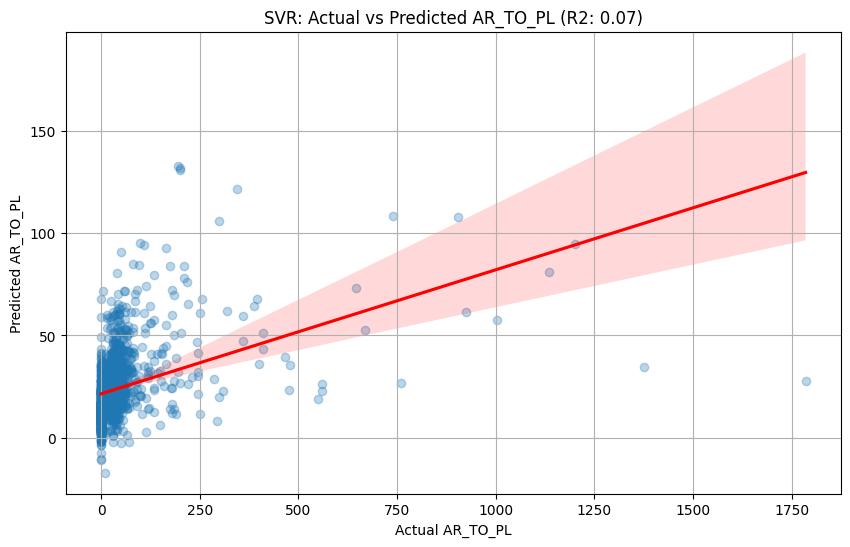

Training SVR for target: PL_TO_RL
Evaluation for PL_TO_RL (SVR):
 Mean Absolute Error (MAE): 117.690513855127
 Mean Absolute Percentage Error (MAPE): 125.27228909312309
 Root Mean Squared Error (RMSE): 147.7397339844912
 R-squared (R2): 0.12559680696059505


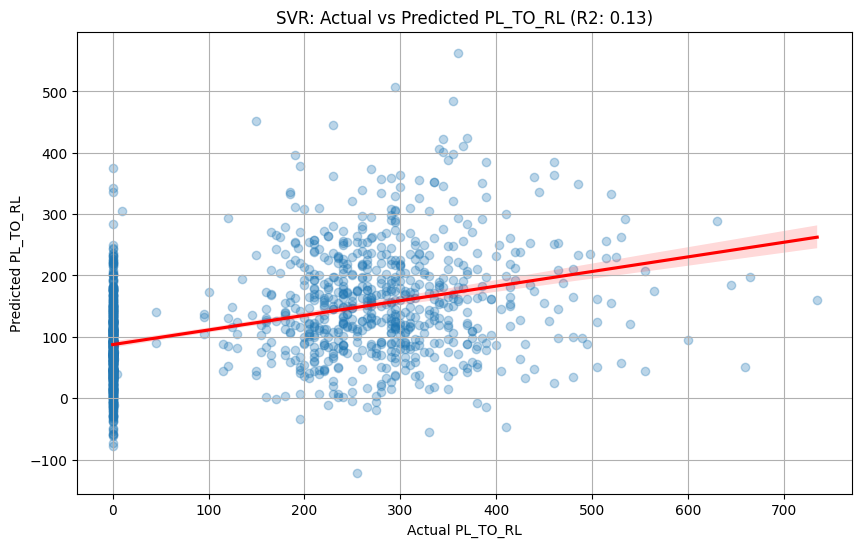

Training SVR for target: RL_TO_DP
Evaluation for RL_TO_DP (SVR):
 Mean Absolute Error (MAE): 267.0939854920158
 Mean Absolute Percentage Error (MAPE): 595.914246621191
 Root Mean Squared Error (RMSE): 399.70497895813435
 R-squared (R2): 0.06485127726813811


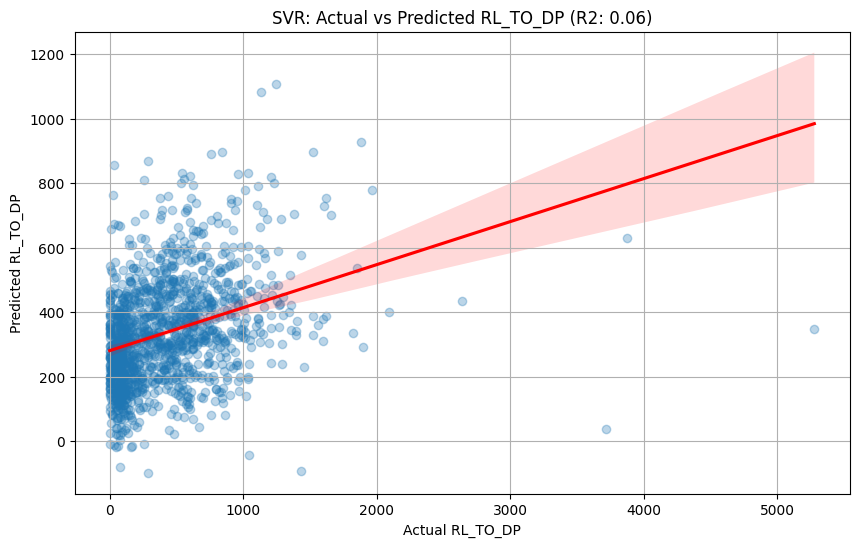

In [167]:
for target in target_cols:
    print(f"Training SVR for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

    svr_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'SVR_{target}'] = svr_model
    scalers[f'SVR_X_scaler_{target}'] = scaler_X
    scalers[f'SVR_y_scaler_{target}'] = scaler_y

    y_pred_scaled = svr_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    svr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (SVR):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'SVR: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [168]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR()}

In [169]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler()}

In [170]:
svr_metrics

{'AR_TO_PL': {'MAE': 35.09333124737077,
  'MAPE': np.float64(125.53013732753134),
  'RMSE': 109.56915655644696,
  'R2': 0.06814523792921612},
 'PL_TO_RL': {'MAE': 117.690513855127,
  'MAPE': np.float64(125.27228909312309),
  'RMSE': 147.7397339844912,
  'R2': 0.12559680696059505},
 'RL_TO_DP': {'MAE': 267.0939854920158,
  'MAPE': np.float64(595.914246621191),
  'RMSE': 399.70497895813435,
  'R2': 0.06485127726813811}}

## KNN

In [171]:
from sklearn.neighbors import KNeighborsRegressor

In [172]:
knn_metrics = {}

Training KNN for target: AR_TO_PL
Evaluation for AR_TO_PL (KNN):
 Mean Absolute Error (MAE): 48.37312980849847
 Mean Absolute Percentage Error (MAPE): 161.55176602370346
 Root Mean Squared Error (RMSE): 118.433512715132
 R-squared (R2): -0.08873156151339234


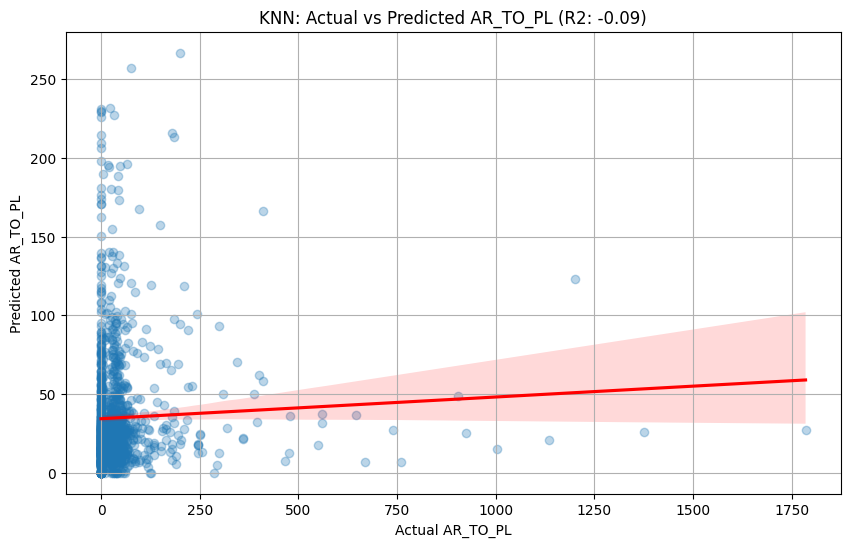

Training KNN for target: PL_TO_RL
Evaluation for PL_TO_RL (KNN):
 Mean Absolute Error (MAE): 134.32148855709897
 Mean Absolute Percentage Error (MAPE): 121.60252264132032
 Root Mean Squared Error (RMSE): 160.03910194223735
 R-squared (R2): -0.026051880775603165


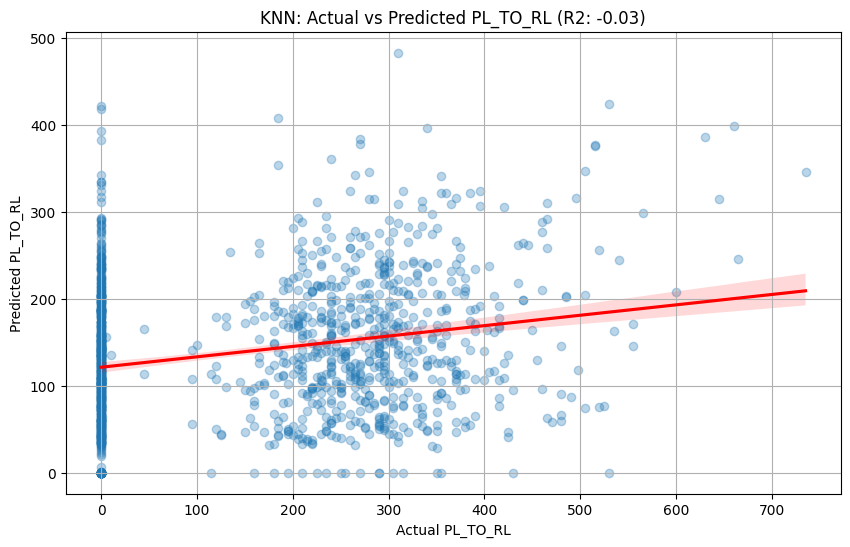

Training KNN for target: RL_TO_DP
Evaluation for RL_TO_DP (KNN):
 Mean Absolute Error (MAE): 312.6860836278008
 Mean Absolute Percentage Error (MAPE): 731.1268432964473
 Root Mean Squared Error (RMSE): 436.9063043219242
 R-squared (R2): -0.11732159216410576


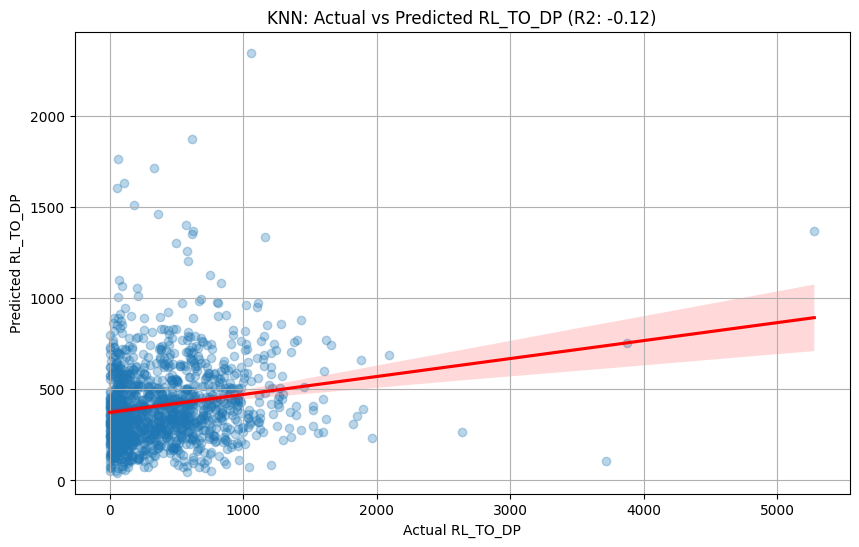

In [173]:
for target in target_cols:
    print(f"Training KNN for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    knn_model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean')

    knn_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'KNN_{target}'] = knn_model
    scalers[f'KNN_X_scaler_{target}'] = scaler_X
    scalers[f'KNN_y_scaler_{target}'] = scaler_y

    y_pred_scaled = knn_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    knn_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (KNN):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'KNN: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [174]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [175]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler(),
 'KNN_X_scaler_AR_TO_PL': StandardScaler(),
 'KNN_y_scaler_AR_TO_PL': StandardScaler(),
 'KNN_X_scaler_PL_TO_RL': StandardScaler(),
 'KNN_y_scaler_PL_TO_RL': StandardScaler(),
 'KNN_X_scaler_RL_TO_DP': StandardScaler(),
 'KNN_y_scaler_RL_TO_DP': StandardScaler()}

In [176]:
knn_metrics

{'AR_TO_PL': {'MAE': 48.37312980849847,
  'MAPE': np.float64(161.55176602370346),
  'RMSE': 118.433512715132,
  'R2': -0.08873156151339234},
 'PL_TO_RL': {'MAE': 134.32148855709897,
  'MAPE': np.float64(121.60252264132032),
  'RMSE': 160.03910194223735,
  'R2': -0.026051880775603165},
 'RL_TO_DP': {'MAE': 312.6860836278008,
  'MAPE': np.float64(731.1268432964473),
  'RMSE': 436.9063043219242,
  'R2': -0.11732159216410576}}

## XGBoost Regressor

In [177]:
from xgboost import XGBRegressor

In [178]:
xgb_metrics = {}

Training XGBoost for target: AR_TO_PL
Evaluation for AR_TO_PL (XGBoost):
 Mean Absolute Error (MAE): 40.790348052978516
 Mean Absolute Percentage Error (MAPE): 159.56005094119828
 Root Mean Squared Error (RMSE): 94.96780395507812
 R-squared (R2): 0.2999575138092041


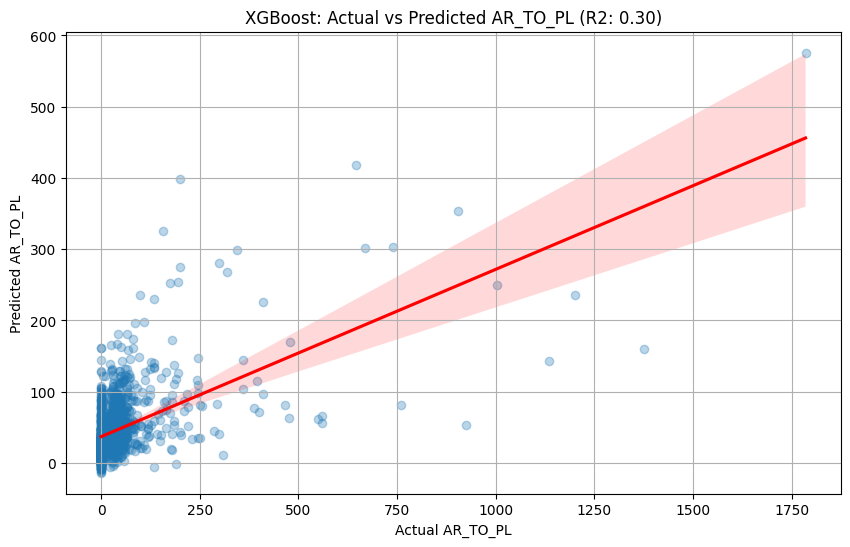

Training XGBoost for target: PL_TO_RL
Evaluation for PL_TO_RL (XGBoost):
 Mean Absolute Error (MAE): 89.35017395019531
 Mean Absolute Percentage Error (MAPE): 69.42382055348136
 Root Mean Squared Error (RMSE): 113.02497100830078
 R-squared (R2): 0.48824048042297363


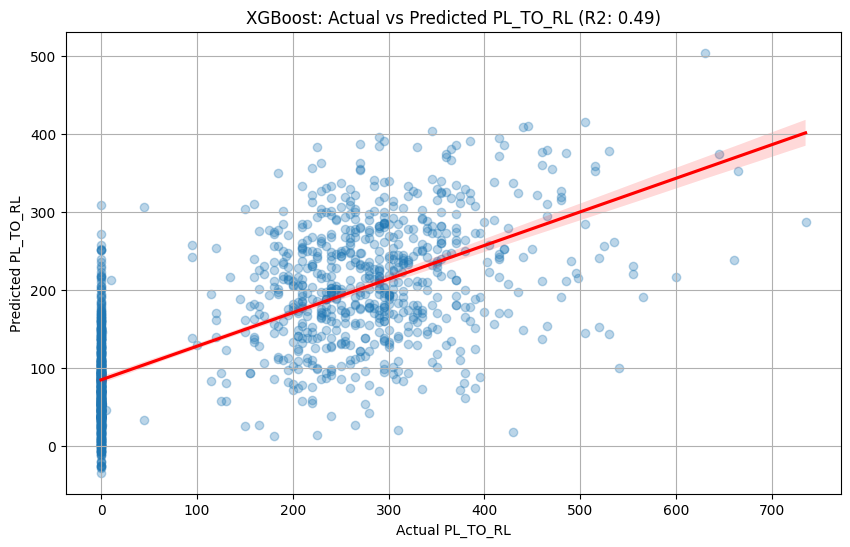

Training XGBoost for target: RL_TO_DP
Evaluation for RL_TO_DP (XGBoost):
 Mean Absolute Error (MAE): 258.5490417480469
 Mean Absolute Percentage Error (MAPE): 613.5155384490673
 Root Mean Squared Error (RMSE): 372.9129638671875
 R-squared (R2): 0.18601477146148682


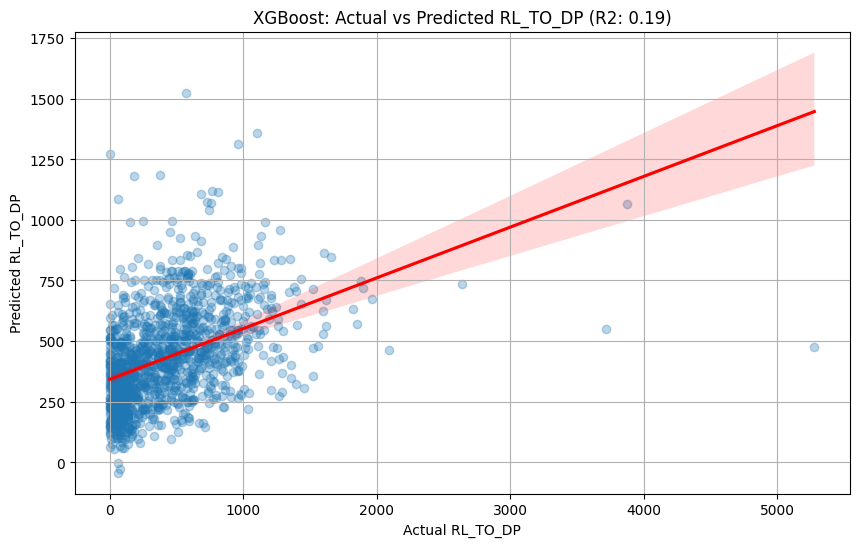

In [179]:
for target in target_cols:
    print(f"Training XGBoost for target: {target}")

    xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=250, max_depth=8, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=42, n_jobs=-1)

    xgb_model.fit(X_train, y_train[target])
    models[f'XGBoost_{target}'] = xgb_model

    y_pred = xgb_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    xgb_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (XGBoost):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'XGBoost: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [180]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [181]:
xgb_metrics

{'AR_TO_PL': {'MAE': 40.790348052978516,
  'MAPE': np.float64(159.56005094119828),
  'RMSE': 94.96780395507812,
  'R2': 0.2999575138092041},
 'PL_TO_RL': {'MAE': 89.35017395019531,
  'MAPE': np.float64(69.42382055348136),
  'RMSE': 113.02497100830078,
  'R2': 0.48824048042297363},
 'RL_TO_DP': {'MAE': 258.5490417480469,
  'MAPE': np.float64(613.5155384490673),
  'RMSE': 372.9129638671875,
  'R2': 0.18601477146148682}}

## LightGBM Regressor

In [182]:
from lightgbm import LGBMRegressor

In [183]:
lgbm_metrics = {}

Training LightGBM for target: AR_TO_PL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1034
[LightGBM] [Info] Number of data points in the train set: 5196, number of used features: 24
[LightGBM] [Info] Start training from score 43.040416
Evaluation for AR_TO_PL (LightGBM):
 Mean Absolute Error (MAE): 42.13188621407458
 Mean Absolute Percentage Error (MAPE): 154.5242944000065
 Root Mean Squared Error (RMSE): 101.71485045562565
 R-squared (R2): 0.1969541877047397


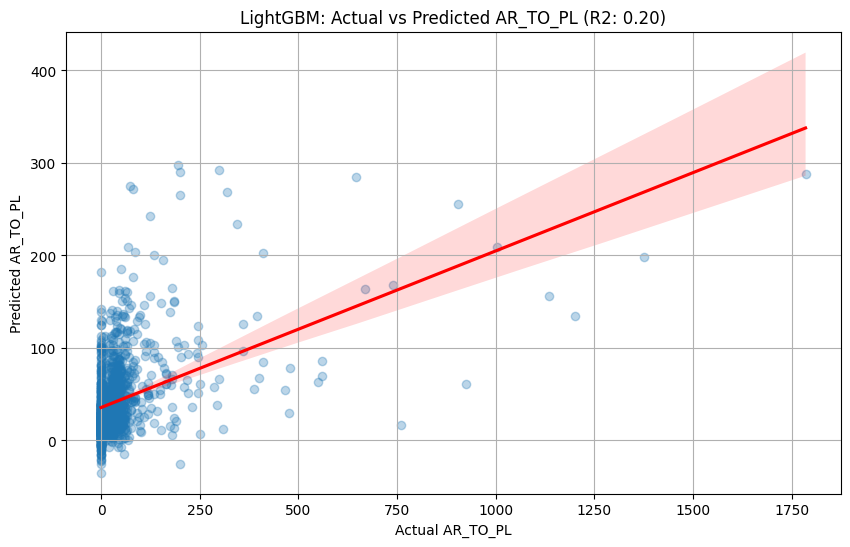

Training LightGBM for target: PL_TO_RL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1034
[LightGBM] [Info] Number of data points in the train set: 5196, number of used features: 24
[LightGBM] [Info] Start training from score 154.680331
Evaluation for PL_TO_RL (LightGBM):
 Mean Absolute Error (MAE): 89.58023973829286
 Mean Absolute Percentage Error (MAPE): 69.47781461867848
 Root Mean Squared Error (RMSE): 112.46077430579143
 R-squared (R2): 0.4933369325179018


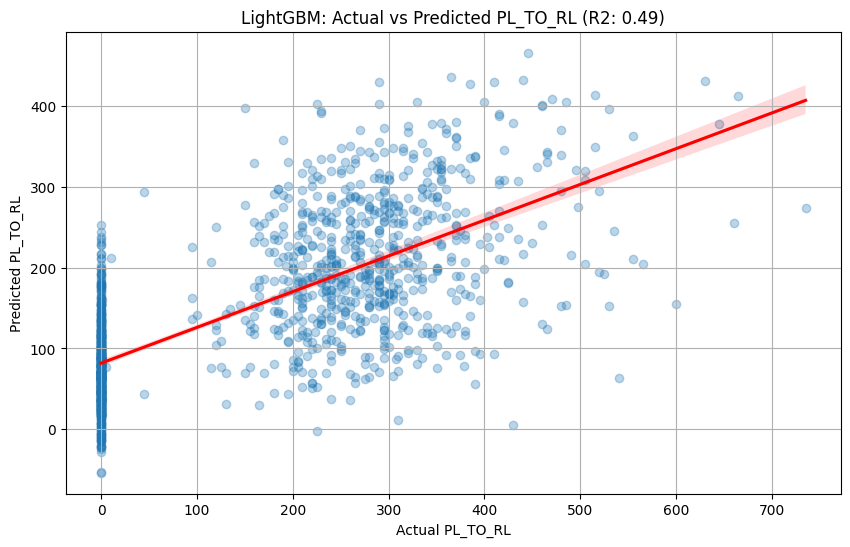

Training LightGBM for target: RL_TO_DP
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1034
[LightGBM] [Info] Number of data points in the train set: 5196, number of used features: 24
[LightGBM] [Info] Start training from score 432.643380
Evaluation for RL_TO_DP (LightGBM):
 Mean Absolute Error (MAE): 263.432896360525
 Mean Absolute Percentage Error (MAPE): 618.7074314448208
 Root Mean Squared Error (RMSE): 379.311098661502
 R-squared (R2): 0.15784376273590783


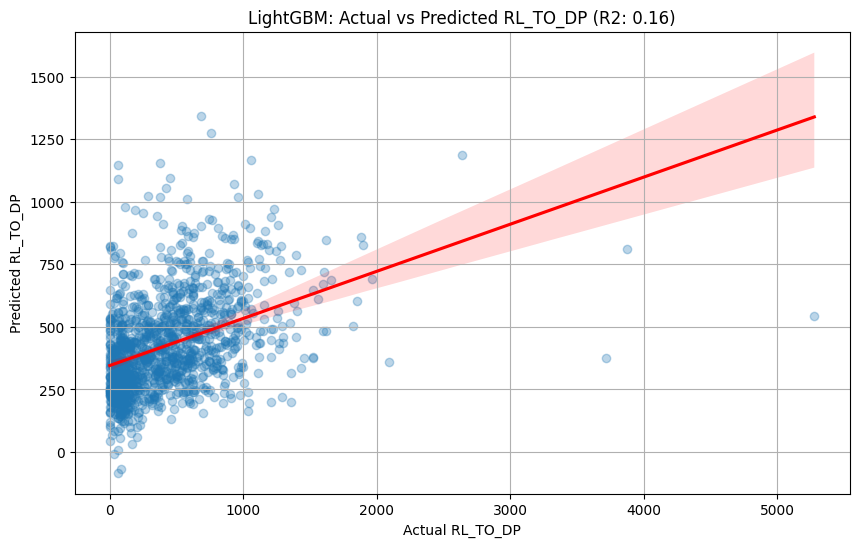

In [184]:
for target in target_cols:
    print(f"Training LightGBM for target: {target}")

    lgbm_model = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

    lgbm_model.fit(X_train, y_train[target])
    models[f'LightGBM_{target}'] = lgbm_model

    y_pred = lgbm_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    lgbm_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (LightGBM):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'LightGBM: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [185]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [186]:
lgbm_metrics

{'AR_TO_PL': {'MAE': 42.13188621407458,
  'MAPE': np.float64(154.5242944000065),
  'RMSE': 101.71485045562565,
  'R2': 0.1969541877047397},
 'PL_TO_RL': {'MAE': 89.58023973829286,
  'MAPE': np.float64(69.47781461867848),
  'RMSE': 112.46077430579143,
  'R2': 0.4933369325179018},
 'RL_TO_DP': {'MAE': 263.432896360525,
  'MAPE': np.float64(618.7074314448208),
  'RMSE': 379.311098661502,
  'R2': 0.15784376273590783}}

## Overall Performance metrics

In [189]:
metrics = {}
metrics['rfr'] = rfr_metrics
metrics['svr'] = svr_metrics
metrics['knn'] = knn_metrics
metrics['xgb'] = xgb_metrics
metrics['lgbm'] = lgbm_metrics
metrics

{'rfr': {'AR_TO_PL': {'MAE': 43.77073214499792,
   'MAPE': np.float64(159.39618450699996),
   'RMSE': 105.96253108002335,
   'R2': 0.1284822455074004},
  'PL_TO_RL': {'MAE': 101.9621055869739,
   'MAPE': np.float64(81.77781801708778),
   'RMSE': 121.27938126745883,
   'R2': 0.41076158215298353},
  'RL_TO_DP': {'MAE': 274.434887380647,
   'MAPE': np.float64(657.4991544871874),
   'RMSE': 386.56985812250326,
   'R2': 0.12530318606667756}},
 'svr': {'AR_TO_PL': {'MAE': 35.09333124737077,
   'MAPE': np.float64(125.53013732753134),
   'RMSE': 109.56915655644696,
   'R2': 0.06814523792921612},
  'PL_TO_RL': {'MAE': 117.690513855127,
   'MAPE': np.float64(125.27228909312309),
   'RMSE': 147.7397339844912,
   'R2': 0.12559680696059505},
  'RL_TO_DP': {'MAE': 267.0939854920158,
   'MAPE': np.float64(595.914246621191),
   'RMSE': 399.70497895813435,
   'R2': 0.06485127726813811}},
 'knn': {'AR_TO_PL': {'MAE': 48.37312980849847,
   'MAPE': np.float64(161.55176602370346),
   'RMSE': 118.4335127151

## Feature Importance

In [190]:
import shap

c:\Coding_files\ML_Bootcamp\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Key SHAP Plots and Their Interpretation:

SHAP Summary Plot (Beeswarm Plot):

Purpose: Provides a global overview of feature importance and the direction of their impact across many predictions.

Interpretation:
Features are ordered by overall importance (top is most important).
Points to the right (positive SHAP value) push the prediction higher.
Points to the left (negative SHAP value) push the prediction lower.
Color (red for high feature value, blue for low) shows if high/low values of a feature contribute to higher/lower predictions.


SHAP Force Plot (Individual Prediction Explanation):

Purpose: Explains one specific prediction in detail.

Interpretation:
Starts from the base_value (average prediction).
Red features push the prediction higher.
Blue features push the prediction lower.
The length of the bar indicates the magnitude of the impact.
The final predicted value is shown at the end.


SHAP Dependence Plot:

Purpose: Visualizes the relationship between a single feature's value and its impact (SHAP value) on the model's prediction. Can also show interaction effects.

Interpretation:
See if the relationship is linear, curved, or has thresholds.
Points are colored by another interacting feature (if specified, or SHAP finds the best one). This helps you understand if the effect of the primary feature changes depending on the value of the interacting feature.

In [191]:
target_to_explain = ['XGBoost_AR_TO_PL','XGBoost_PL_TO_RL','XGBoost_RL_TO_DP']


Explaining predictions for XGBoost_AR_TO_PL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_AR_TO_PL:


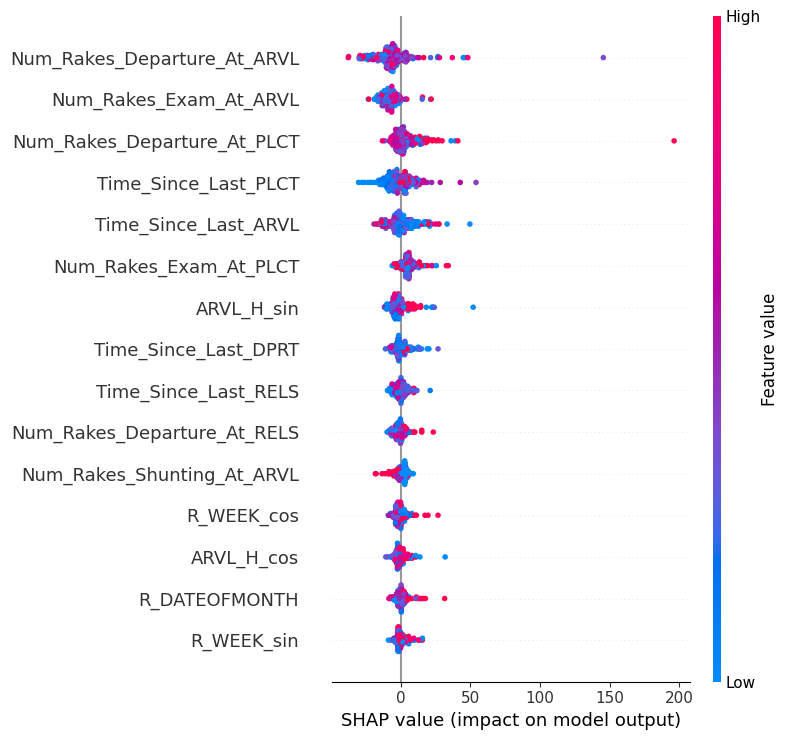

Displaying SHAP Force Plot for instance 0 for XGBoost_AR_TO_PL:


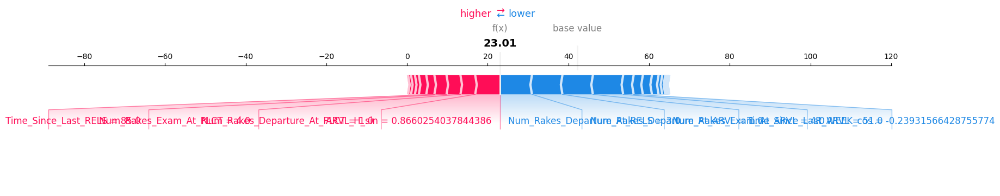


Actual prediction for instance 0: 23.01
Base (Expected) value for XGBoost_AR_TO_PL: 42.23
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'ARVL_H_sin' vs XGBoost_AR_TO_PL:


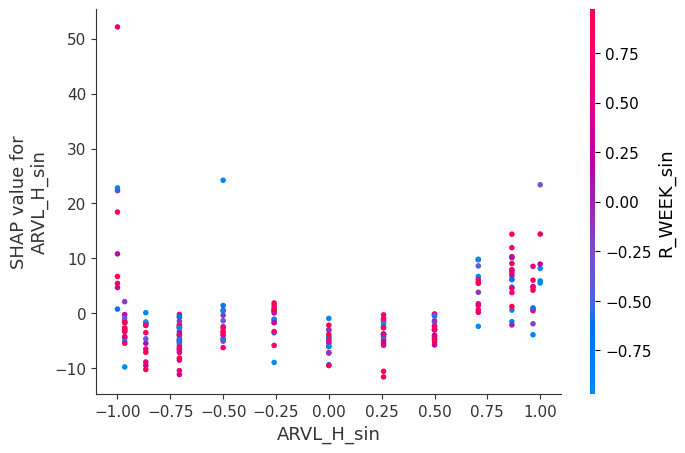

In [192]:
model_to_explain = models[target_to_explain[0]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[0]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[0]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[0]} (without TOTAL_TIME)')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[0]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[0]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[0]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'PLCT_H_sin' (placement hour) affects 'PL_TO_RL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'ARVL_H_sin' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[0]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[0]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for XGBoost_PL_TO_RL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_PL_TO_RL:


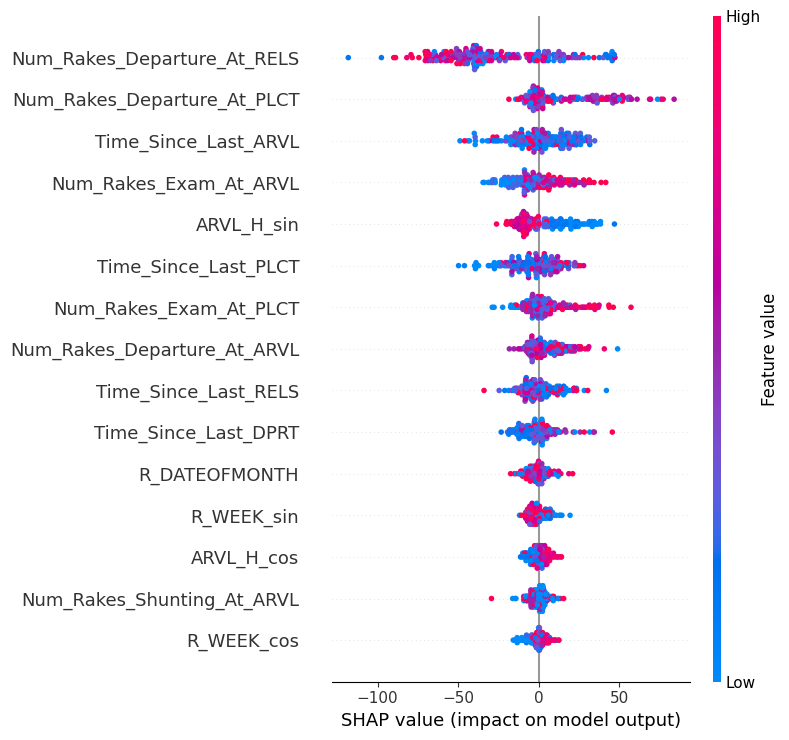

Displaying SHAP Force Plot for instance 0 for XGBoost_PL_TO_RL:


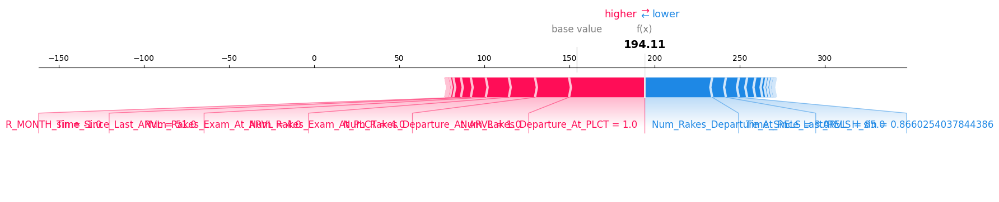


Actual prediction for instance 0: 194.11
Base (Expected) value for XGBoost_PL_TO_RL: 154.25
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs XGBoost_PL_TO_RL:


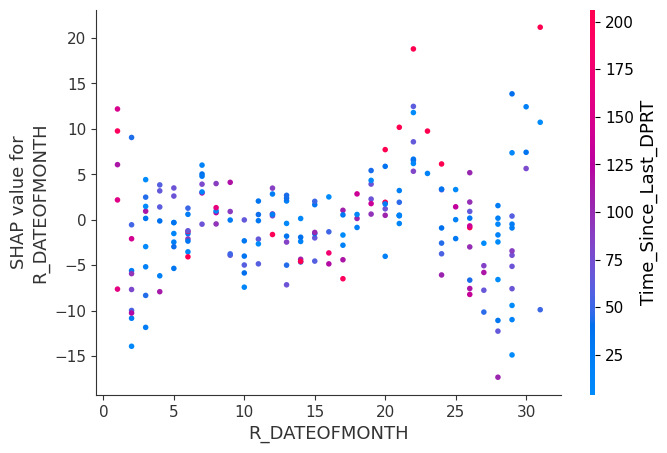

In [193]:
model_to_explain = models[target_to_explain[1]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[1]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[1]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[1]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[1]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[1]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[1]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[1]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[1]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for XGBoost_RL_TO_DP for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_RL_TO_DP:


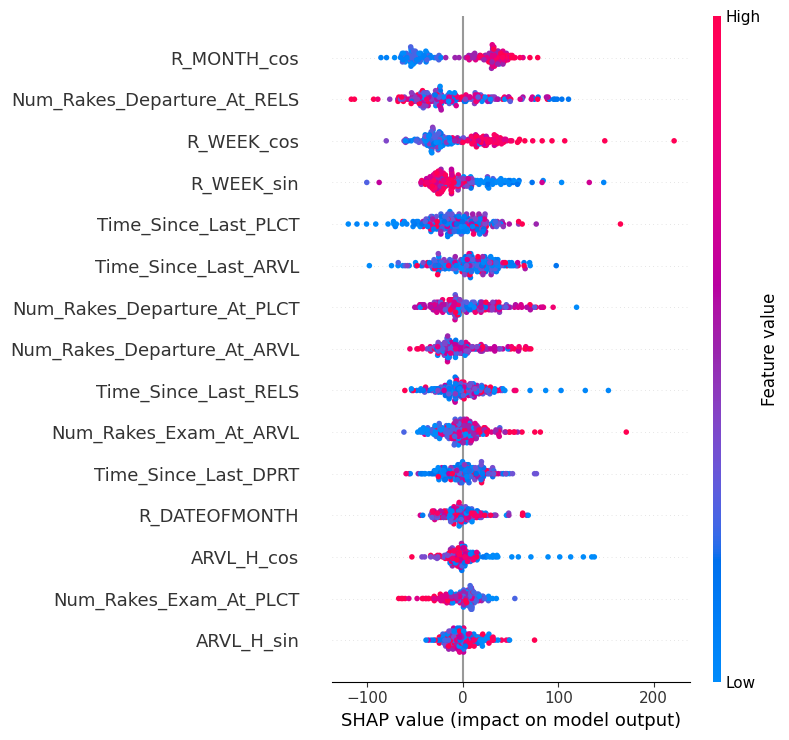

Displaying SHAP Force Plot for instance 0 for XGBoost_RL_TO_DP:


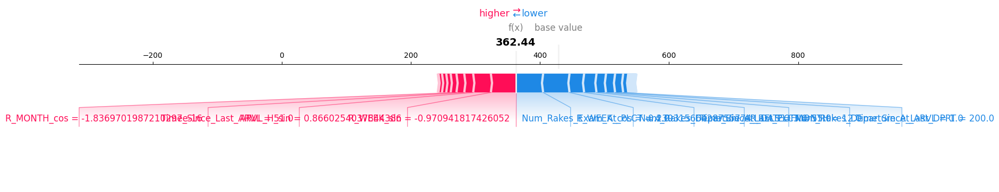


Actual prediction for instance 0: 362.44
Base (Expected) value for XGBoost_RL_TO_DP: 428.67
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs XGBoost_RL_TO_DP:


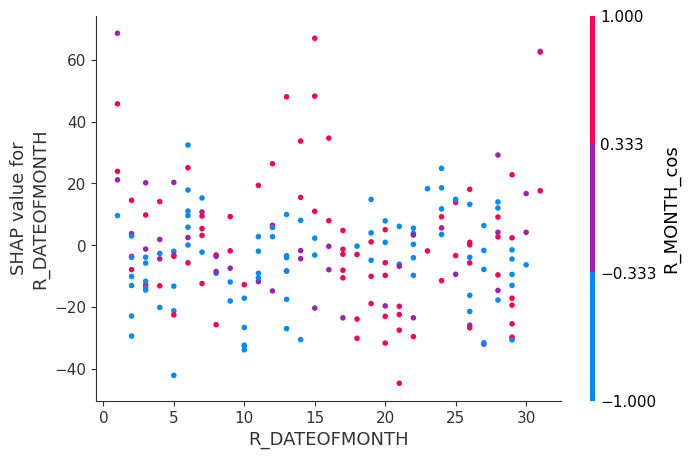

In [194]:
model_to_explain = models[target_to_explain[2]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[2]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[2]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[2]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[2]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[2]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[2]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[2]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[2]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")